In [3]:
import os
import json
import re
import math
from datetime import datetime, timedelta

import numpy as np
import pandas as pd
from matplotlib import pyplot as plt

from skimage.io import imread, imsave
from skimage.transform import warp
from scipy.optimize import curve_fit
from scipy.signal import savgol_filter, find_peaks
import scipy.stats as stats
from scipy.integrate import odeint, solve_ivp
from numba import njit, prange
from skimage.filters import gaussian
from scipy.ndimage import uniform_filter1d
from numpy.polynomial import Polynomial

In [36]:
def plot_dlrho(dlkymo_rho, edt, rs, pos, fluo_chns,t0):
    wdlkymo_rho = np.zeros_like(dlkymo_rho)
    nt, _ = dlkymo_rho.shape
    
    if fluo_chns == 3:
        for c in range(fluo_chns-1):
            wdlkymo_rho[:,:,c] = warp(dlkymo_rho[:,:,c], map_edt, {'edt':edt, 'rs':rs})
        wdlkymo_rho[np.isnan(dlkymo_rho)] = np.nan
        
        plt.figure(figsize=(7,2))
        plt.subplot(1, 2, 1)
        plt.imshow(np.hstack([wdlkymo_rho[t0:,::-1,0],wdlkymo_rho[t0:,:,0]]).transpose(), 
                aspect='auto', 
                extent=[t0,nt,-edt.max(),edt.max()],
                vmin=-0.1, vmax=0.1,
                cmap='jet')
        plt.colorbar()
        plt.xlabel('Time (frames)')
        plt.ylabel('Radial distance (pixels)')
        plt.title('$d\mathrm{log}\\rho_{rc}/dt$')
        
        plt.subplot(1, 2, 2)
        plt.imshow(np.hstack([wdlkymo_rho[t0:,::-1,1],wdlkymo_rho[t0:,:,1]]).transpose(), 
                aspect='auto', 
                extent=[t0,nt,-edt.max(),edt.max()],
                vmin=-0.1, vmax=0.1,
                cmap='jet')
        plt.colorbar()
        plt.xlabel('Time (frames)')
        plt.ylabel('Radial distance (pixels)')
        plt.title('$d\mathrm{log}\\rho_{yc}/dt$')
        
        plt.tight_layout()
        #plt.savefig(path_save, dpi=300)

    else:
        wdlkymo_rho[:,:] = warp(dlkymo_rho[:,:], map_edt, {'edt':edt, 'rs':rs})
        wdlkymo_rho[np.isnan(dlkymo_rho)] = np.nan
        
        plt.figure(figsize=(7,2))
        #plt.subplot(1, 2, 1)
        plt.imshow(np.hstack([wdlkymo_rho[t0:,::-1],wdlkymo_rho[t0:,:]]).transpose(), 
                aspect='auto', 
                extent=[t0,nt,-edt.max(),edt.max()],
                vmin=-0.1, vmax=0.1,
                cmap='jet')
        plt.colorbar()
        plt.xlabel('Time (frames)')
        plt.ylabel('Radial distance (pixels)')
        plt.title('$d\mathrm{log}\\rho_{yc}/dt$')
        plt.tight_layout()
        #plt.savefig(path_save, dpi=300)

In [5]:
def map_edt(p, edt, rs):
    rstep = np.mean(np.diff(rs))
    npos = p.shape[0]
    for i in range(npos):
        r,t = p[i,:].astype(int)
        # transformation from distance from the center
        p[i,0] = (edt[t,:,:].max() - rs[r]) / rstep
    return p

In [6]:
#path_ext = '/media/c1046372/Expansion/Thesis GY/3. Analyzed files'
path_ext = '/media/guillermo/Expansion/Thesis GY/3. Analyzed files'
#/Ti scope/2023_11_28/2023_11_28_10x_1.0x_pAAA_Ti_Pos6.ome.tif

In [7]:
#scope_name = 'Tweez scope'
#scope_name = 'Ti scope'
#path_scope = os.path.join(path_ext, scope_name)
#exp_date = '2023_12_08'
#path = os.path.join(path_scope, exp_date)
folder_masks = 'contour_masks'
folder_results = 'results'
folder_fluo = 'fluo'
folder_graphs = 'graphs'
folder_velocity = 'velocity_data'
vectors = ['pAAA', 'pLPT20&41', 'pLPT107&41', 'pLPT119&41']
channels = {'pAAA': {'rfp':0,'yfp':1,'cfp':2,'phase':3},
            'pLPT20&41': {'yfp':0,'cfp':1,'phase':2}, 
            'pLPT119&41': {'yfp':0,'cfp':1,'phase':2},
            'pLPT107&41': {'rfp':0,'yfp':1,'cfp':2,'phase':3}}
scopes = {'Tweez scope': 'TiTweez', 'Ti scope': 'Ti'}
dnas = {'pLPT20&pLPT41': 'pLPT20&41', 'pLPT119&pLPT41': 'pLPT119&41', 'pAAA': 'pAAA', 'pLPT107&pLPT41': 'pLPT107&41'}
#vector = 'pLPT20&pLPT41'

In [12]:
exp_sum = pd.read_excel('../Notebooks/Exps_summary.xlsx')
exp_sum['formatted_dates'] = exp_sum['Date'].dt.strftime('%Y_%m_%d')
positions = pd.read_excel('../Notebooks/Positions.xlsx')
#exp_sum['formatted_dates'] = exp_sum['Date'].dt.strftime('%Y_%m_%d')
#i = exp_sum[(exp_sum.formatted_dates == exp_date) & (exp_sum.Machine == scope_name)].index[0]

Pos 0
2023_11_15_Ti_pLPT20&pLPT41


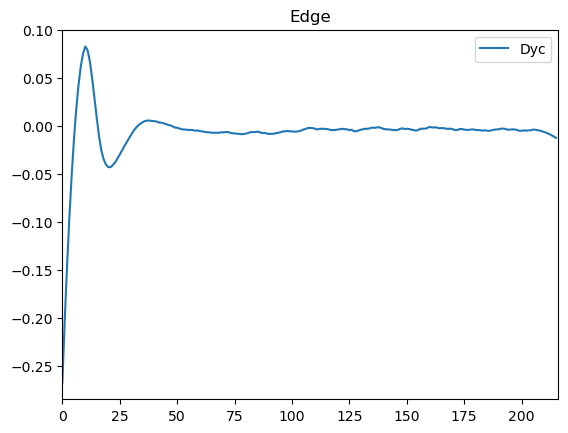

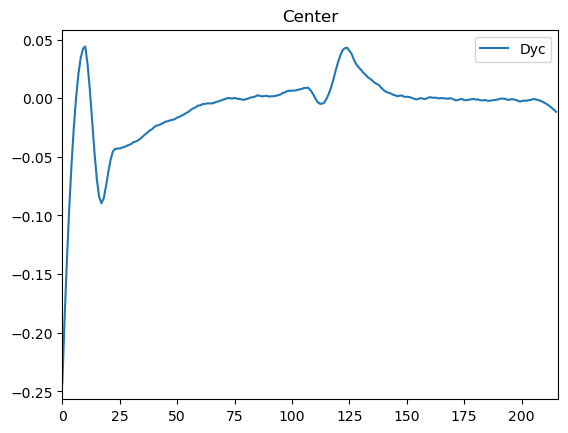

Pos 1
2023_11_15_Ti_pLPT20&pLPT41


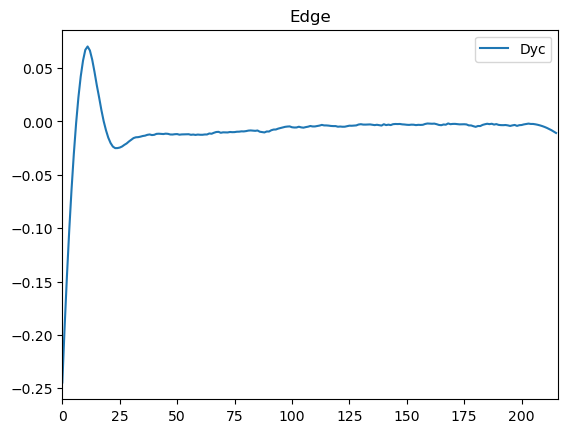

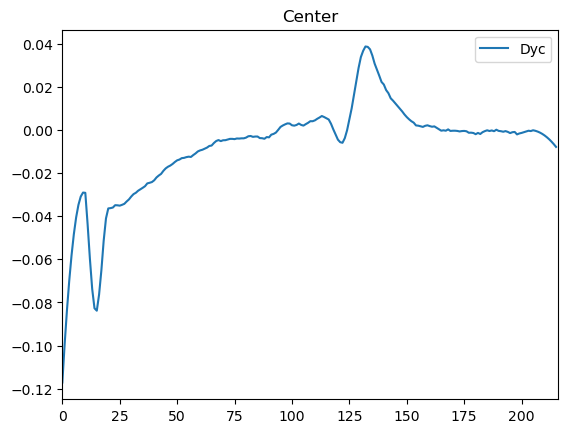

Pos 3
2023_11_15_Ti_pLPT20&pLPT41


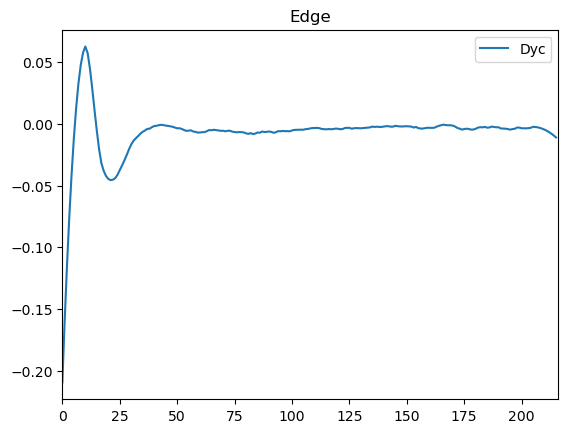

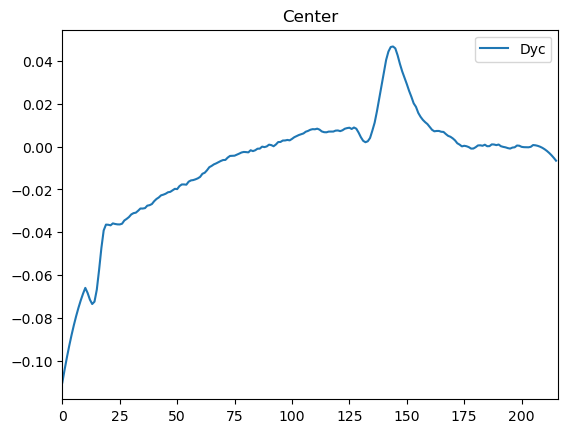

Pos 6
2023_11_15_Ti_pLPT20&pLPT41


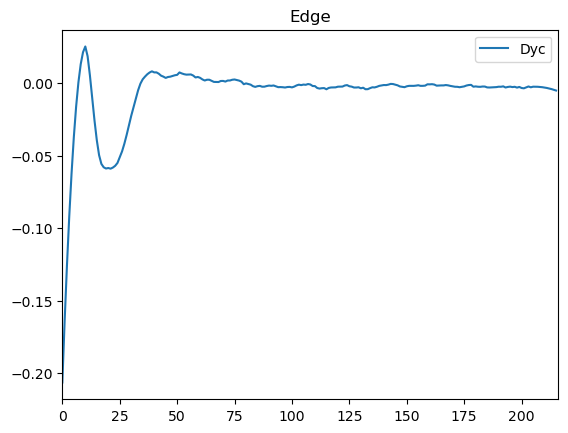

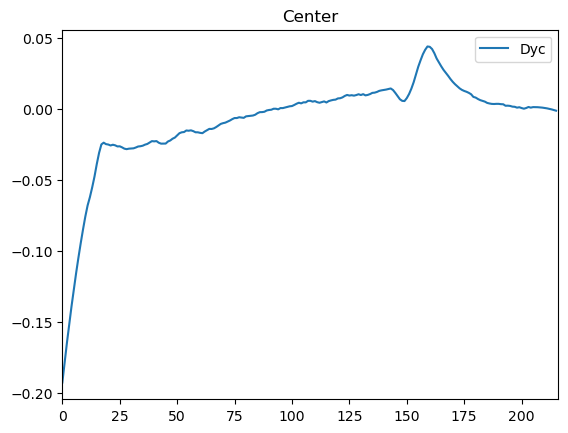

Pos 7
2023_11_15_Ti_pLPT20&pLPT41


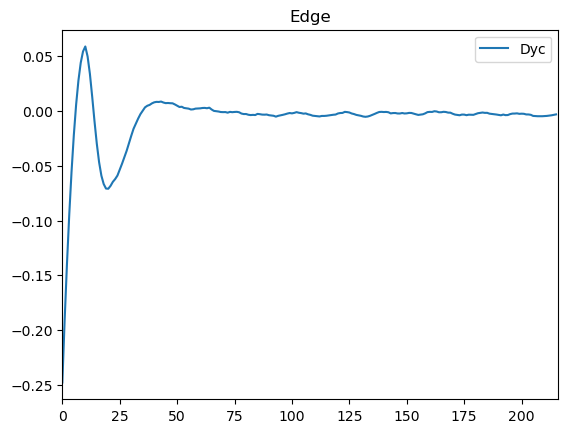

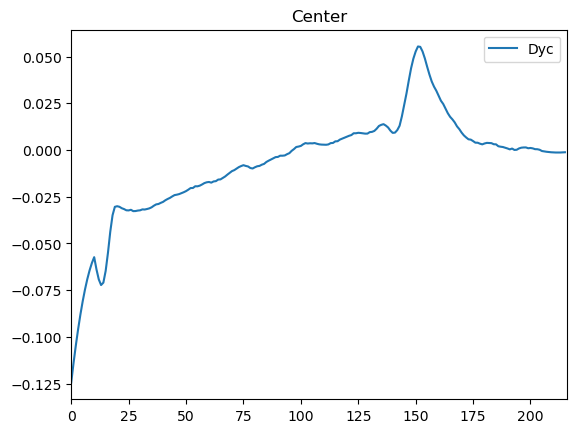

Pos 9
2023_11_15_Ti_pLPT20&pLPT41


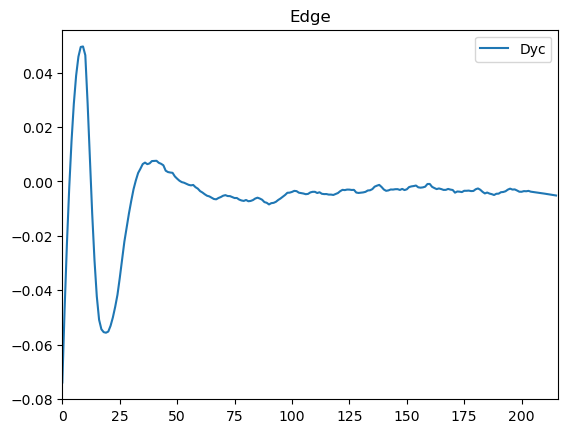

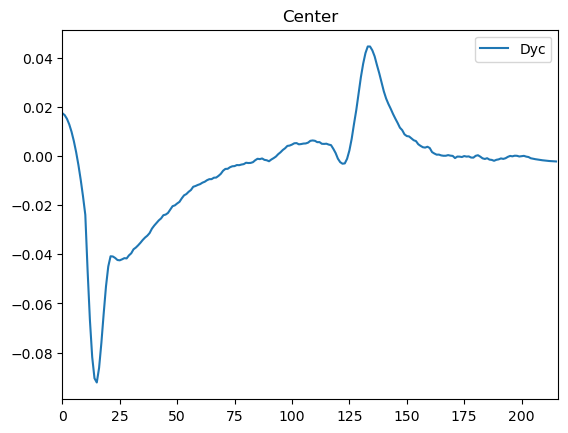

Pos 17
2023_11_15_Ti_pLPT20&pLPT41


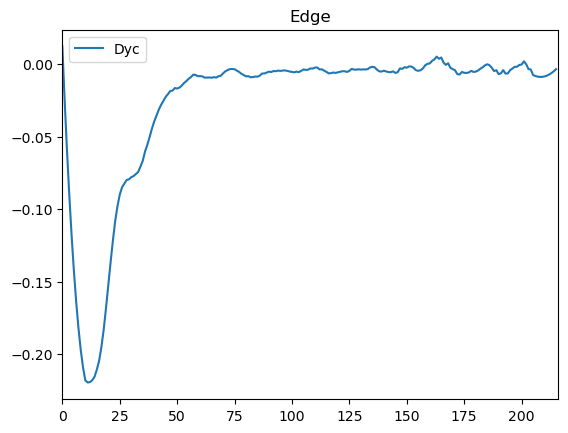

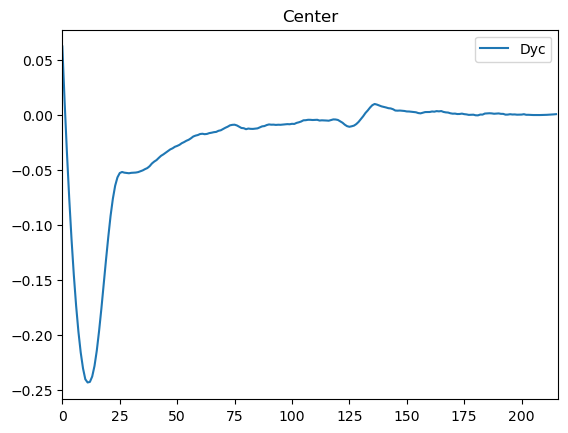

Pos 19
2023_11_15_Ti_pLPT20&pLPT41


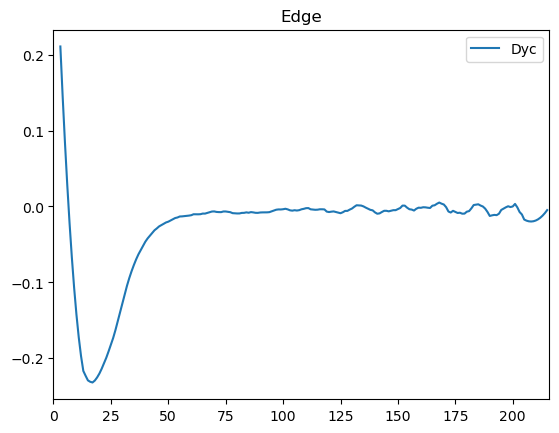

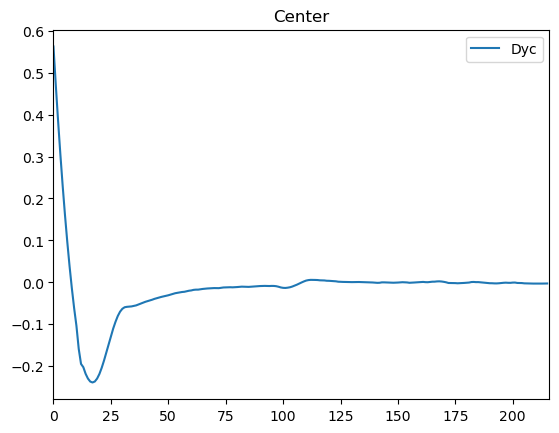

Pos 20
2023_11_15_Ti_pLPT20&pLPT41


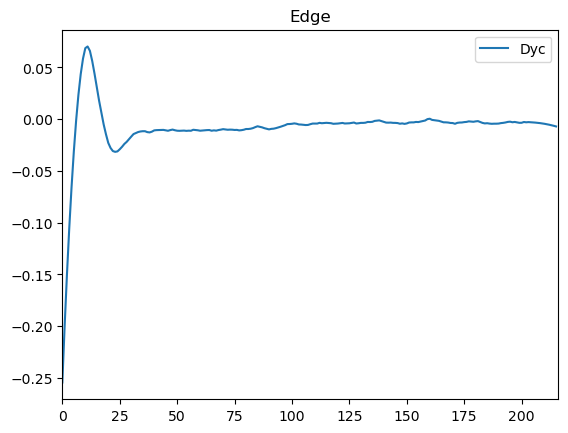

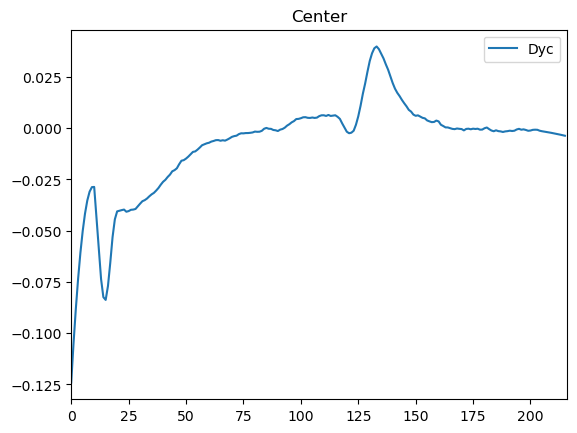

Pos 0
2023_11_15_TiTweez_pLPT20&pLPT41


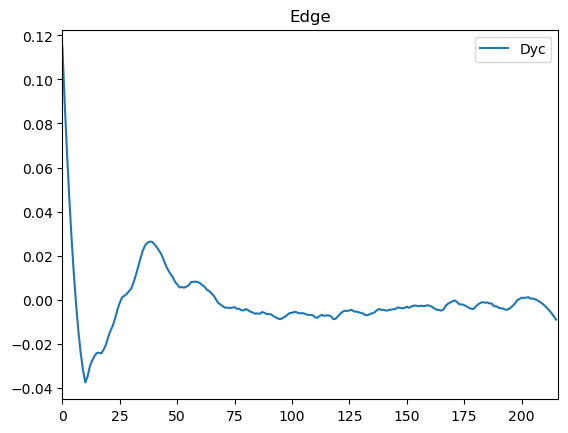

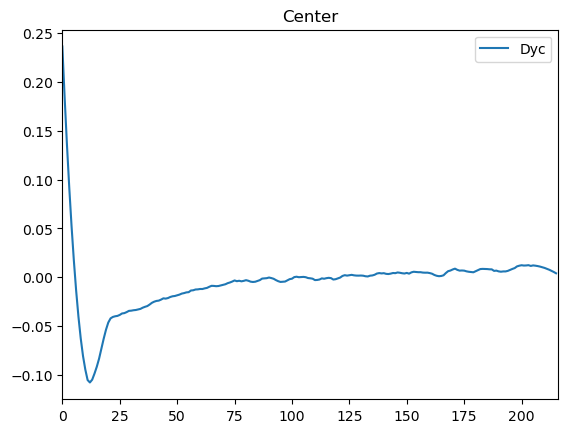

Pos 1
2023_11_15_TiTweez_pLPT20&pLPT41


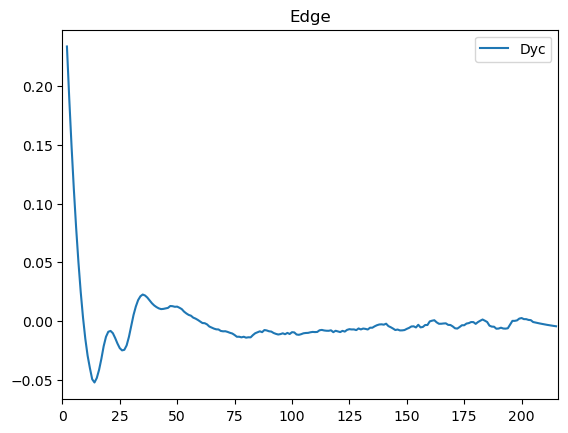

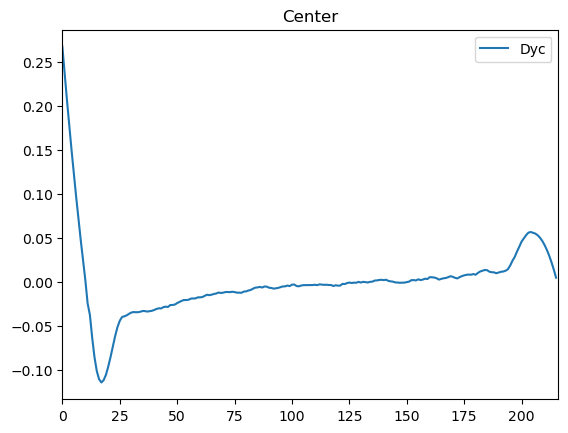

Pos 3
2023_11_15_TiTweez_pLPT20&pLPT41


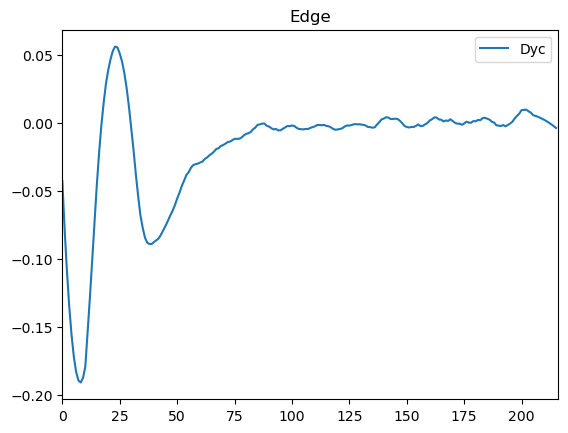

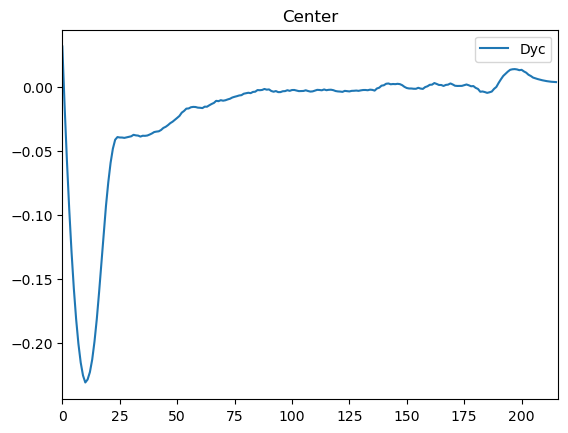

Pos 0
2023_11_17_Ti_pLPT119&pLPT41


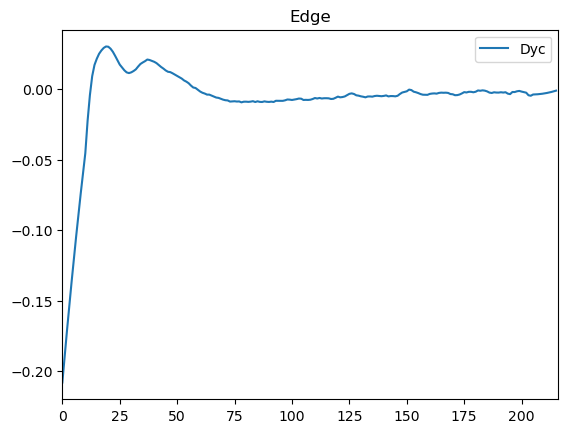

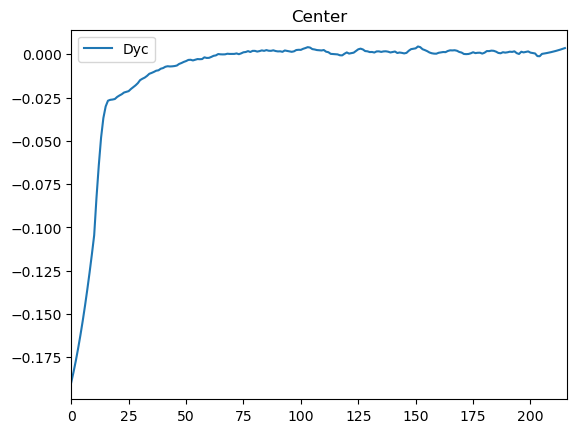

Pos 1
2023_11_17_Ti_pLPT119&pLPT41


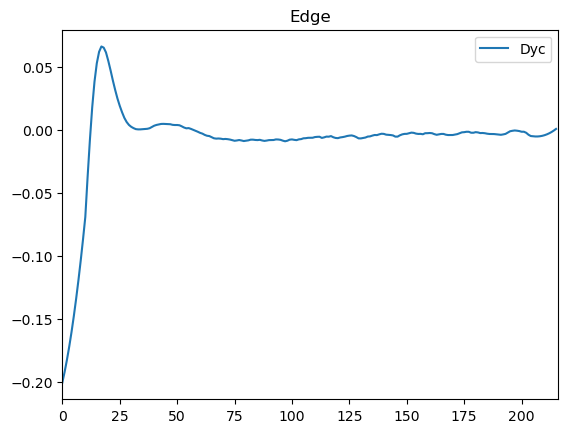

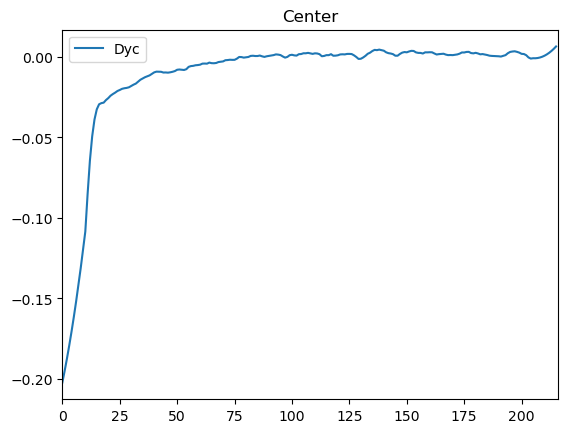

Pos 2
2023_11_17_Ti_pLPT119&pLPT41


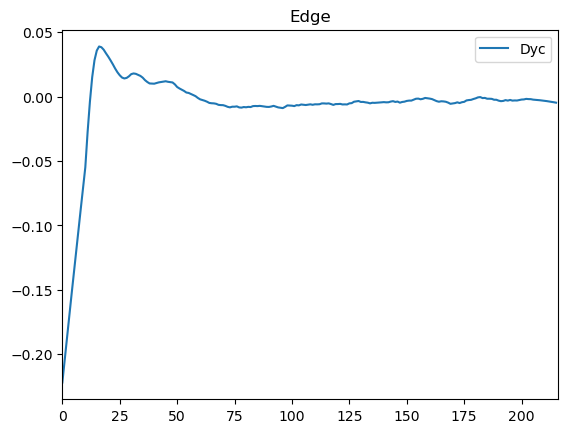

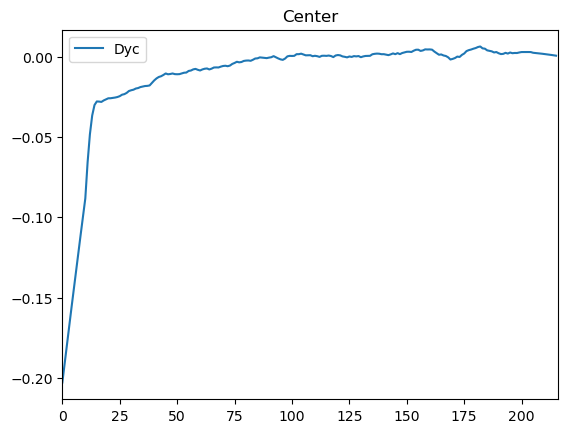

Pos 3
2023_11_17_Ti_pLPT119&pLPT41


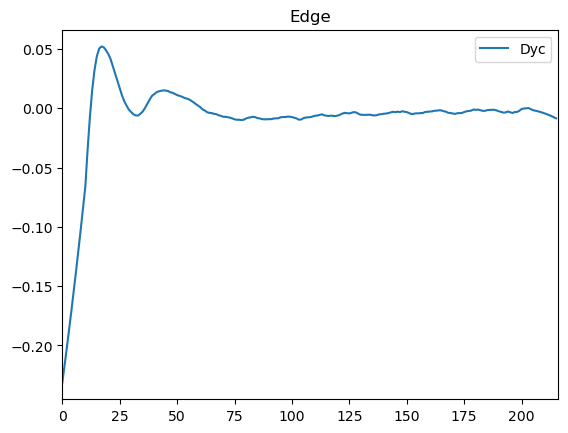

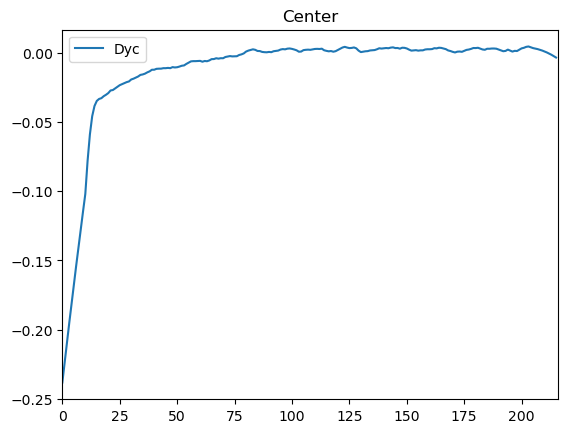

Pos 4
2023_11_17_Ti_pLPT119&pLPT41


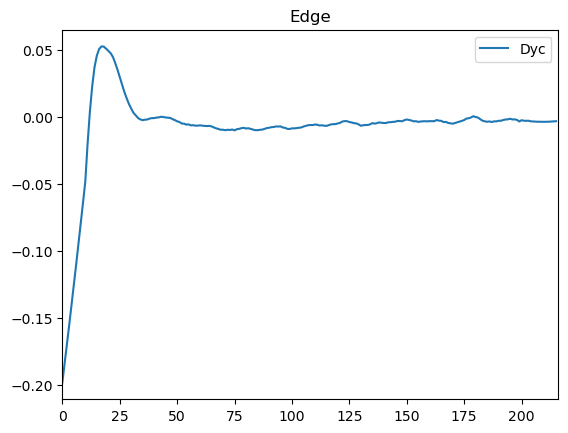

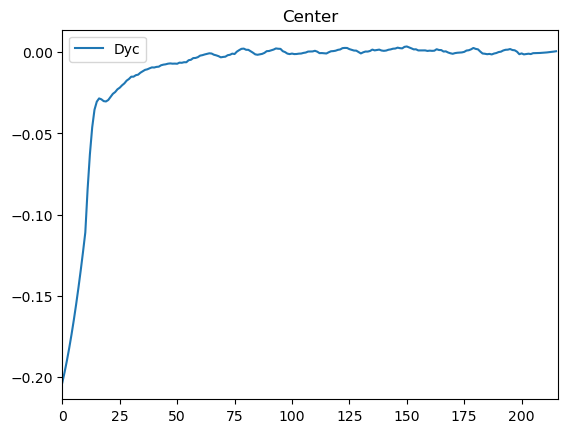

Pos 5
2023_11_17_Ti_pLPT119&pLPT41


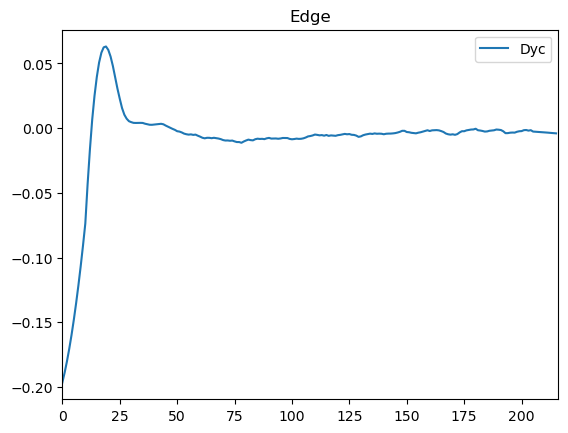

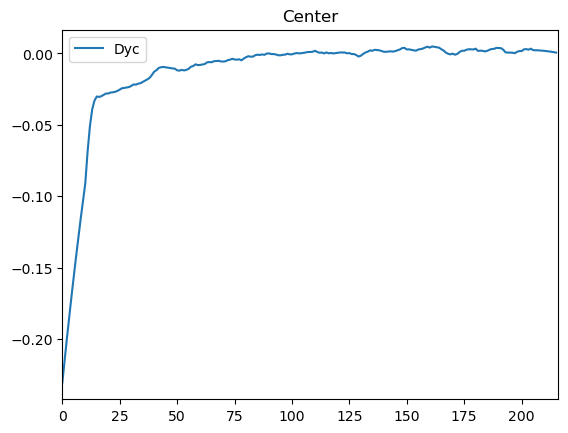

Pos 2
2023_11_17_TiTweez_pLPT119&pLPT41


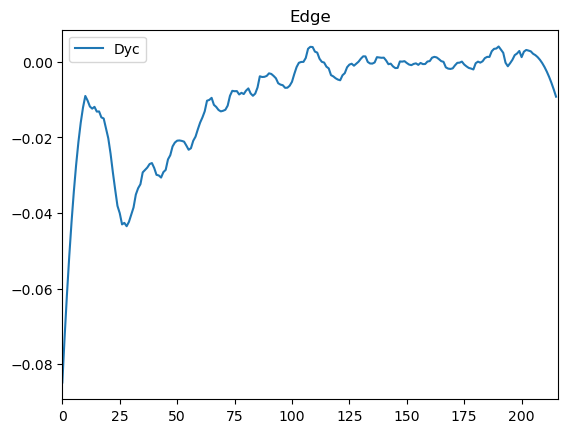

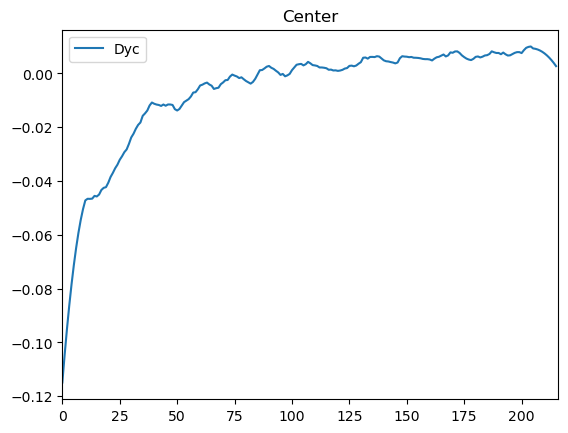

Pos 3
2023_11_17_TiTweez_pLPT119&pLPT41


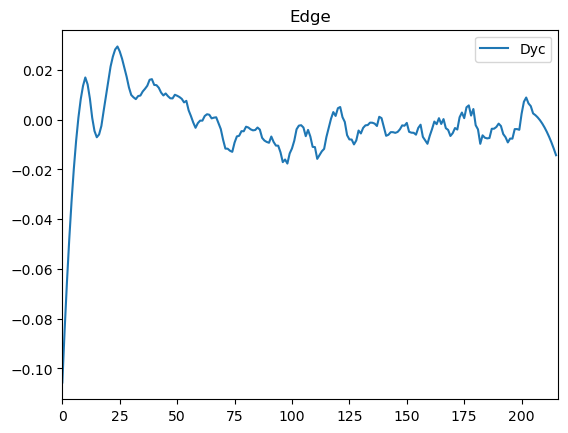

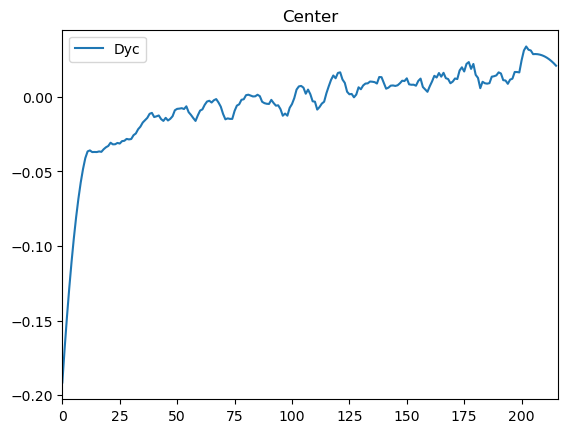

Pos 2
2023_11_28_Ti_pAAA


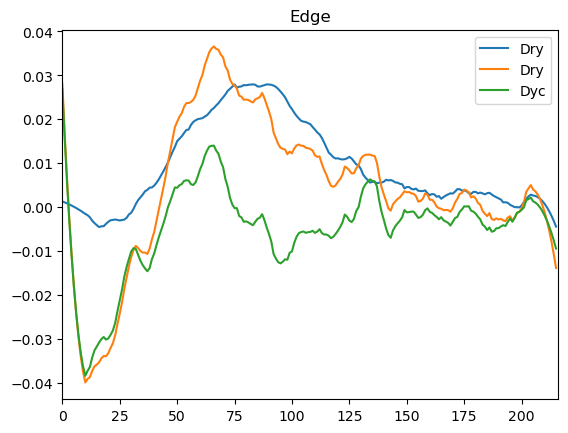

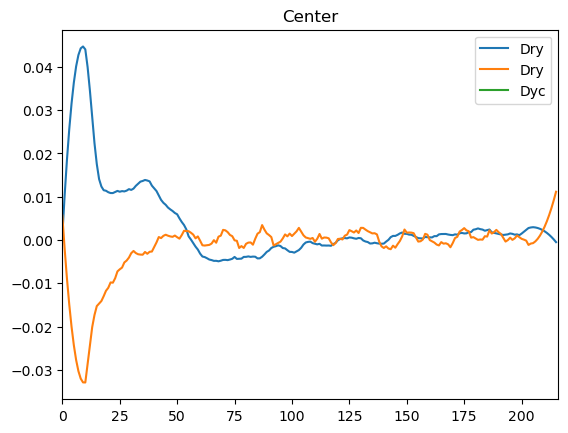

Pos 5
2023_11_28_Ti_pAAA


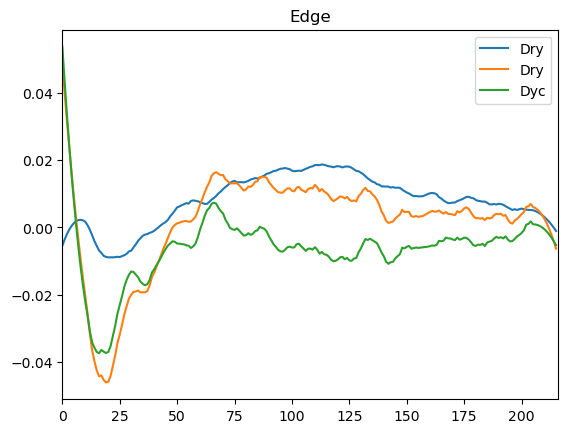

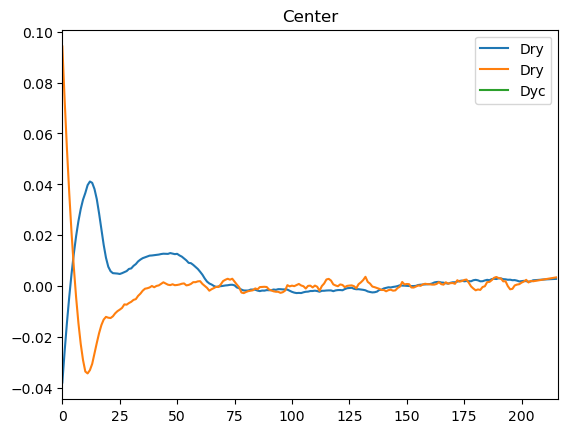

Pos 6
2023_11_28_Ti_pAAA


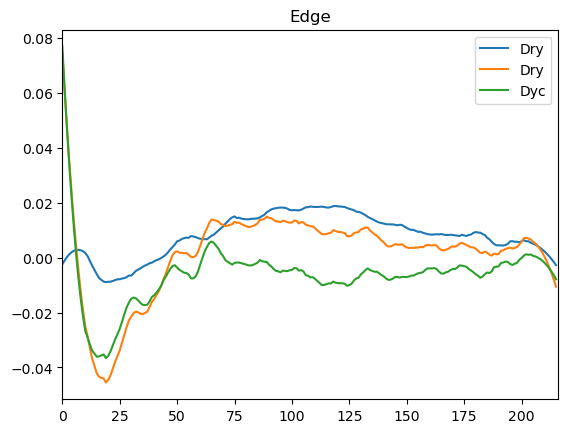

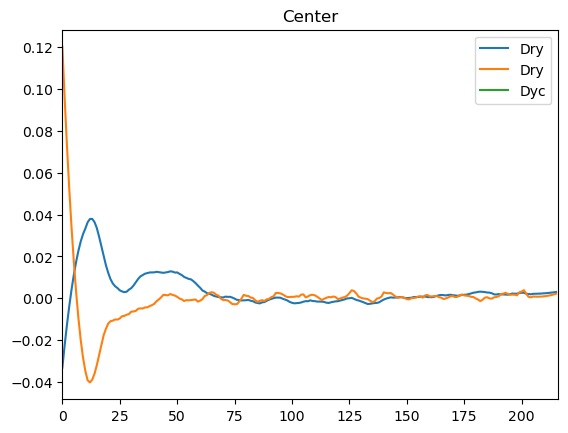

Pos 0
2023_11_28_TiTweez_pAAA


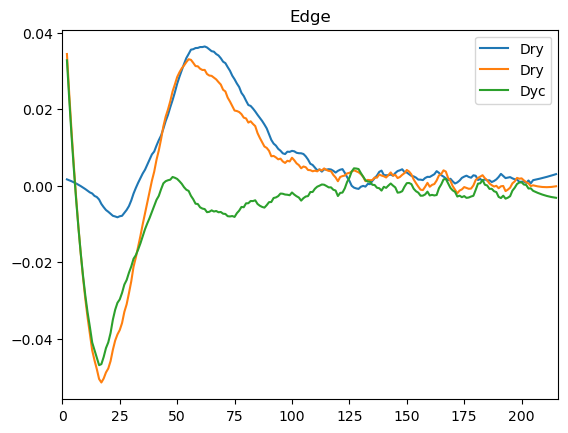

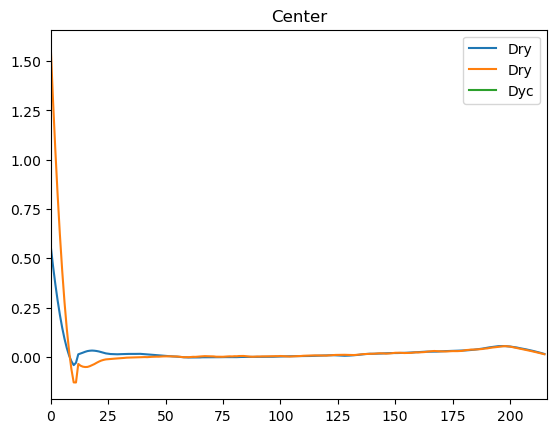

Pos 1
2023_11_28_TiTweez_pAAA


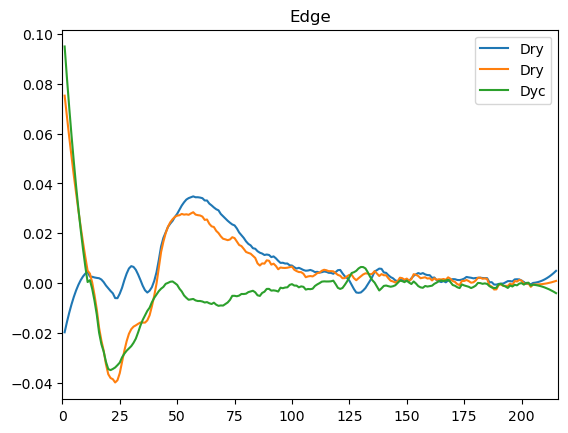

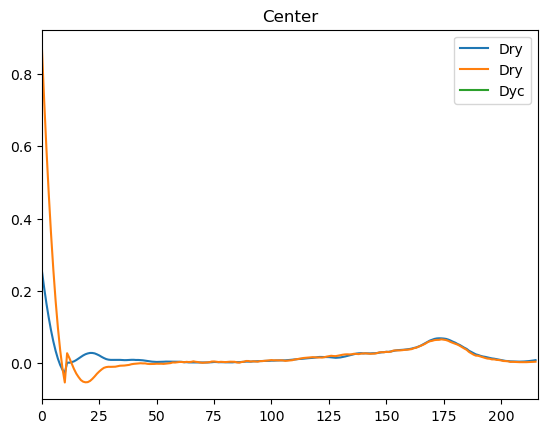

Pos 3
2023_11_28_TiTweez_pAAA


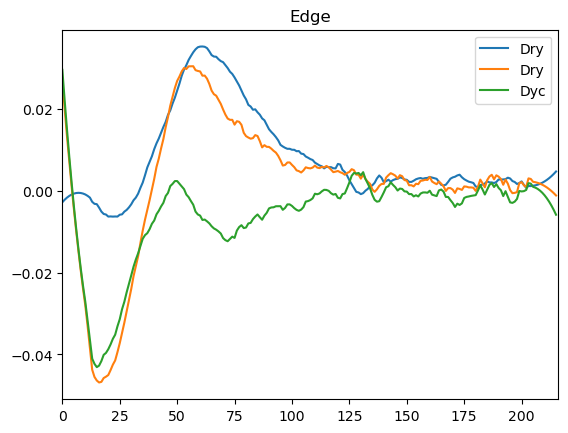

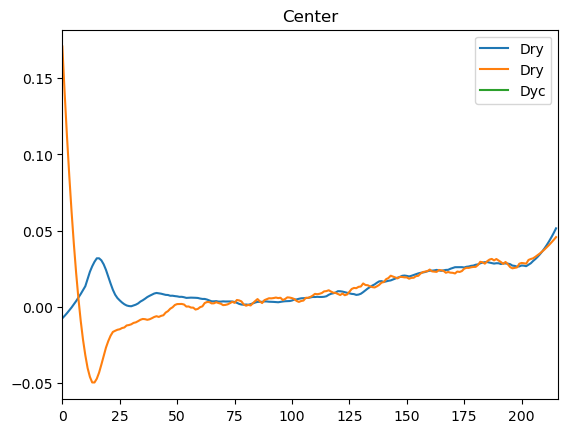

Pos 4
2023_11_28_TiTweez_pAAA


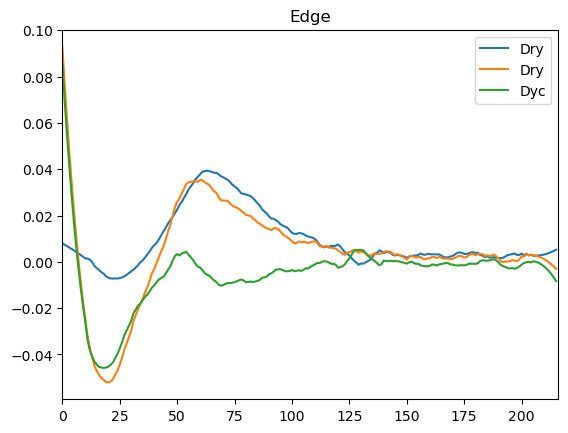

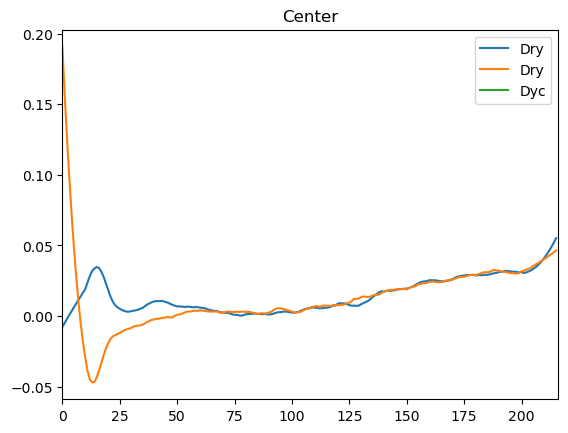

Pos 5
2023_11_28_TiTweez_pAAA


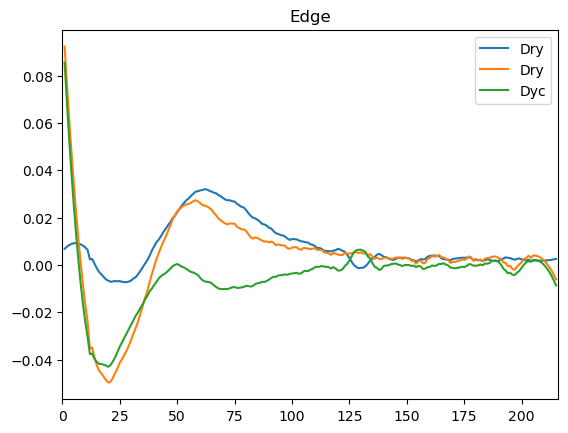

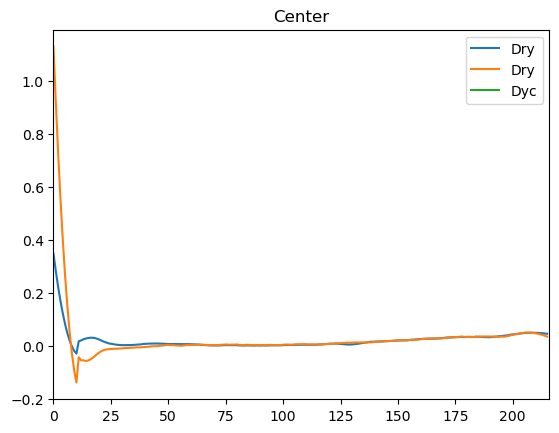

Pos 6
2023_11_28_TiTweez_pAAA


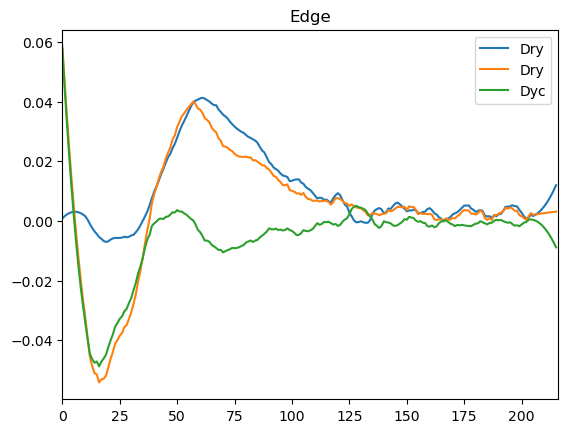

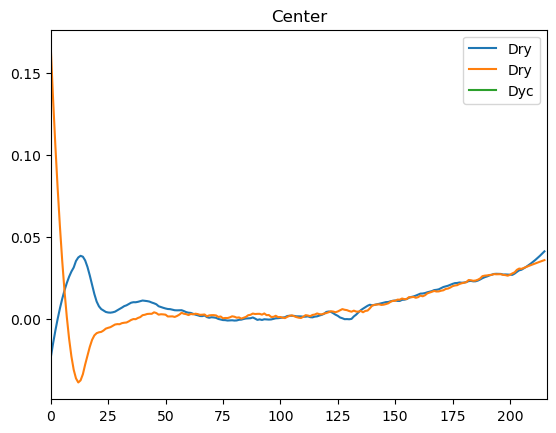

Pos 7
2023_11_28_TiTweez_pAAA


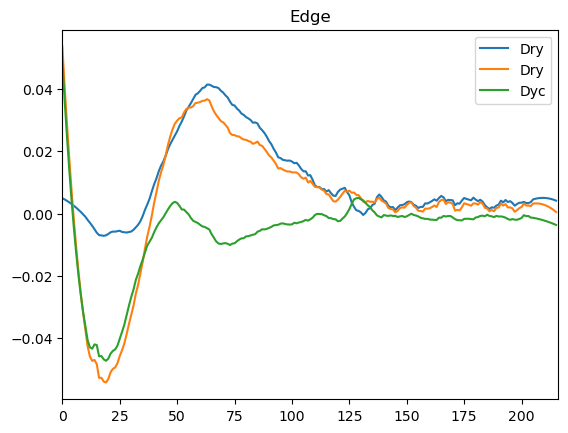

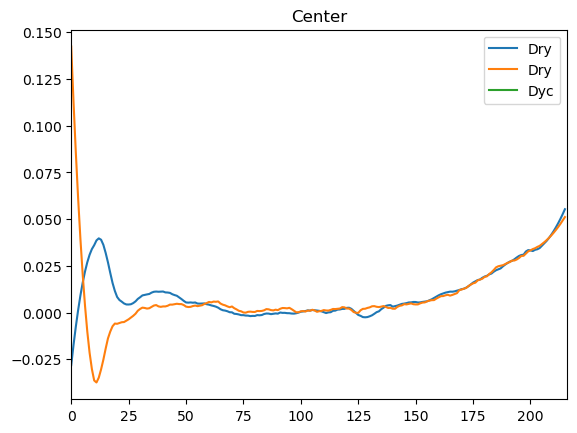

Pos 8
2023_11_28_TiTweez_pAAA


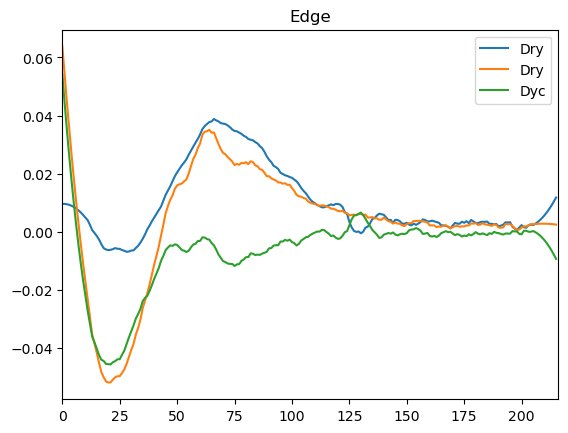

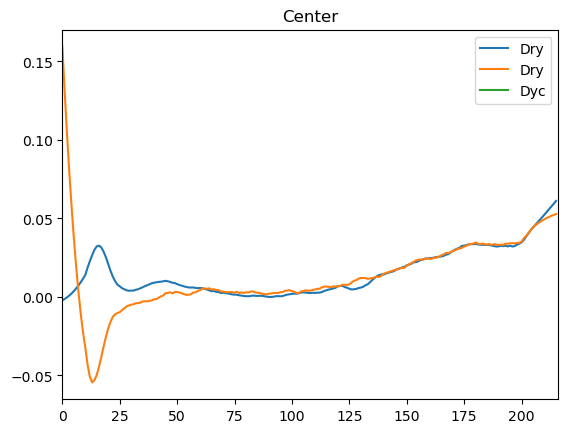

Pos 9
2023_11_28_TiTweez_pAAA


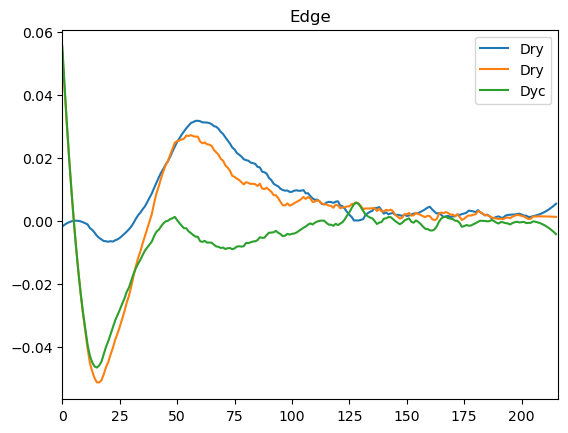

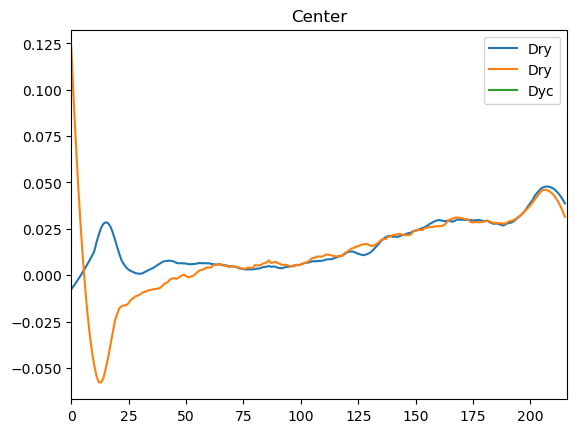

Pos 10
2023_11_28_TiTweez_pAAA


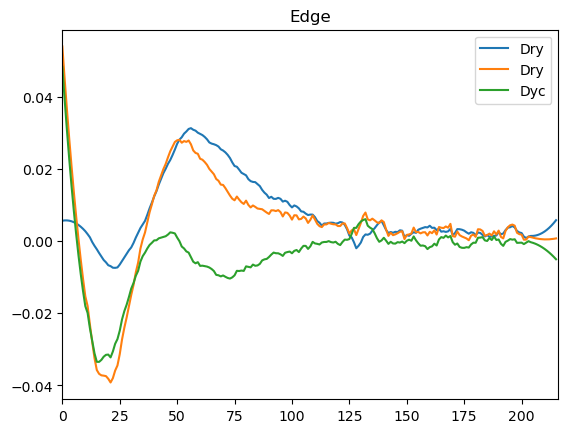

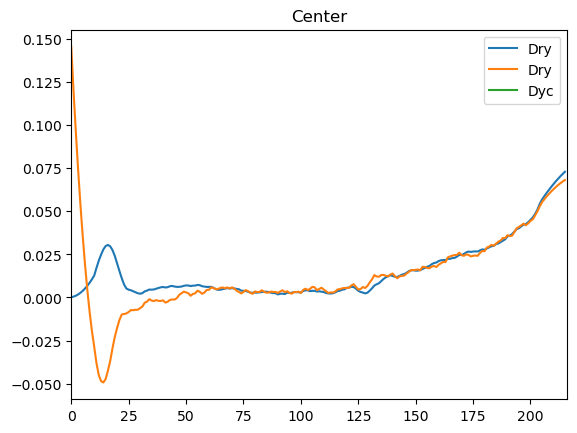

Pos 11
2023_11_28_TiTweez_pAAA


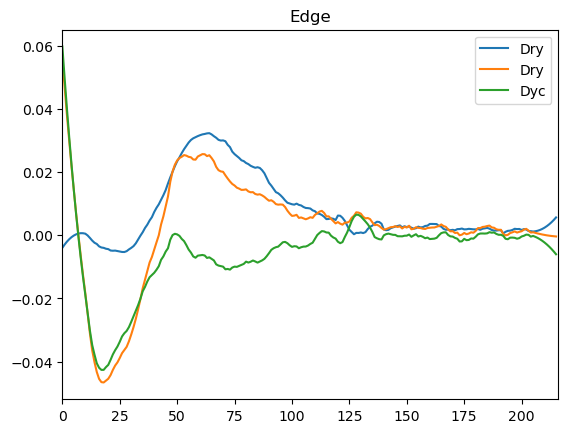

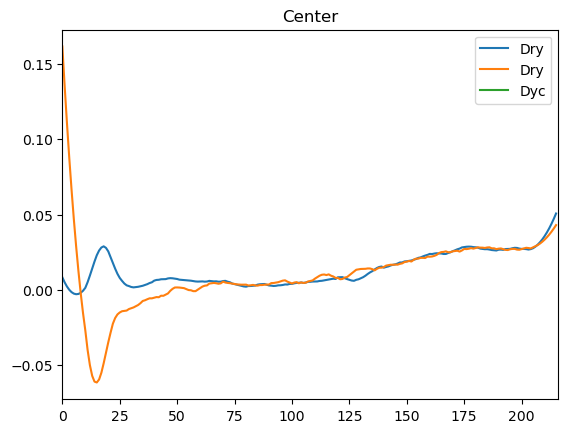

Pos 0
2023_11_30_Ti_pAAA


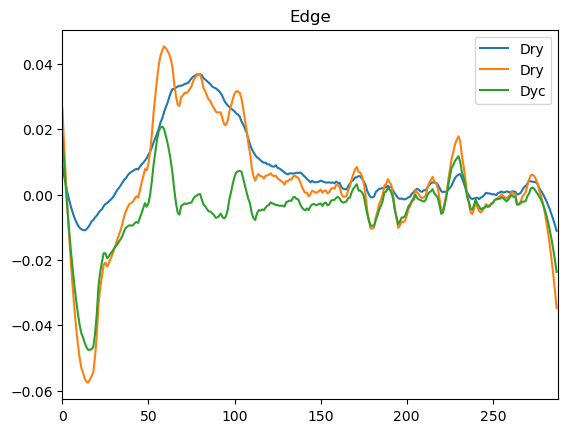

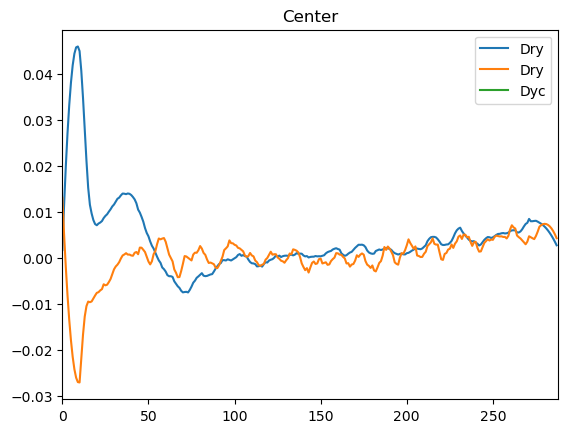

Pos 1
2023_11_30_Ti_pAAA


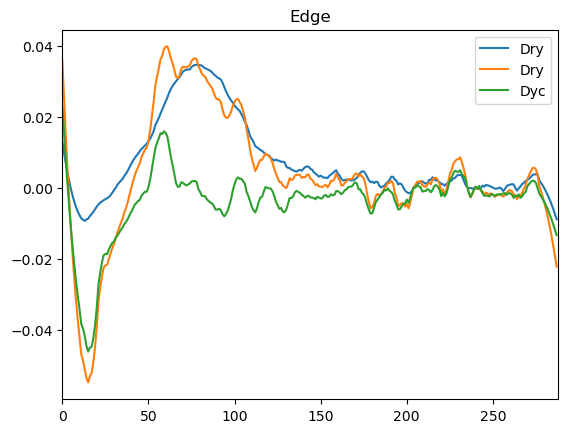

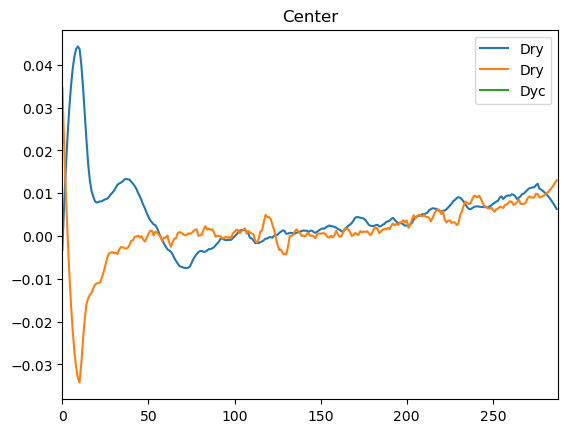

Pos 7
2023_11_30_Ti_pAAA


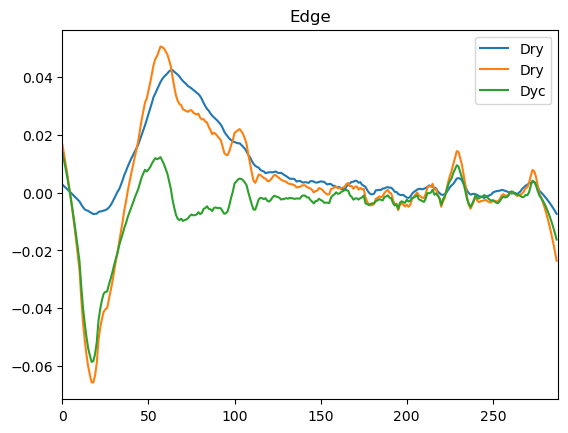

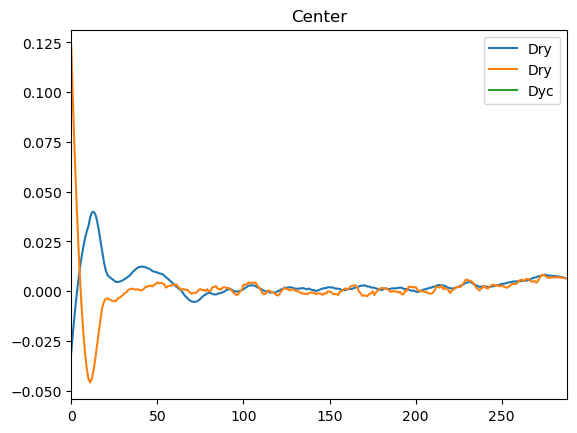

Pos 9
2023_11_30_Ti_pAAA


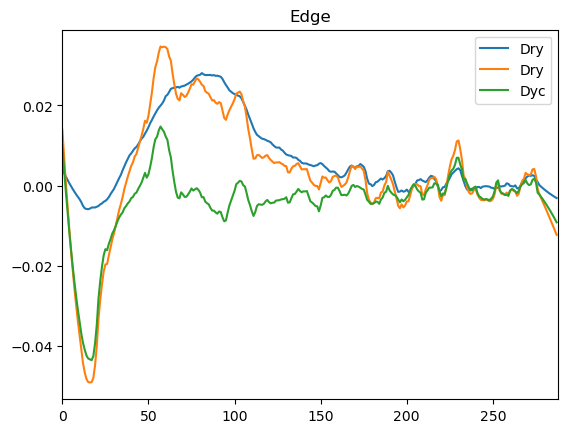

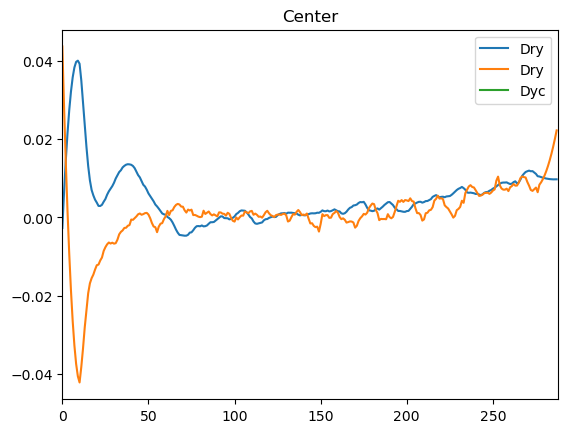

Pos 11
2023_11_30_Ti_pAAA


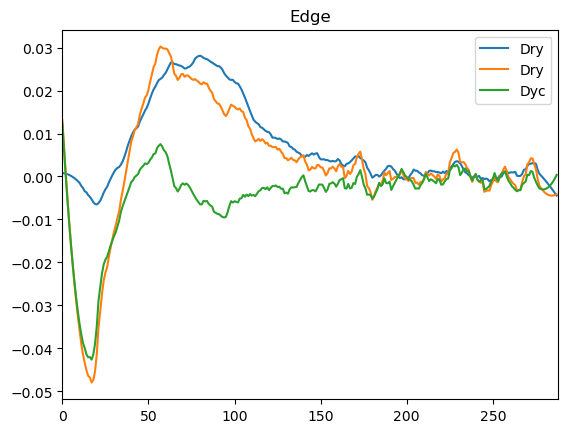

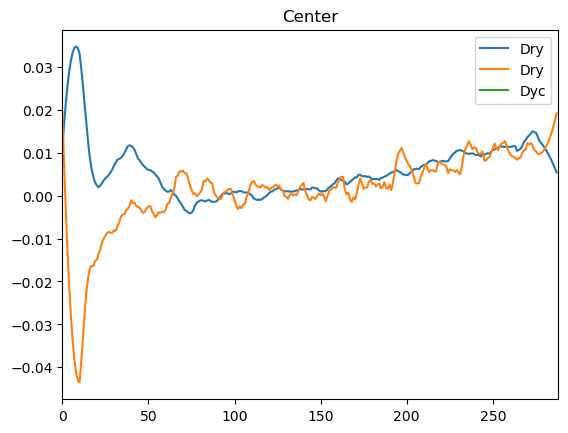

Pos 12
2023_11_30_Ti_pAAA


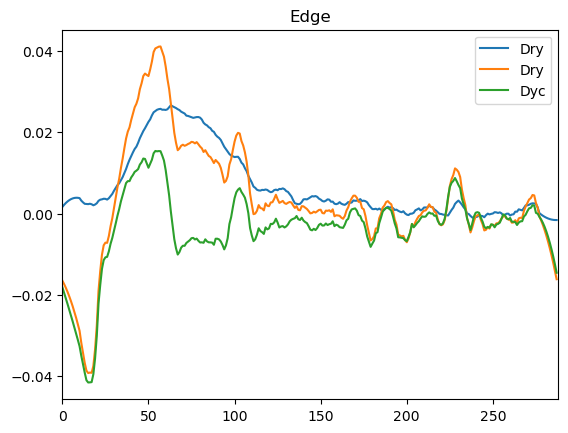

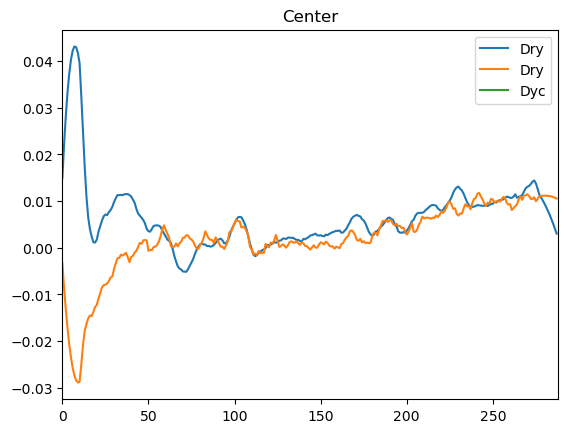

Pos 13
2023_11_30_Ti_pAAA


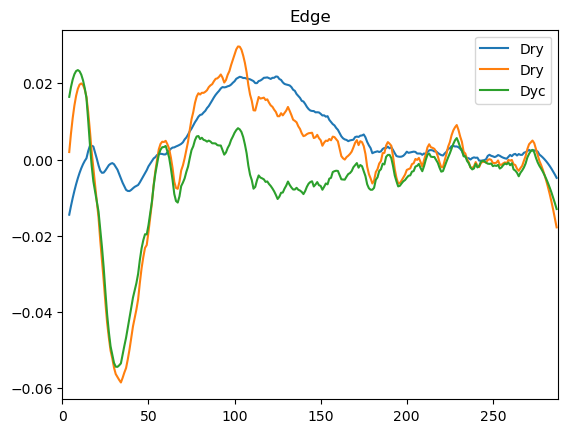

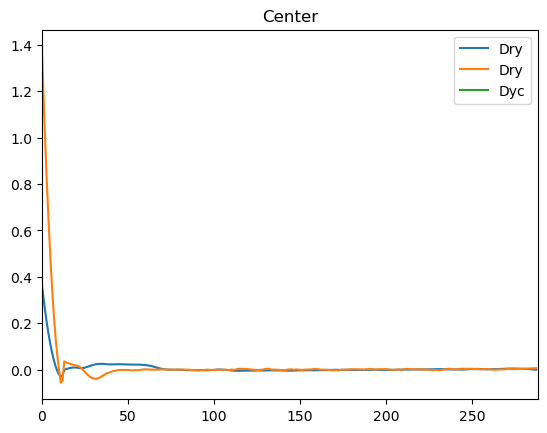

Pos 14
2023_11_30_TiTweez_pAAA


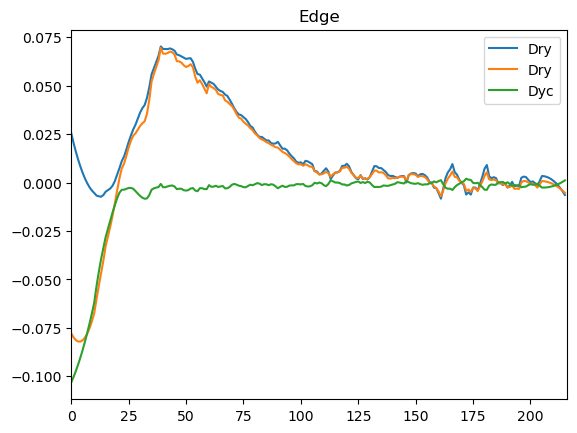

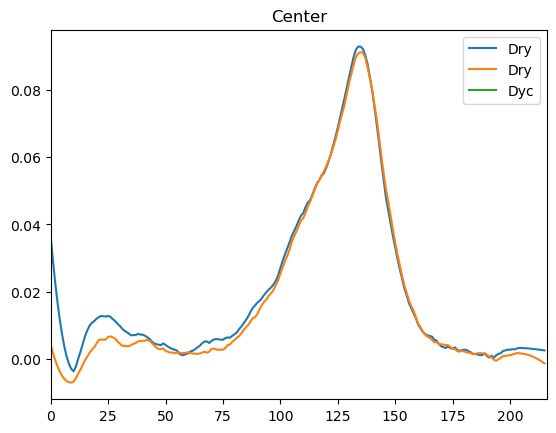

Pos 15
2023_11_30_TiTweez_pAAA


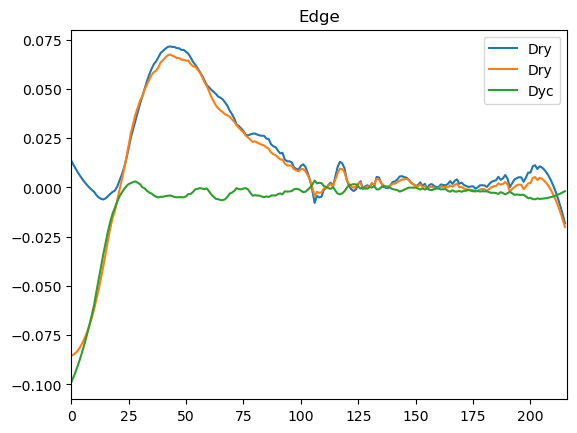

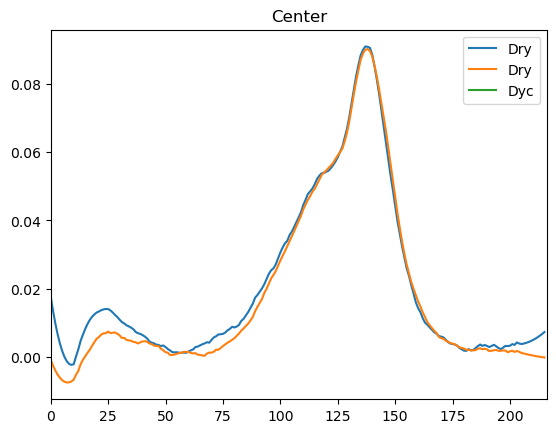

Pos 16
2023_11_30_TiTweez_pAAA


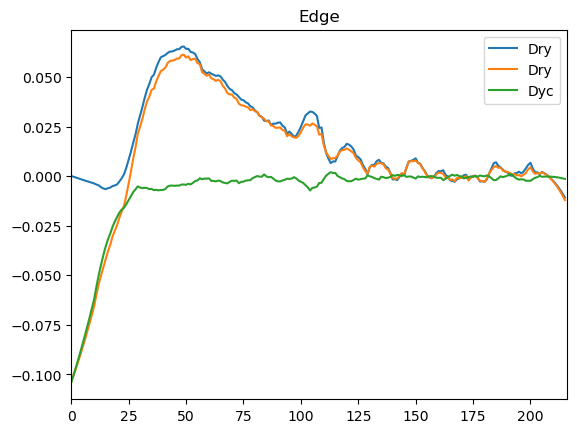

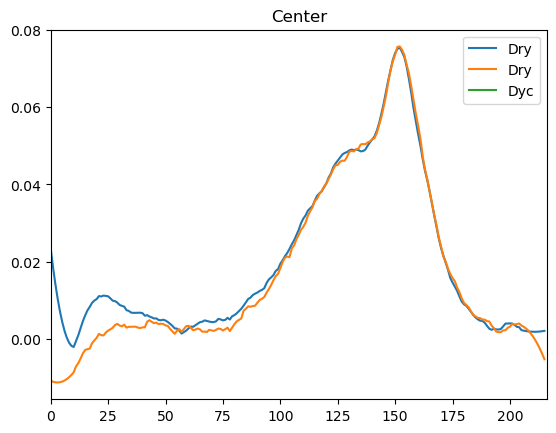

Pos 17
2023_11_30_TiTweez_pAAA


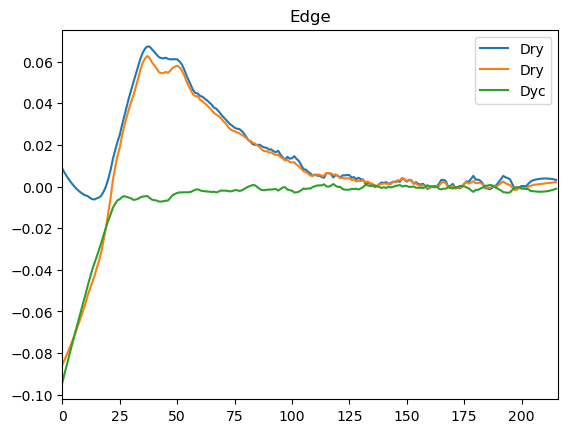

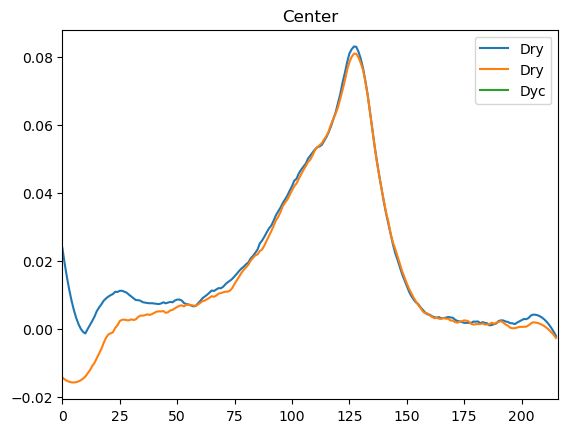

Pos 18
2023_11_30_TiTweez_pAAA


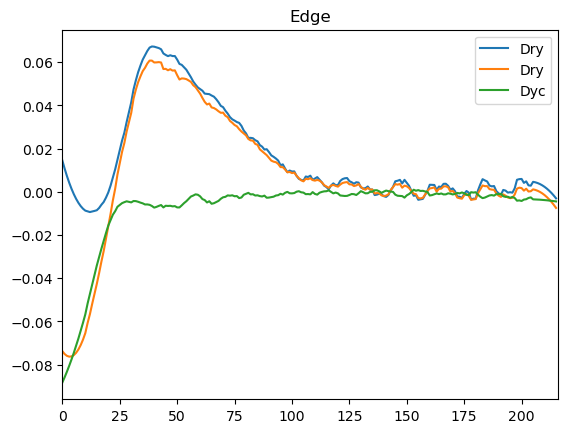

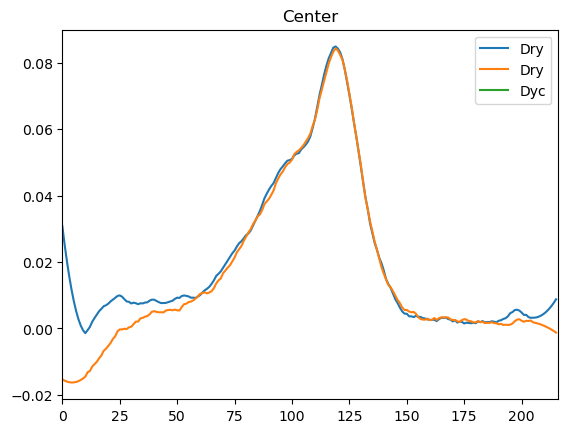

Pos 20
2023_11_30_TiTweez_pAAA


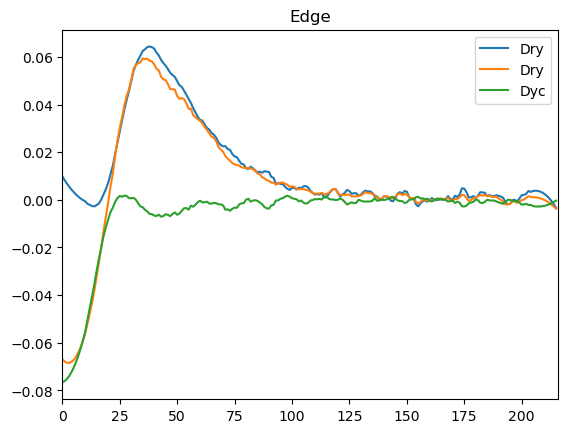

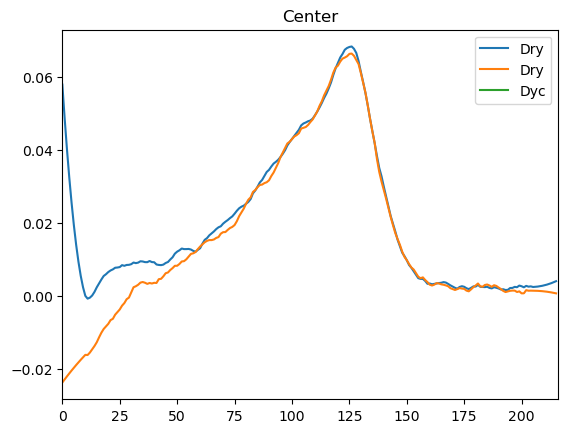

Pos 21
2023_11_30_TiTweez_pAAA


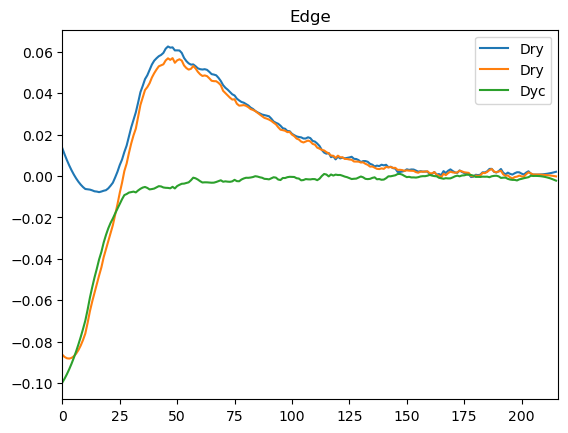

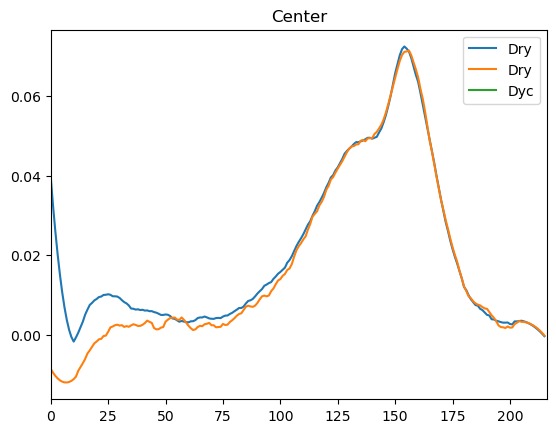

Pos 22
2023_11_30_TiTweez_pAAA


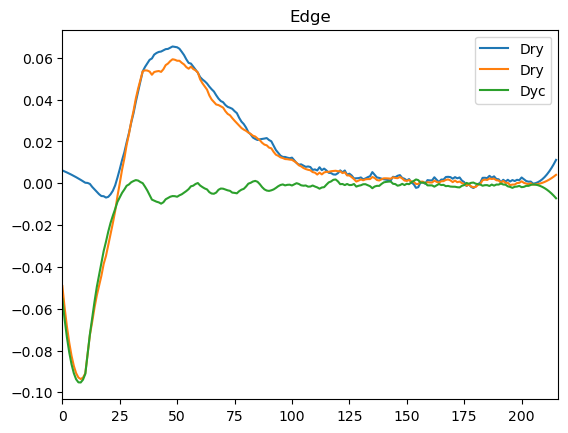

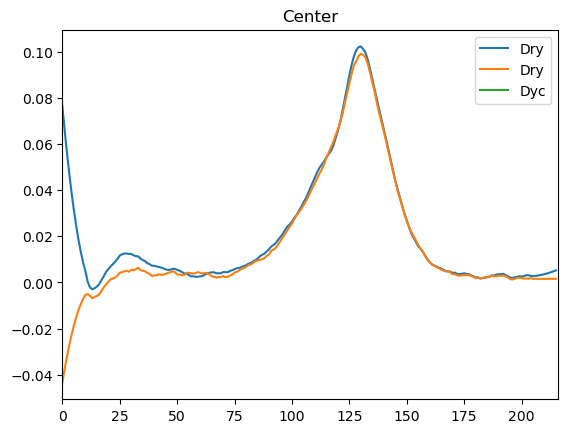

Pos 23
2023_11_30_TiTweez_pAAA


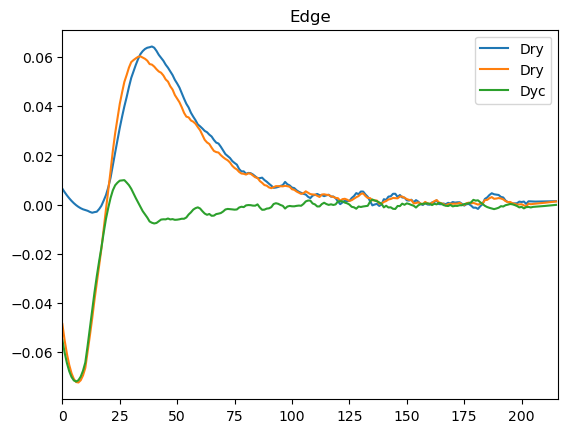

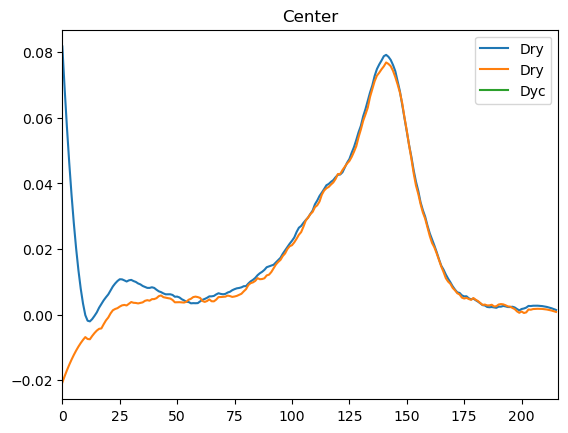

Pos 28
2023_11_30_TiTweez_pAAA


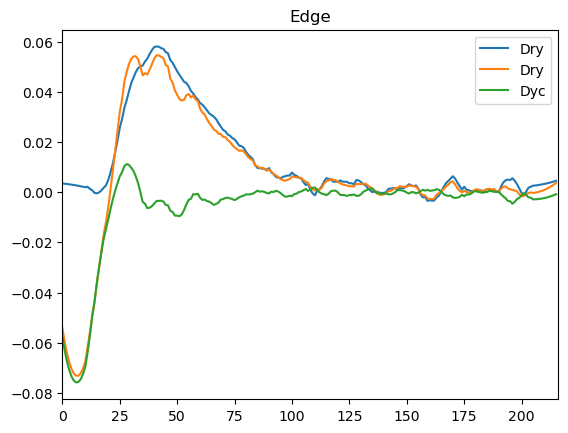

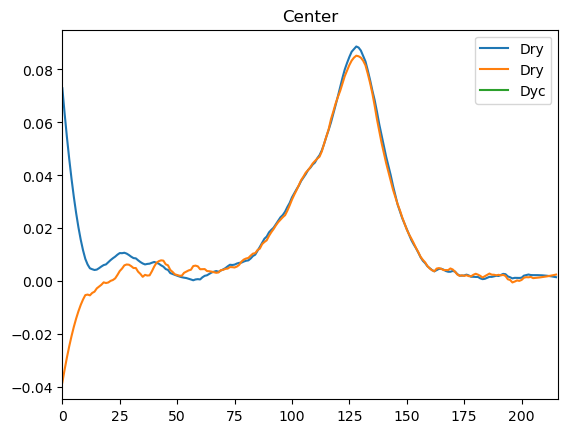

Pos 33
2023_11_30_TiTweez_pAAA


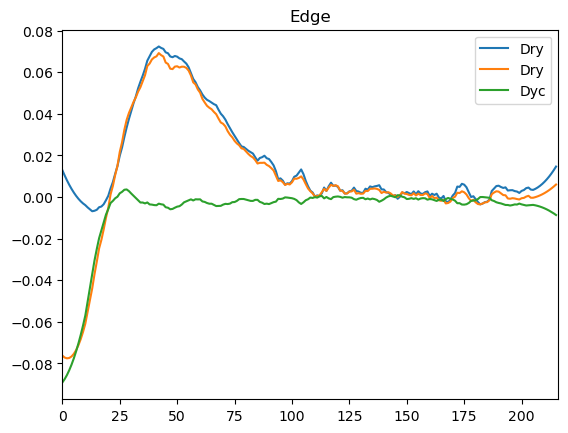

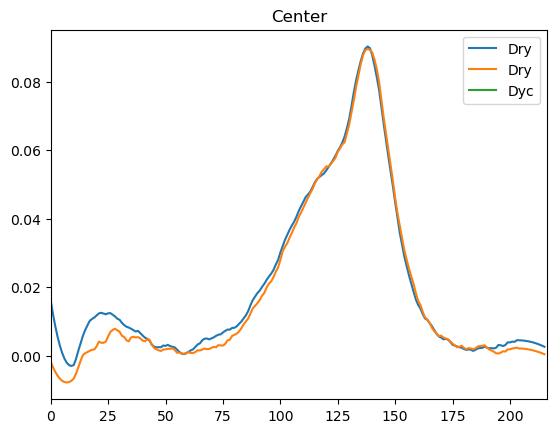

Pos 34
2023_11_30_TiTweez_pAAA


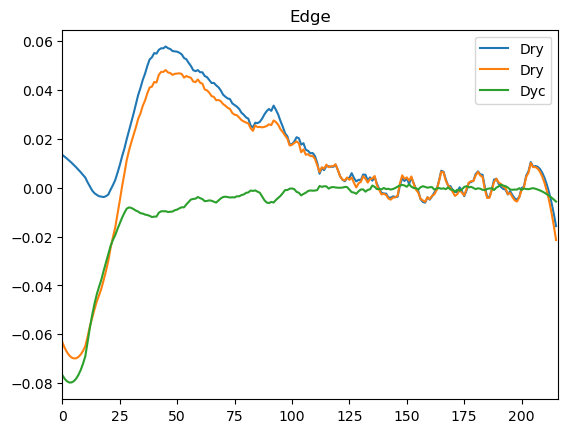

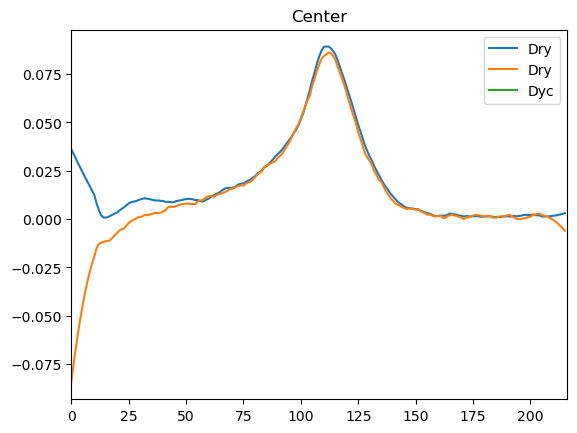

Pos 35
2023_11_30_TiTweez_pAAA


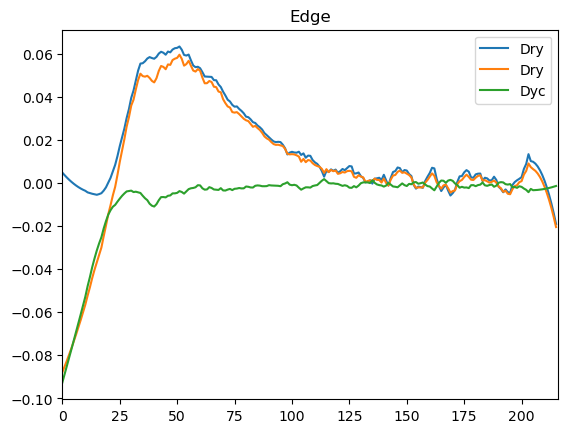

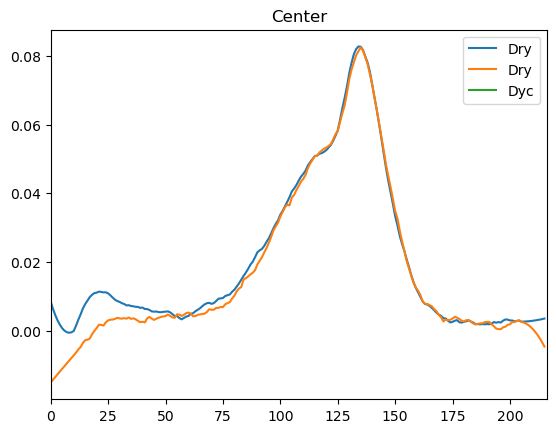

Pos 36
2023_11_30_TiTweez_pAAA


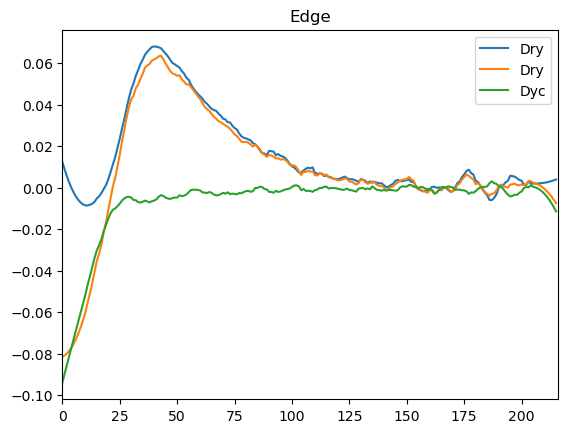

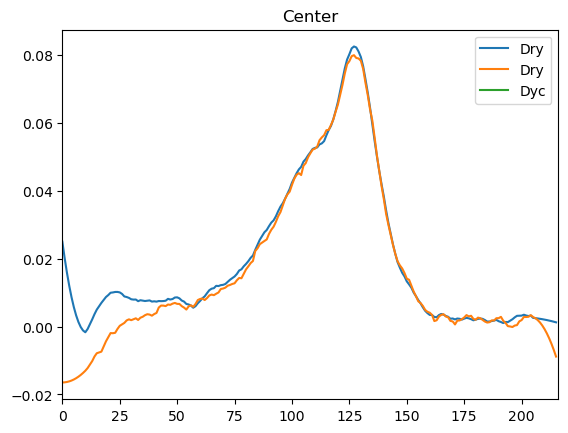

Pos 37
2023_11_30_TiTweez_pAAA


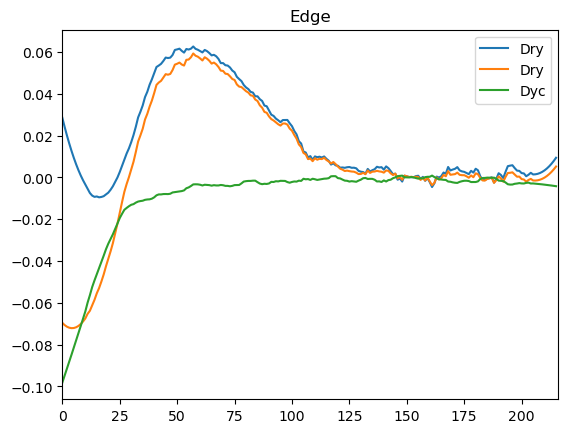

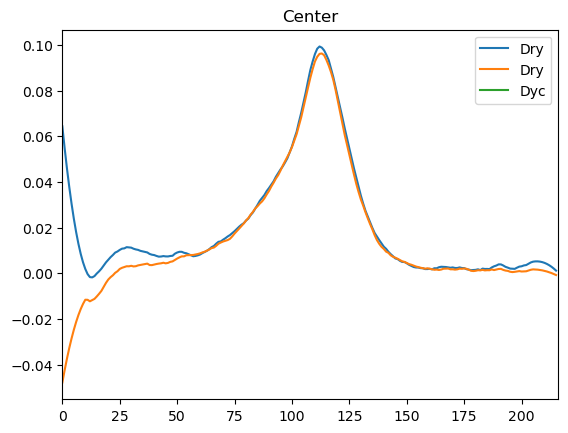

Pos 0
2023_12_04_Ti_pLPT107&pLPT41


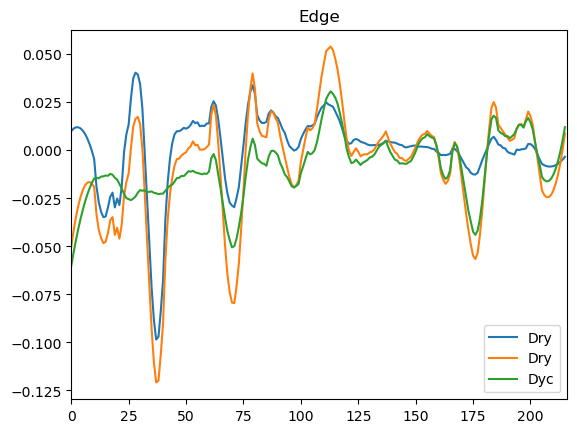

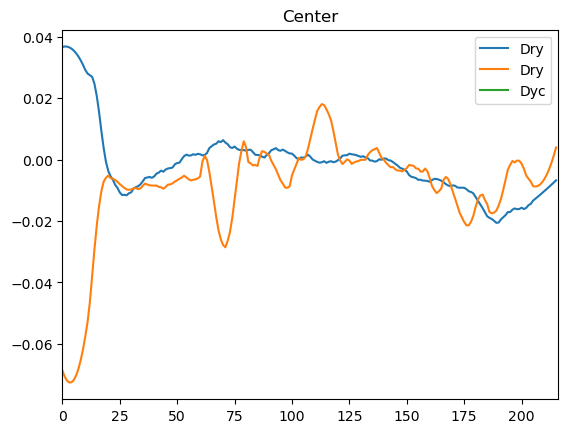

Pos 2
2023_12_04_Ti_pLPT107&pLPT41


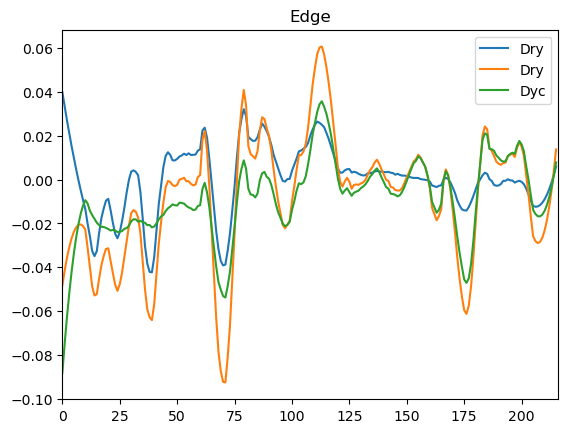

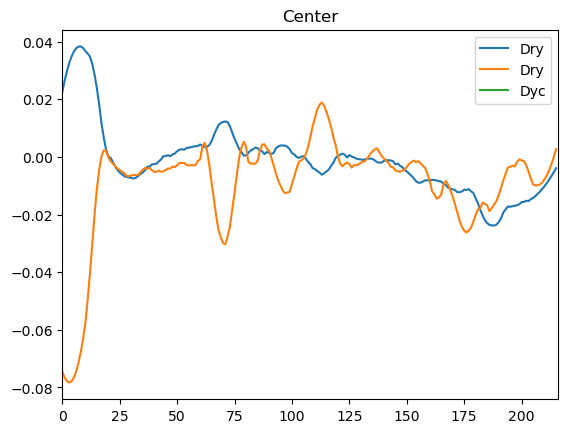

Pos 3
2023_12_04_Ti_pLPT107&pLPT41


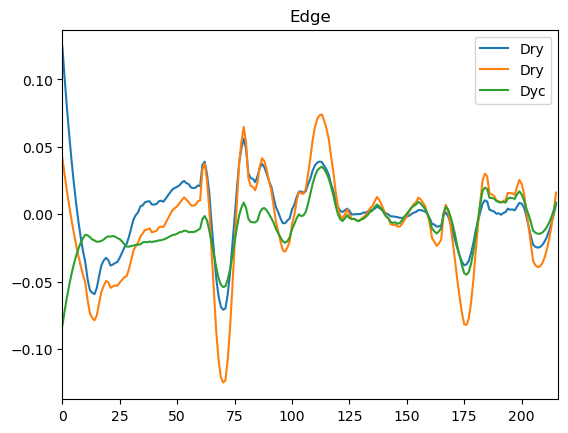

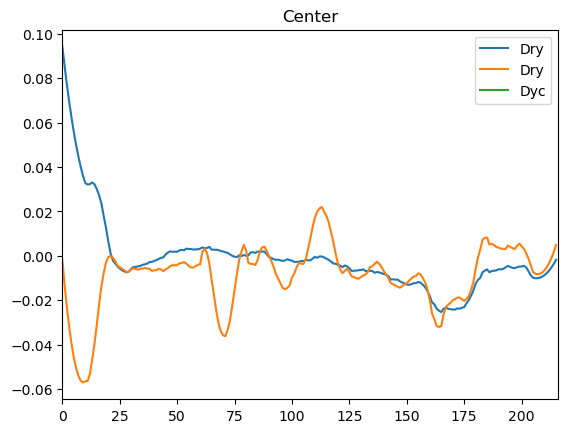

Pos 9
2023_12_04_Ti_pLPT107&pLPT41


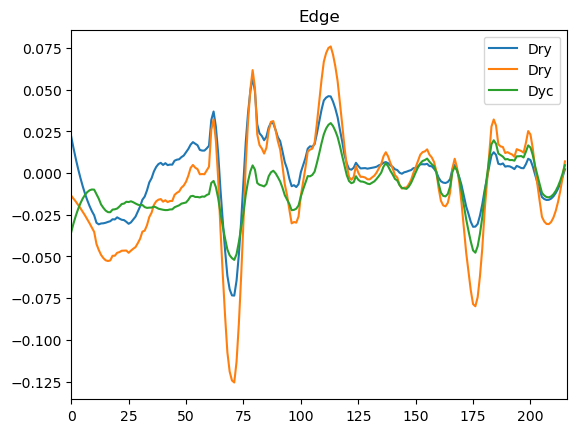

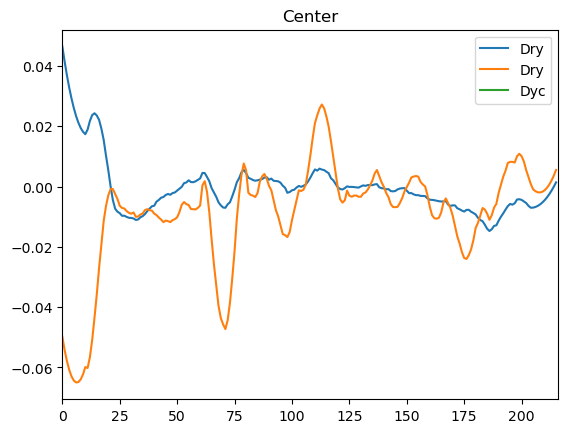

Pos 10
2023_12_04_Ti_pLPT107&pLPT41


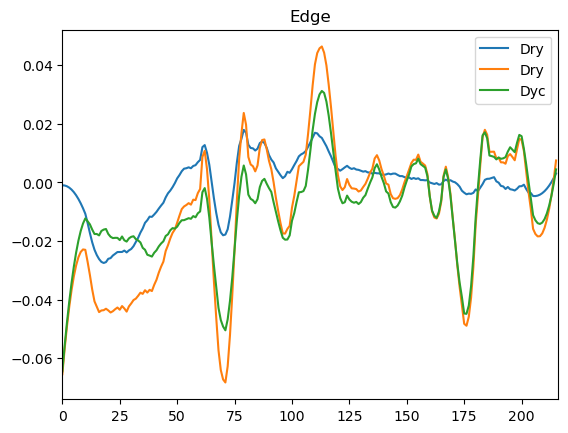

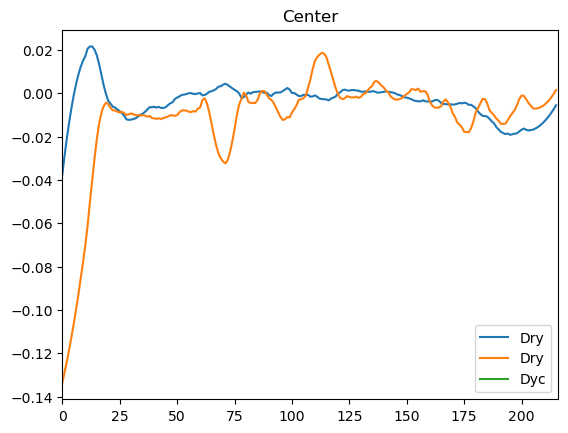

Pos 11
2023_12_04_Ti_pLPT107&pLPT41


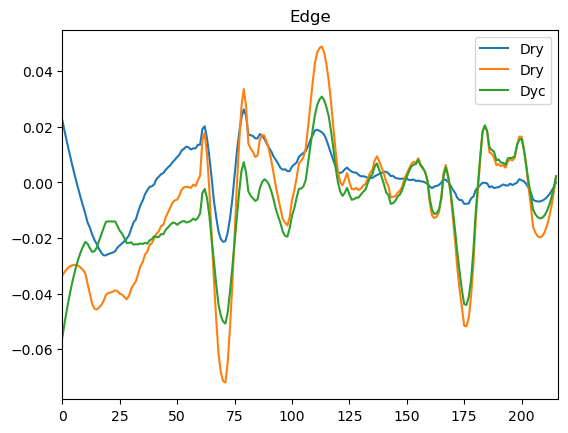

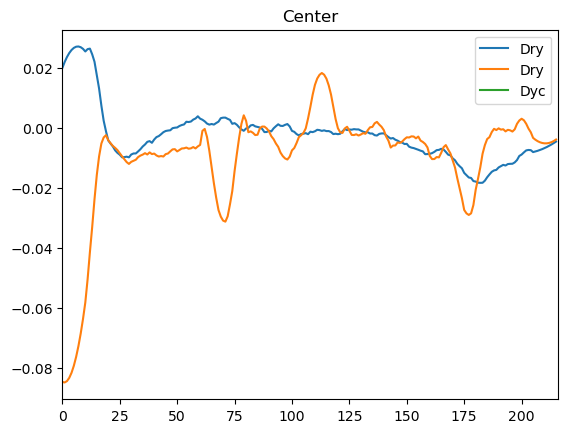

Pos 14
2023_12_04_Ti_pLPT107&pLPT41


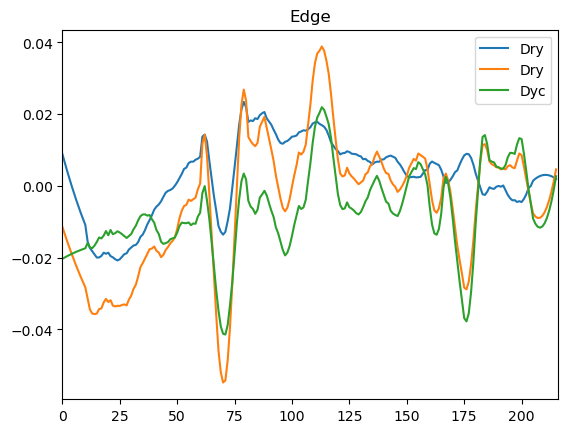

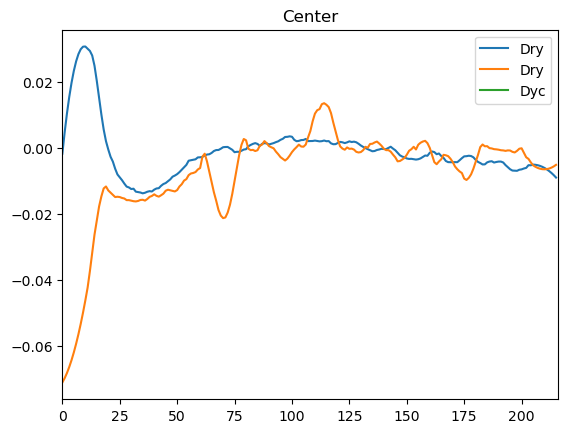

Pos 15
2023_12_04_Ti_pLPT107&pLPT41


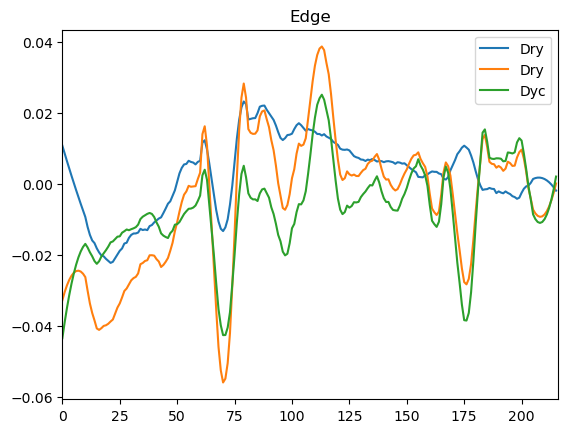

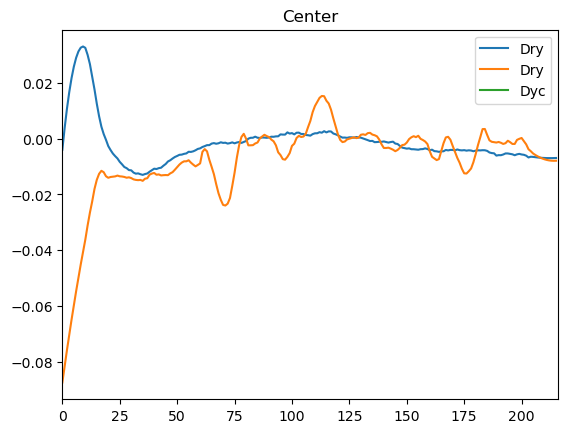

Pos 18
2023_12_04_Ti_pLPT107&pLPT41


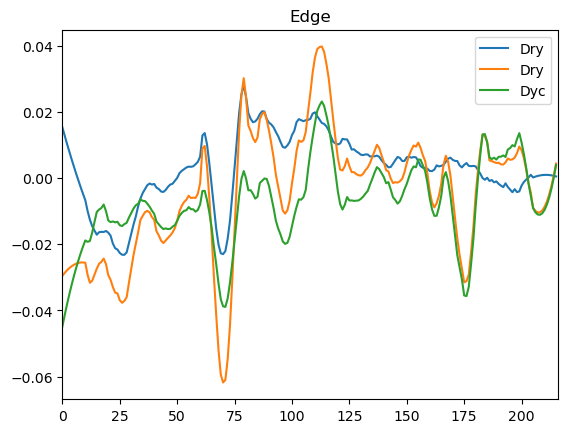

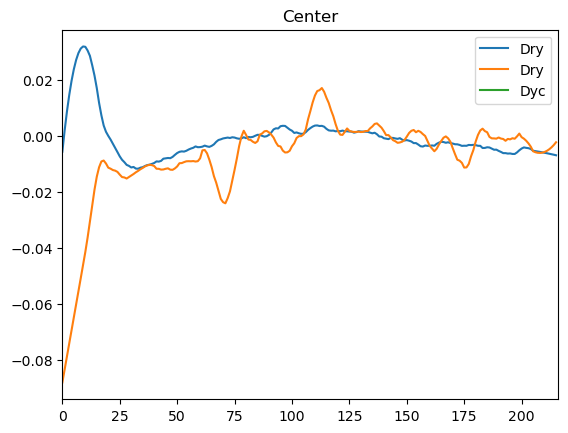

Pos 19
2023_12_04_Ti_pLPT107&pLPT41


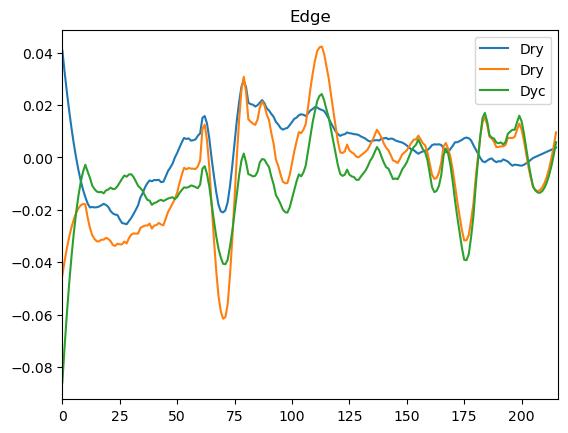

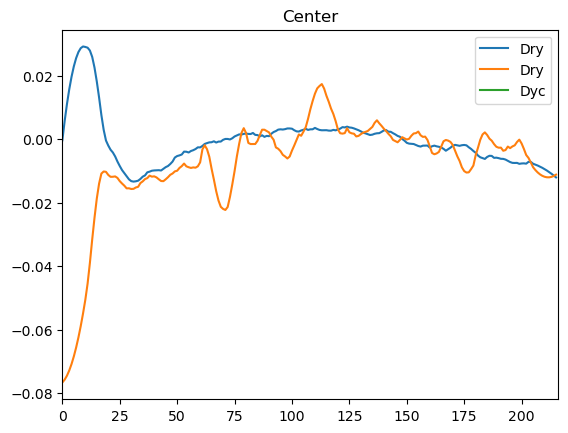

Pos 21
2023_12_04_Ti_pLPT107&pLPT41


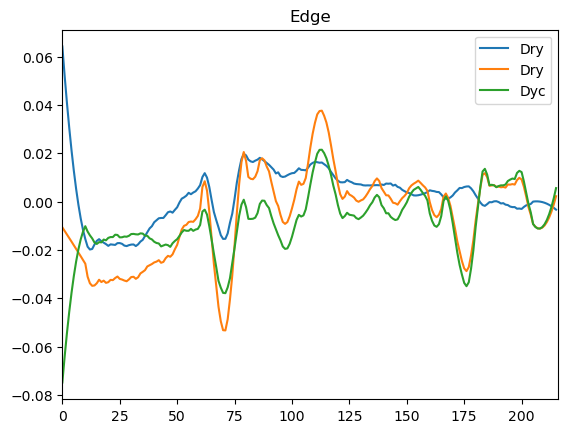

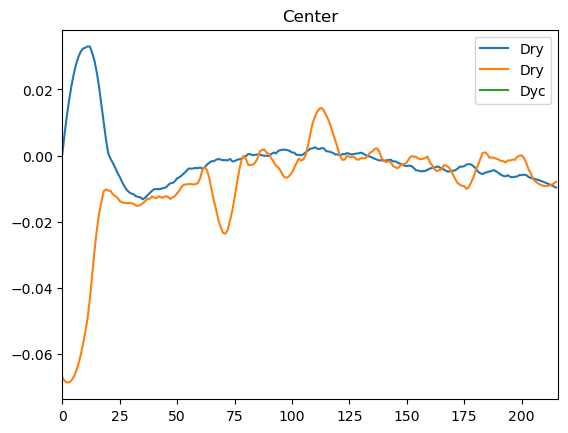

Pos 22
2023_12_04_Ti_pLPT107&pLPT41


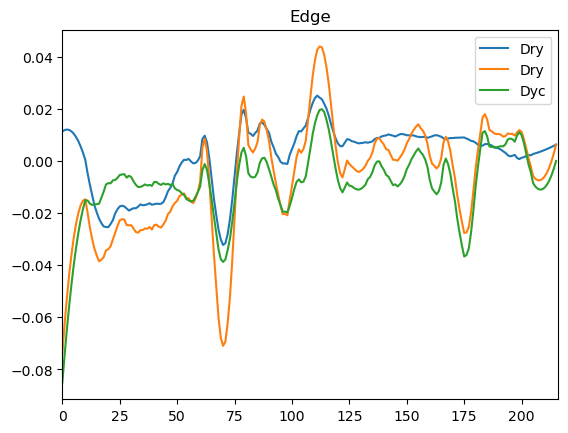

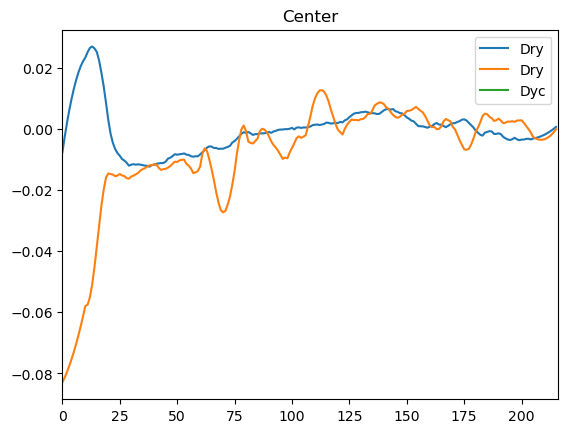

Pos 24
2023_12_04_Ti_pLPT107&pLPT41


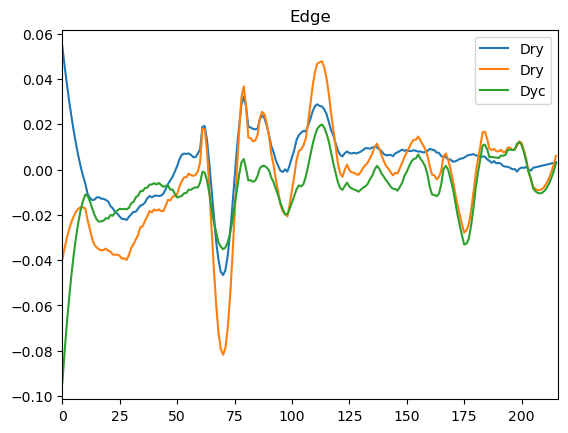

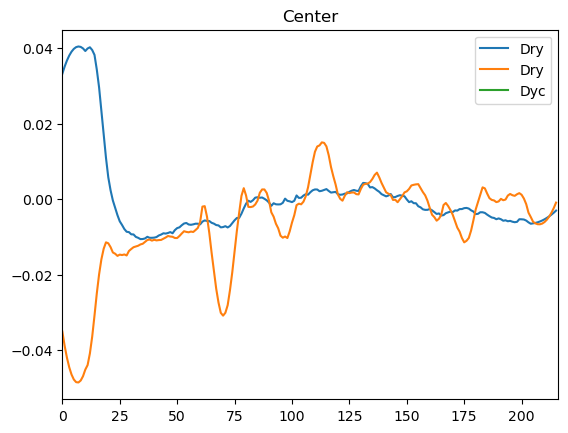

Pos 26
2023_12_04_Ti_pLPT107&pLPT41


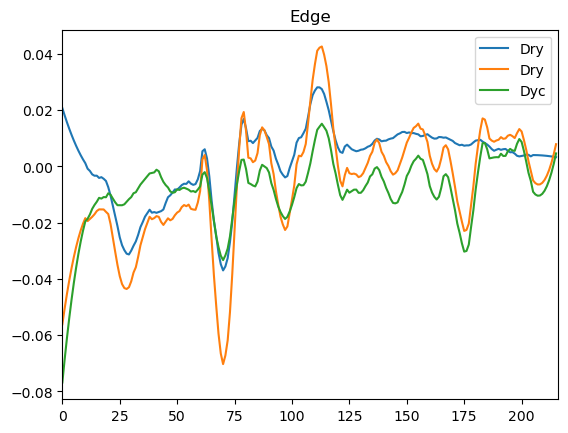

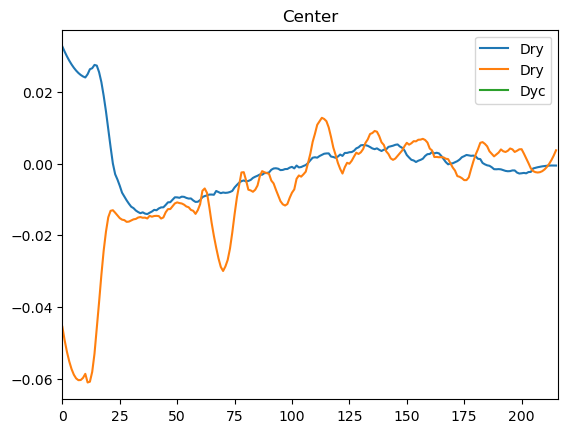

Pos 28
2023_12_04_Ti_pLPT107&pLPT41


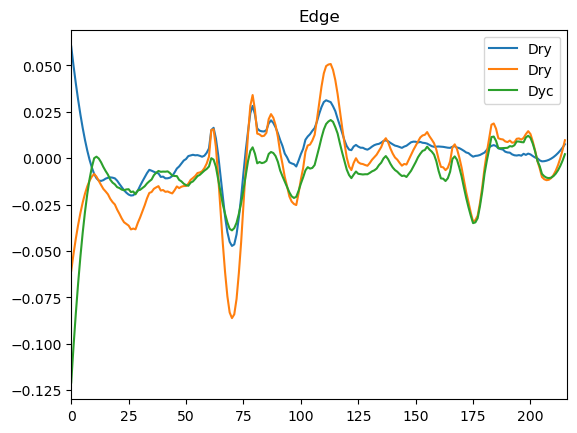

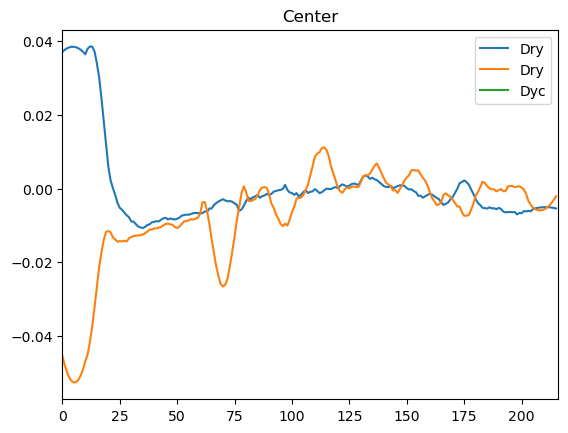

Pos 0
2023_12_04_TiTweez_pLPT107&pLPT41


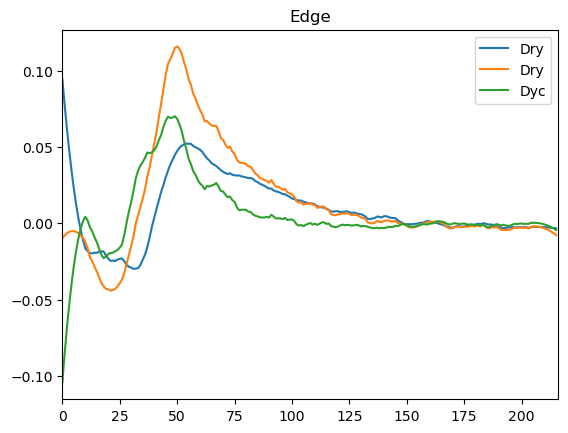

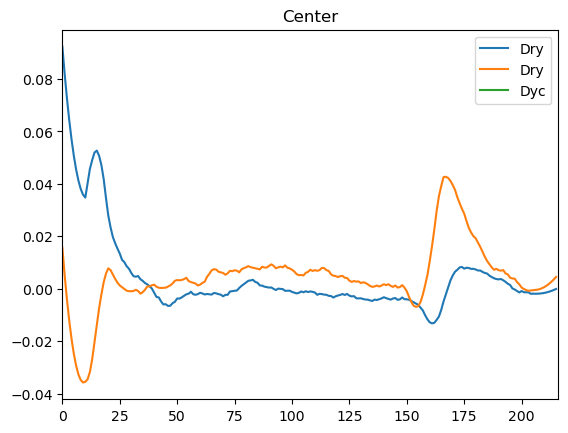

Pos 6
2023_12_04_TiTweez_pLPT107&pLPT41


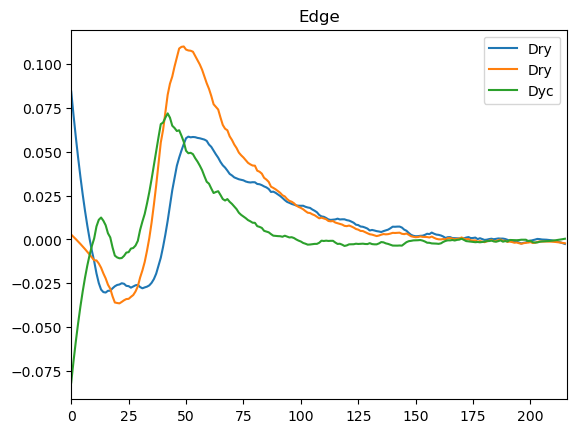

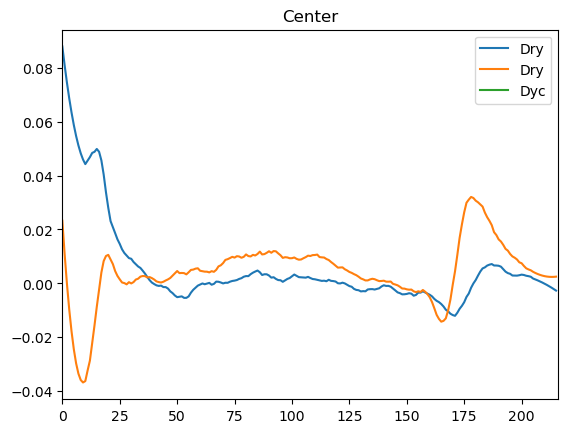

Pos 7
2023_12_04_TiTweez_pLPT107&pLPT41


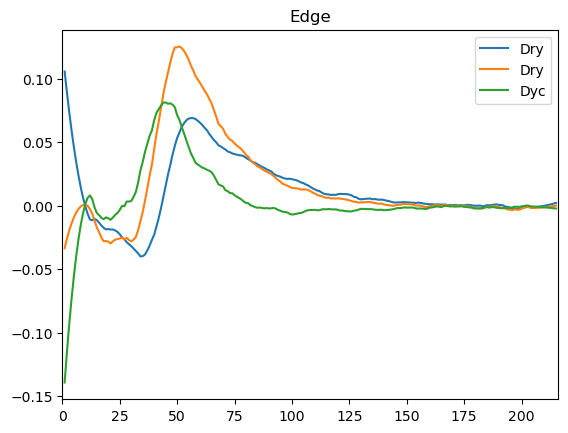

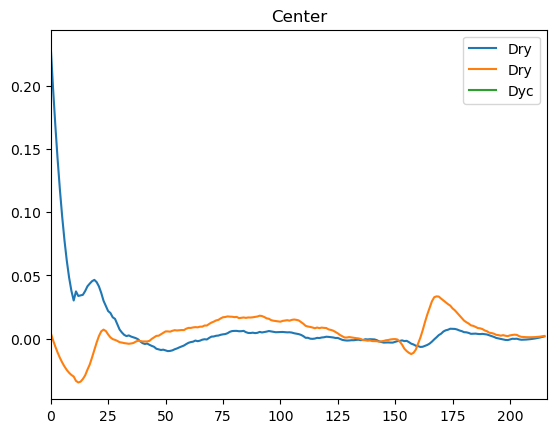

Pos 8
2023_12_04_TiTweez_pLPT107&pLPT41


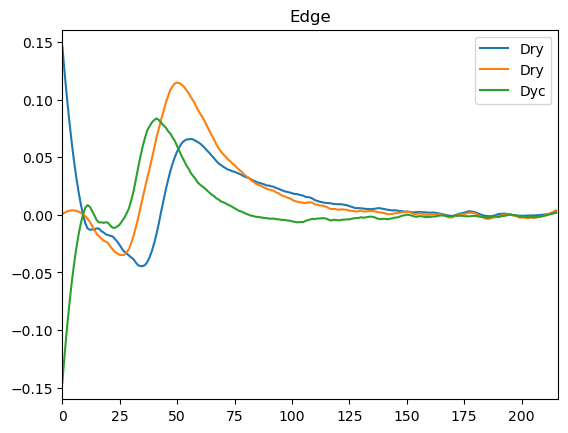

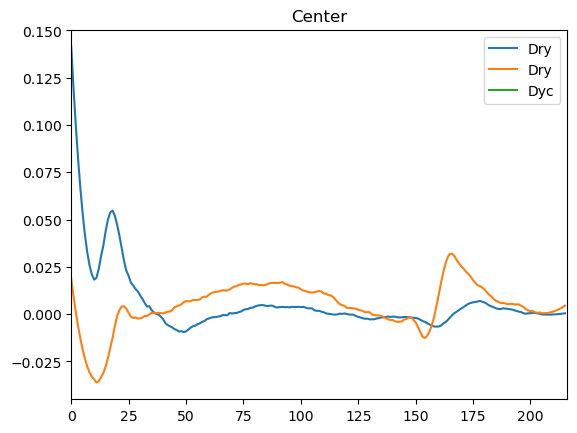

Pos 9
2023_12_04_TiTweez_pLPT107&pLPT41


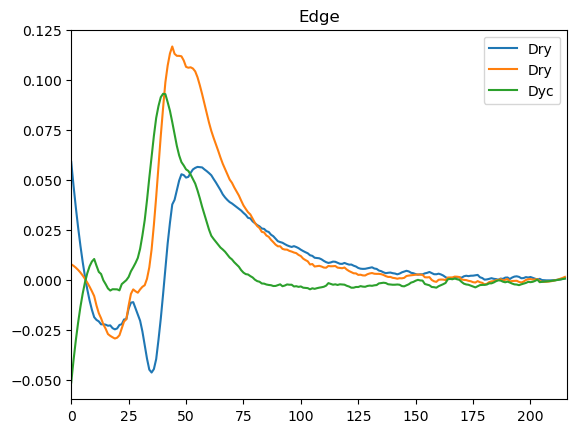

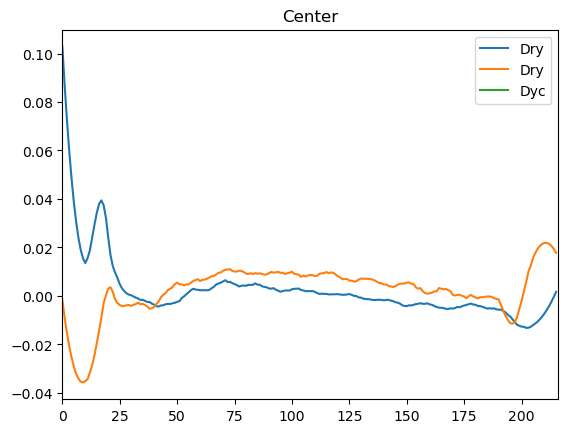

Pos 10
2023_12_04_TiTweez_pLPT107&pLPT41


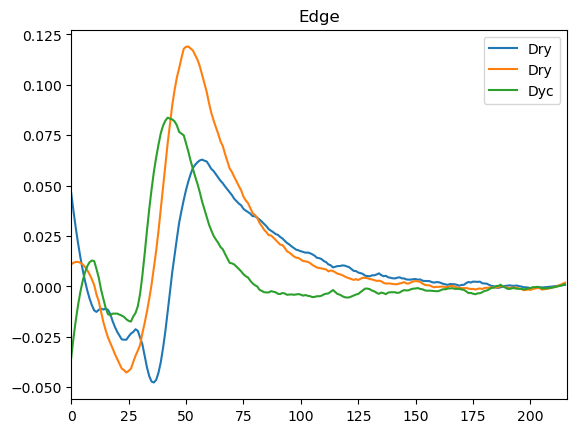

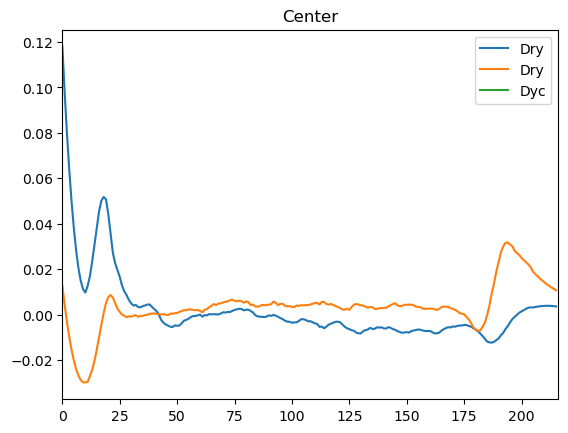

Pos 13
2023_12_04_TiTweez_pLPT107&pLPT41


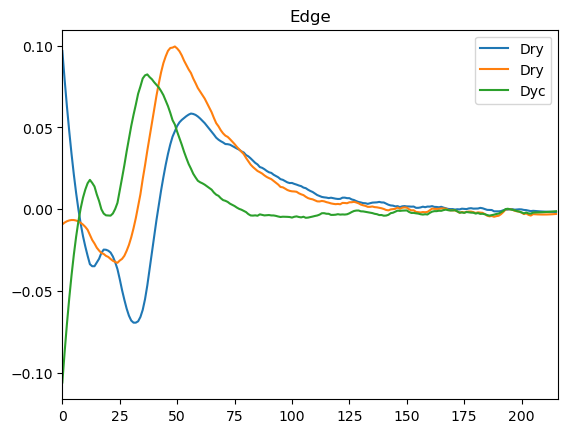

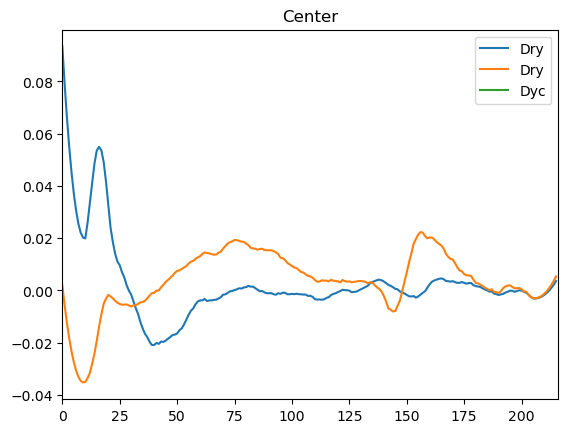

Pos 14
2023_12_04_TiTweez_pLPT107&pLPT41


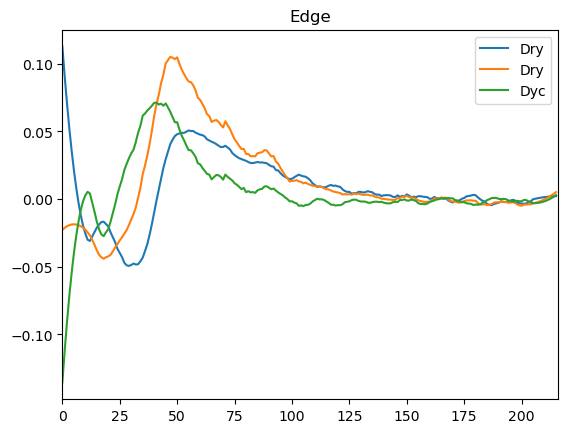

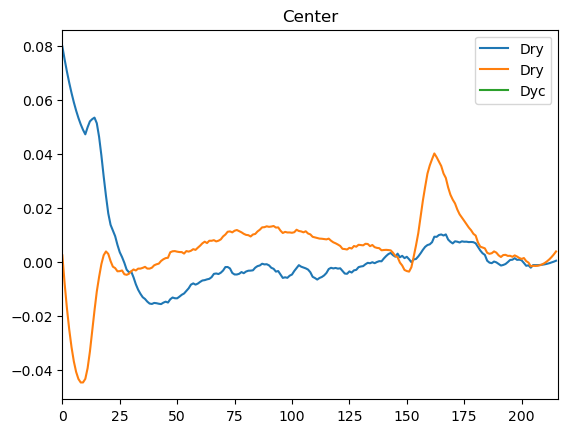

Pos 16
2023_12_04_TiTweez_pLPT107&pLPT41


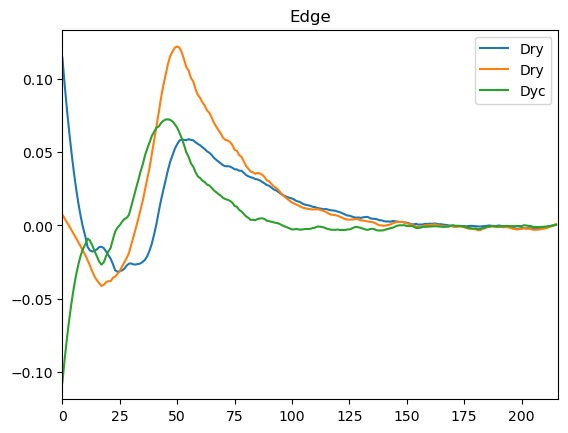

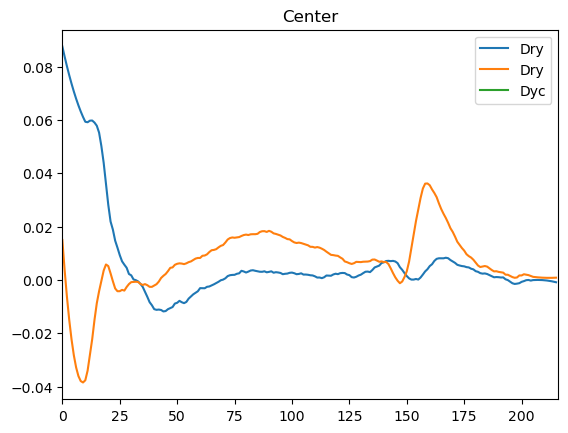

Pos 19
2023_12_04_TiTweez_pLPT107&pLPT41


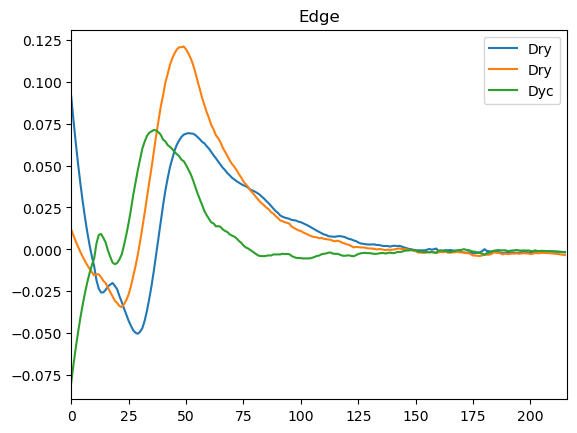

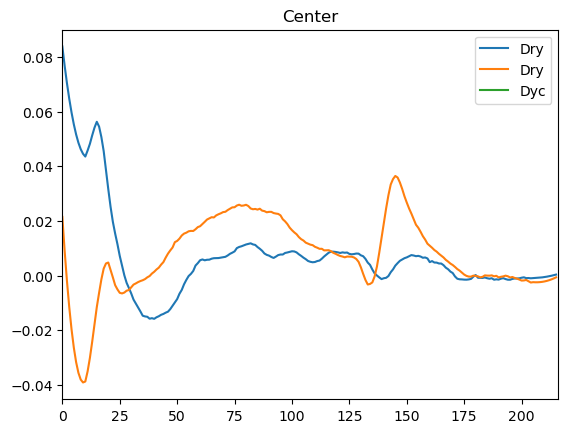

Pos 20
2023_12_04_TiTweez_pLPT107&pLPT41


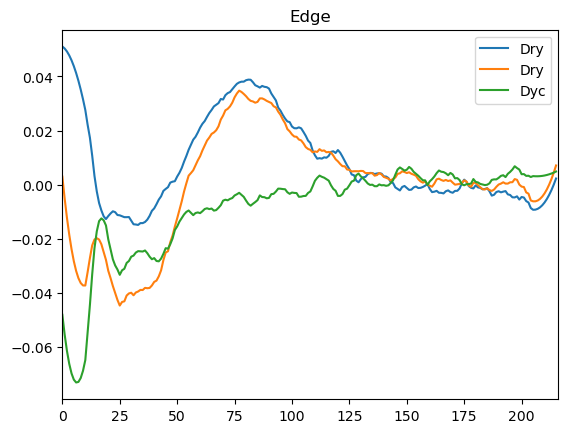

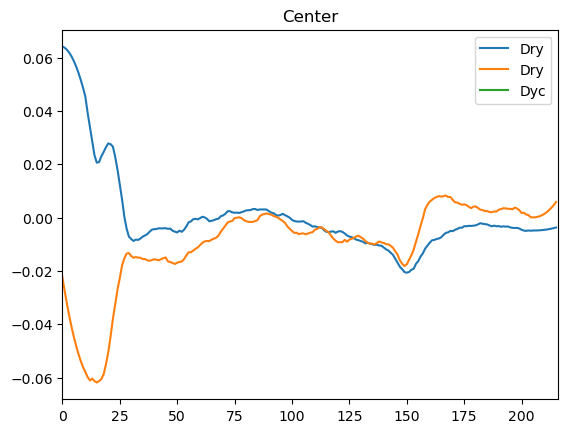

Pos 21
2023_12_04_TiTweez_pLPT107&pLPT41


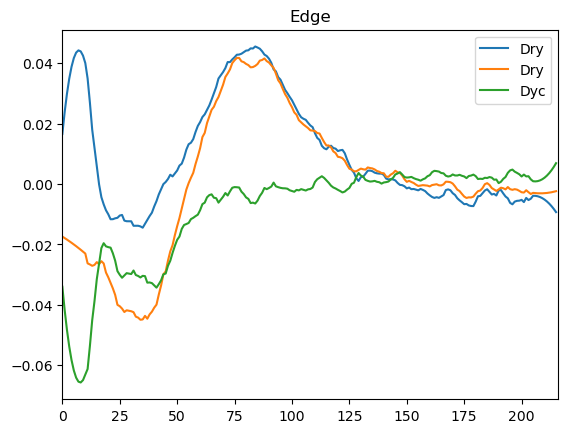

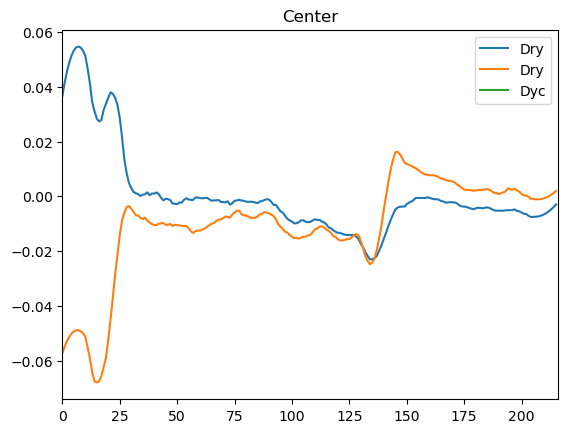

Pos 22
2023_12_04_TiTweez_pLPT107&pLPT41


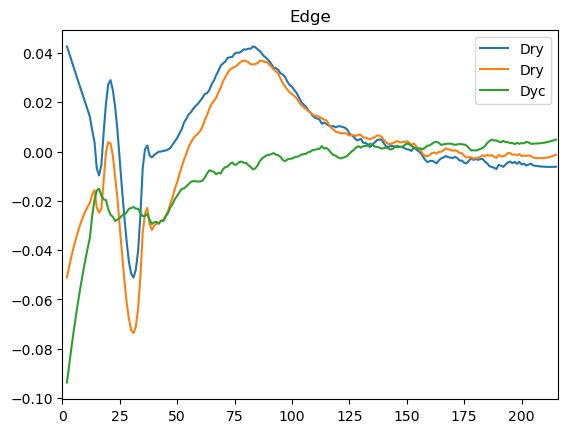

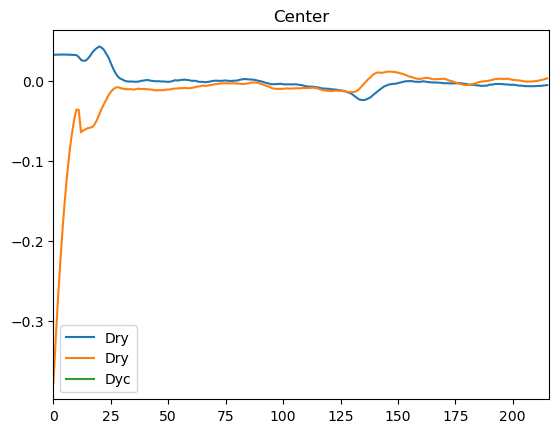

Pos 23
2023_12_04_TiTweez_pLPT107&pLPT41


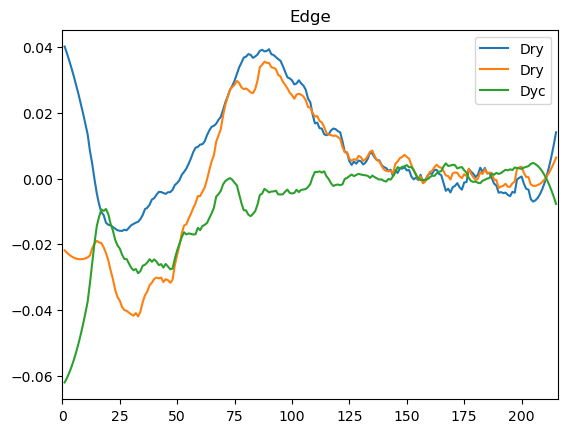

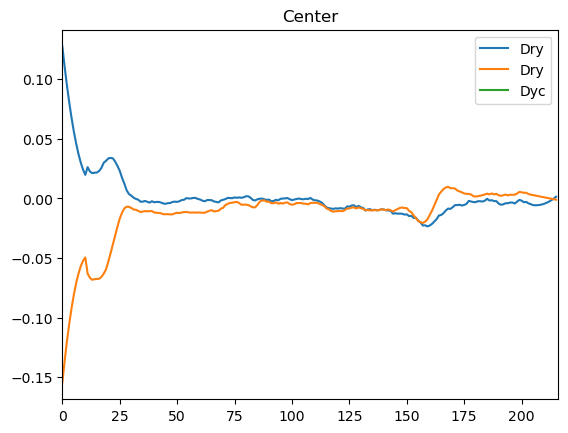

Pos 25
2023_12_04_TiTweez_pLPT107&pLPT41


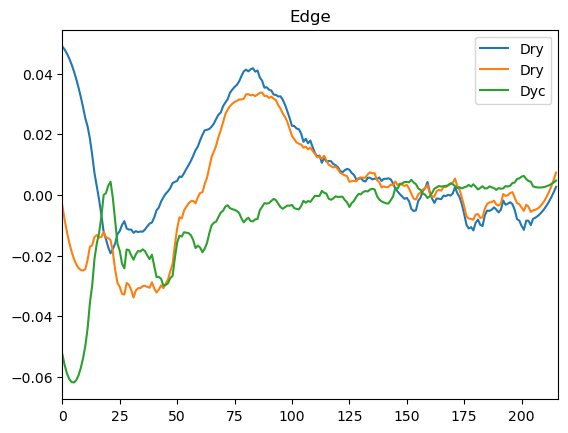

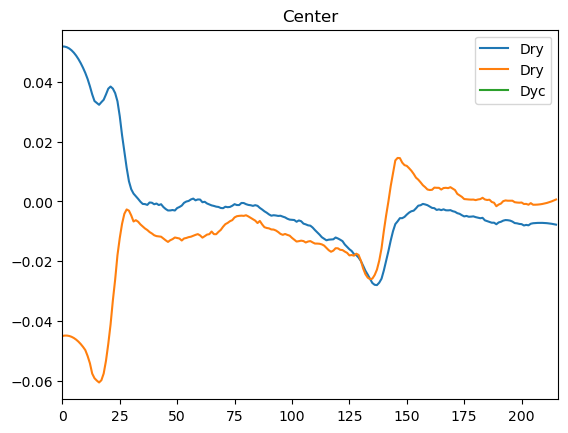

Pos 26
2023_12_04_TiTweez_pLPT107&pLPT41


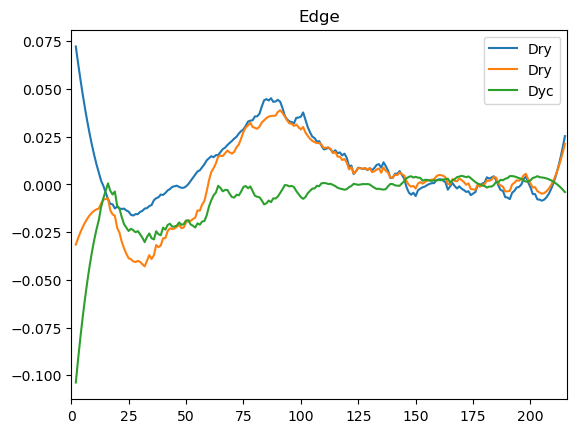

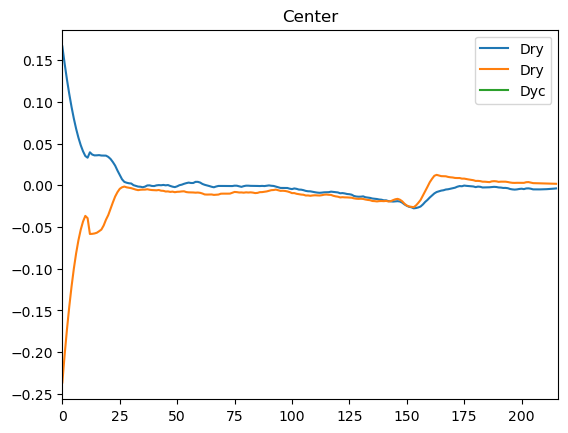

Pos 27
2023_12_04_TiTweez_pLPT107&pLPT41


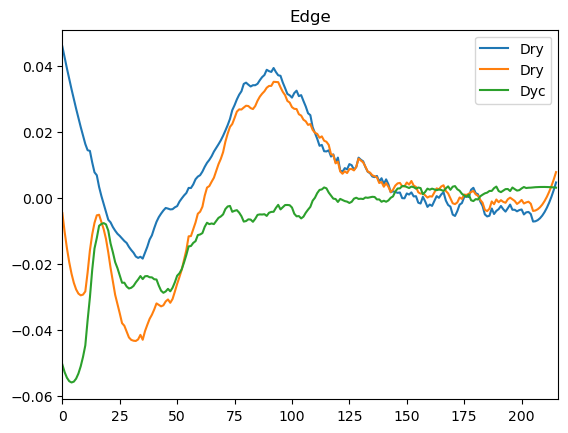

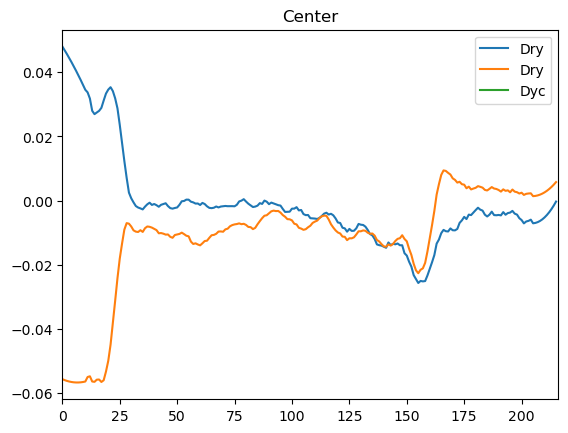

Pos 29
2023_12_04_TiTweez_pLPT107&pLPT41


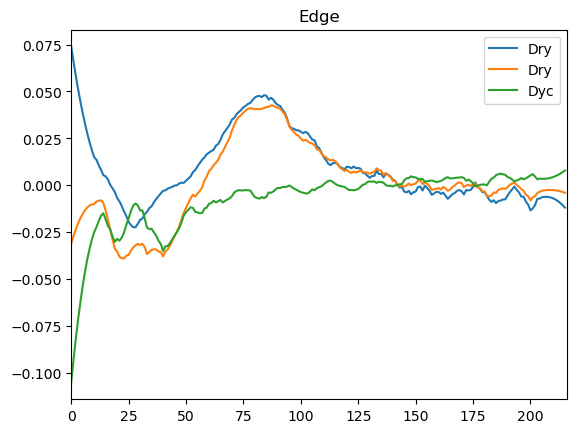

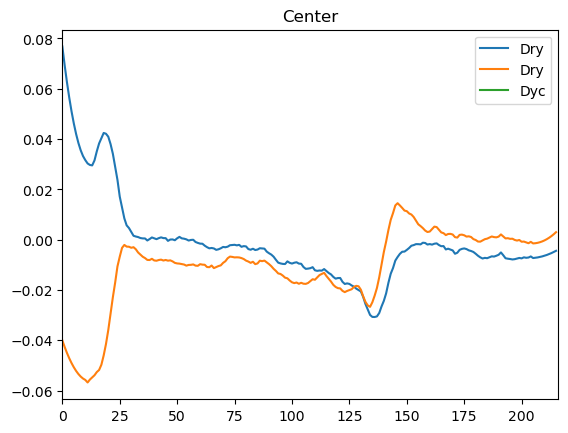

Pos 31
2023_12_04_TiTweez_pLPT107&pLPT41


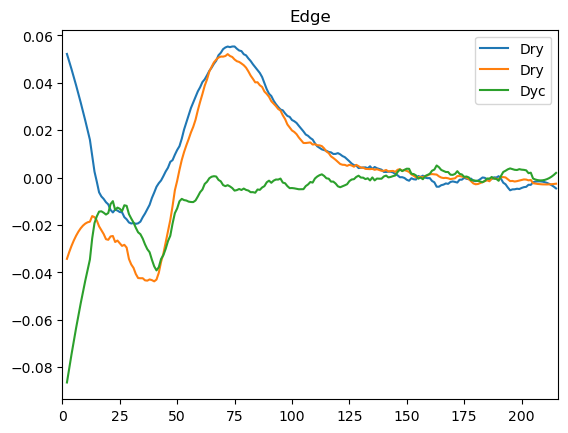

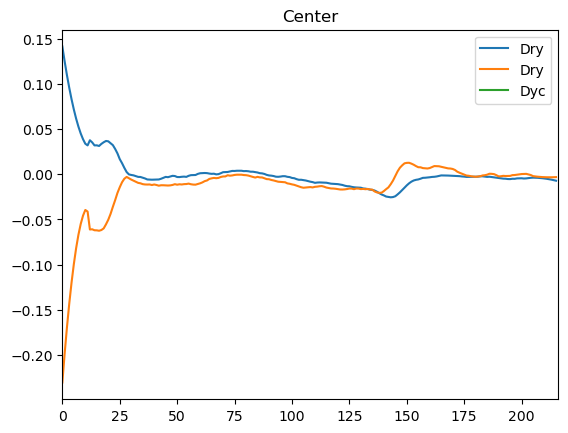

Pos 33
2023_12_04_TiTweez_pLPT107&pLPT41


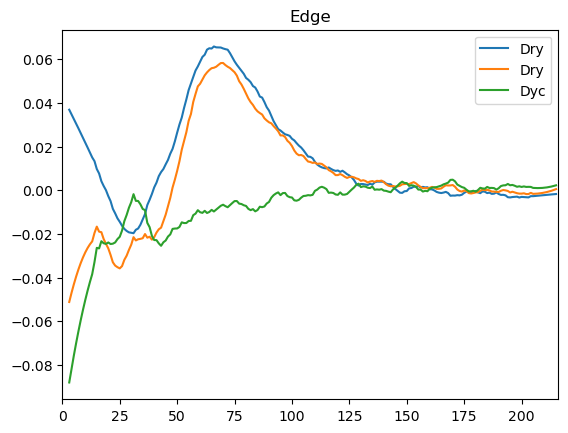

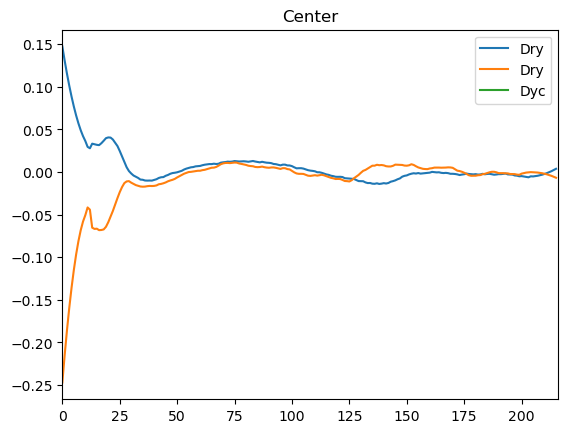

Pos 34
2023_12_04_TiTweez_pLPT107&pLPT41


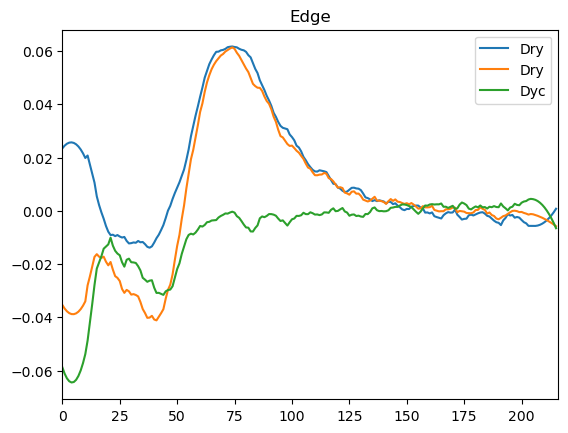

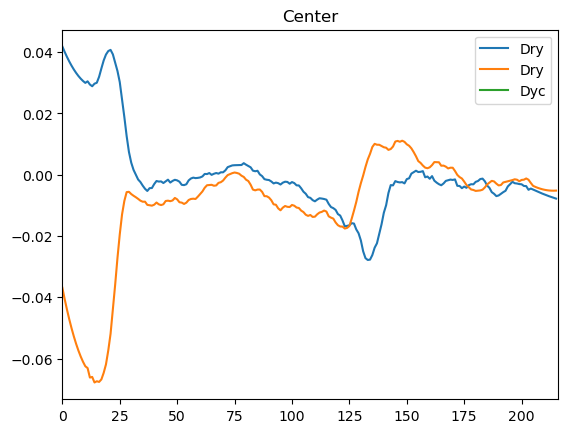

Pos 35
2023_12_04_TiTweez_pLPT107&pLPT41


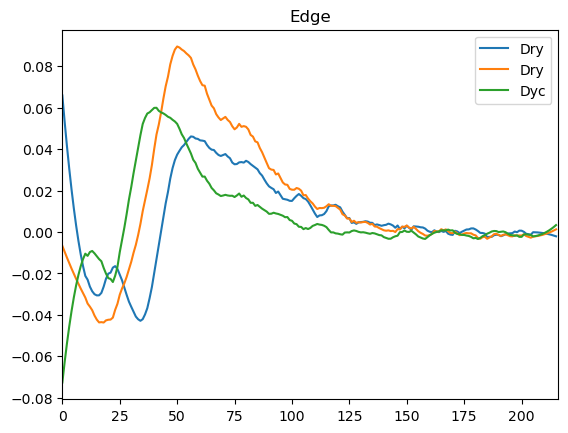

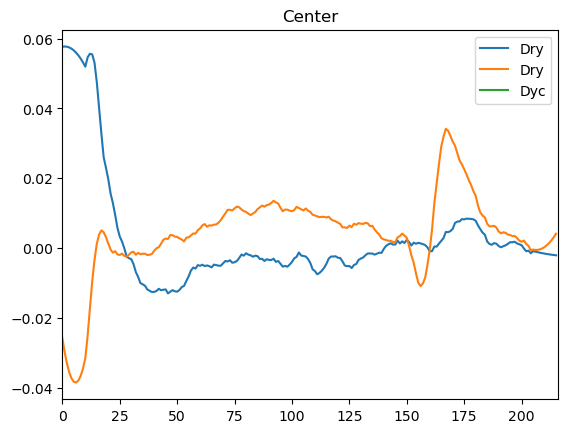

Pos 36
2023_12_04_TiTweez_pLPT107&pLPT41


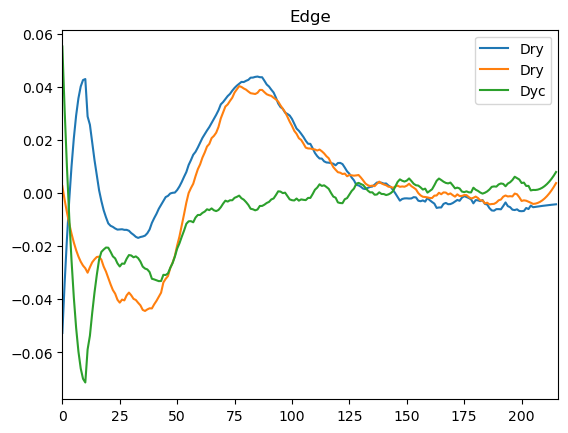

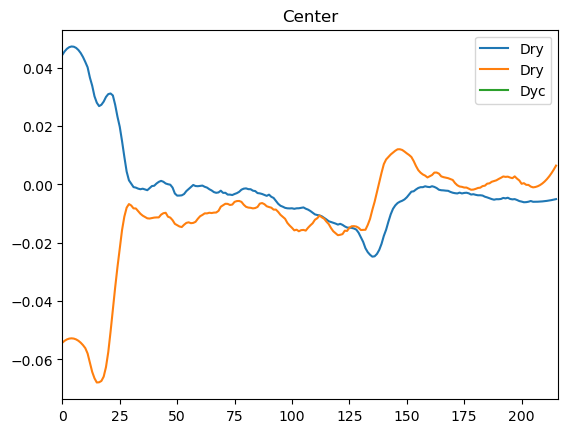

Pos 37
2023_12_04_TiTweez_pLPT107&pLPT41


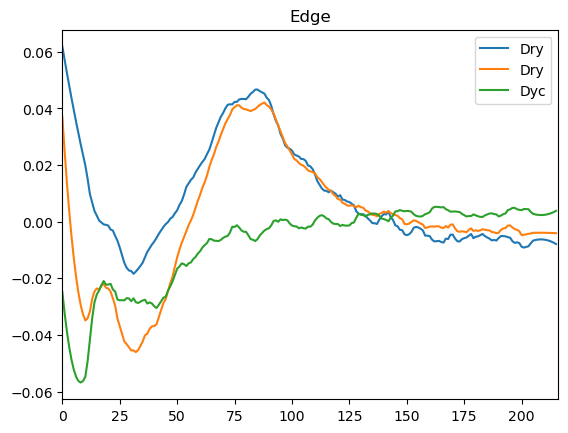

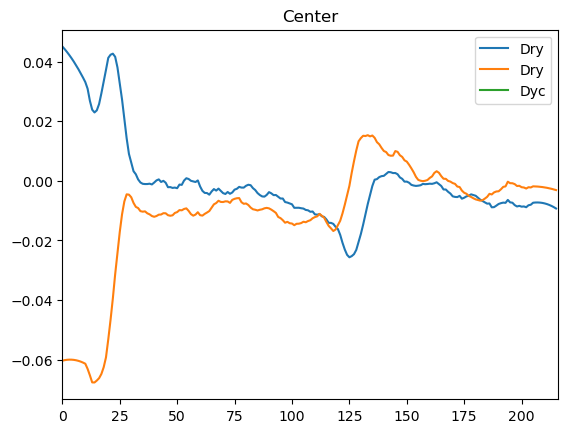

Pos 38
2023_12_04_TiTweez_pLPT107&pLPT41


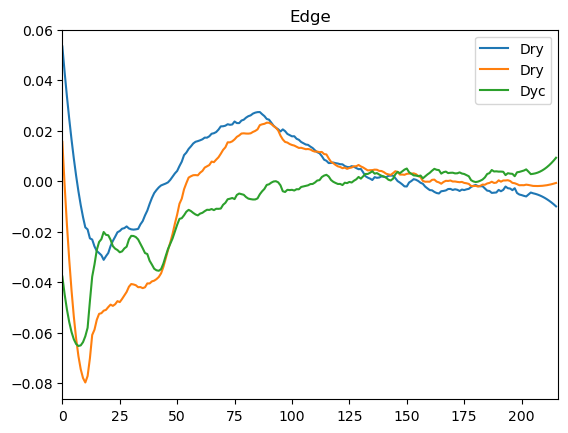

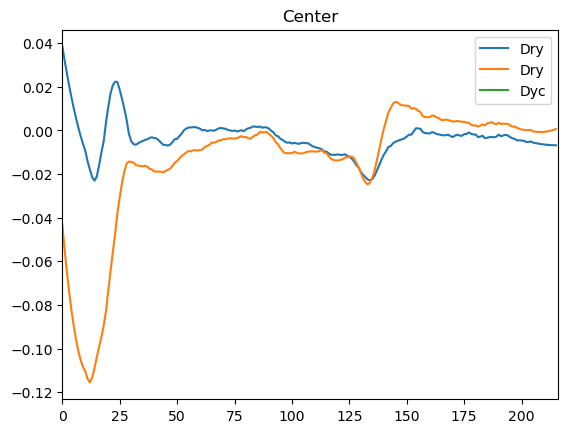

Pos 1
2023_12_06_TiTweez_pLPT20&pLPT41


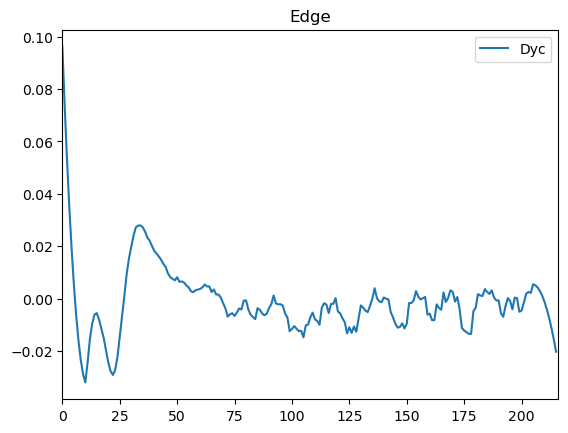

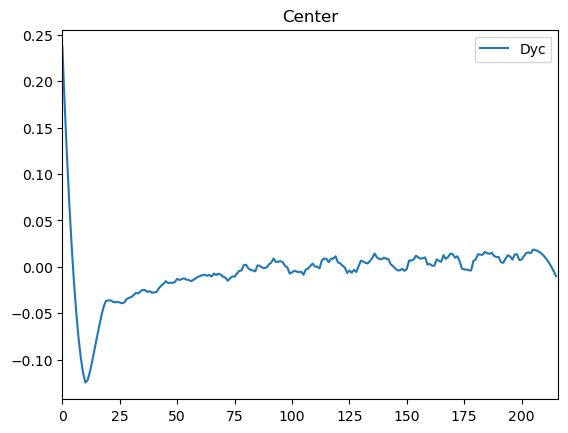

Pos 4
2023_12_06_TiTweez_pLPT20&pLPT41


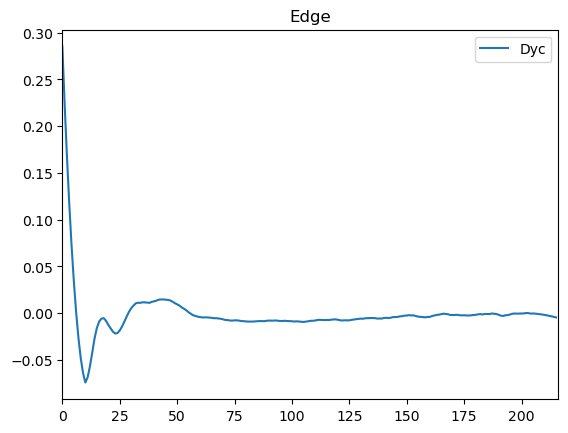

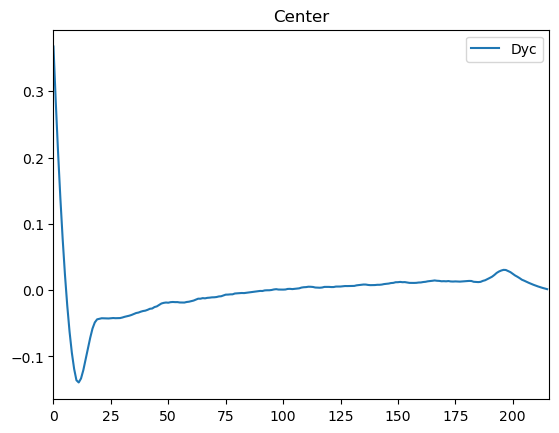

Pos 5
2023_12_06_TiTweez_pLPT20&pLPT41


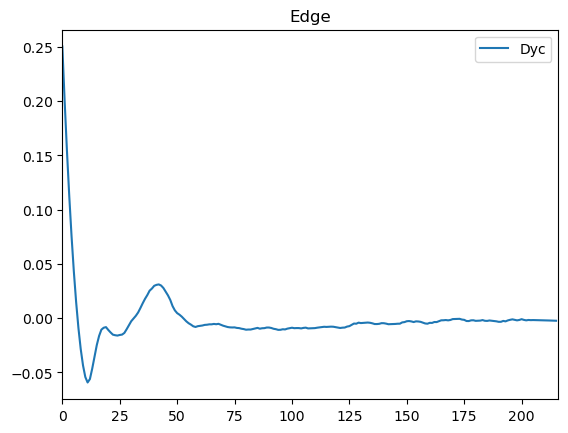

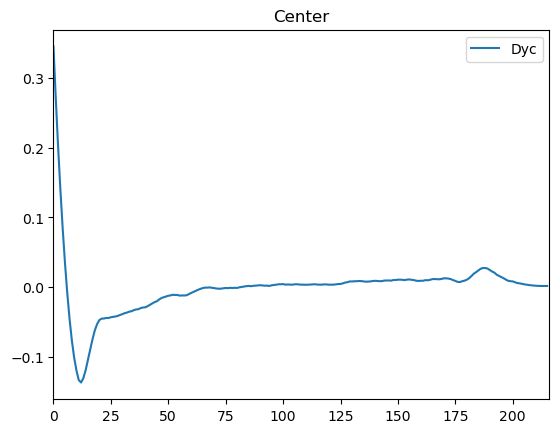

Pos 6
2023_12_06_TiTweez_pLPT20&pLPT41


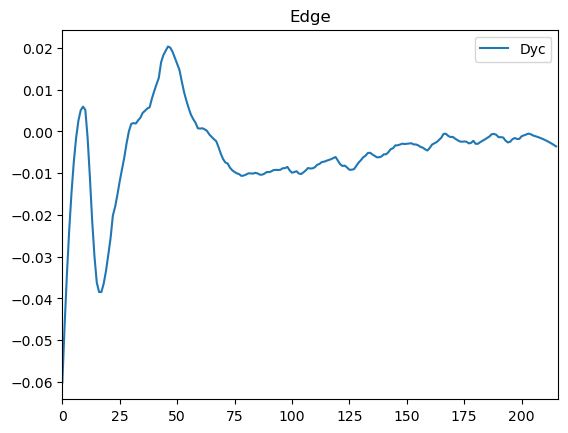

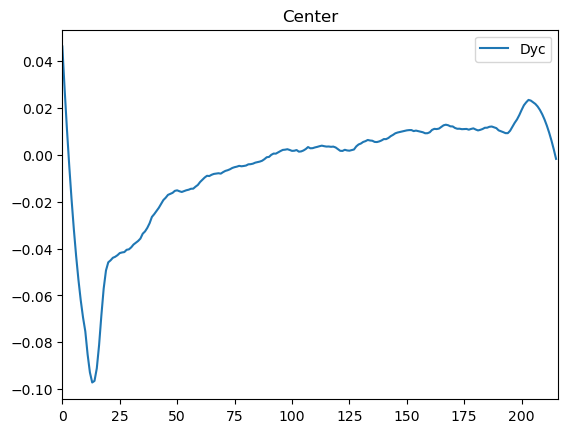

Pos 7
2023_12_06_TiTweez_pLPT20&pLPT41


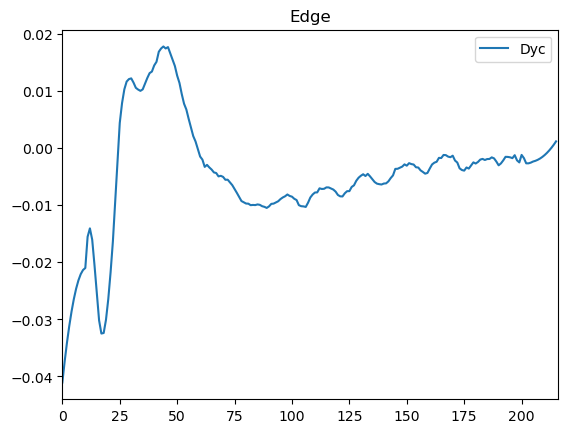

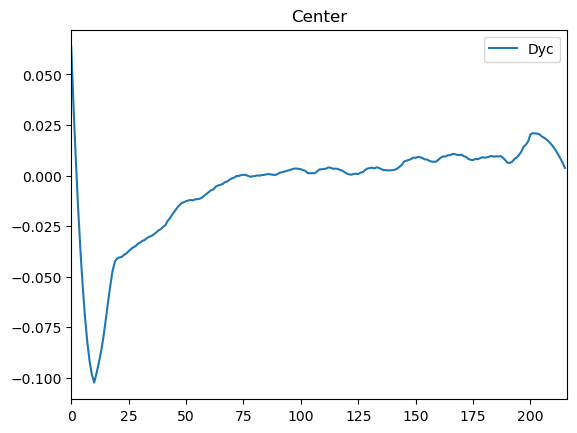

Pos 11
2023_12_06_TiTweez_pLPT20&pLPT41


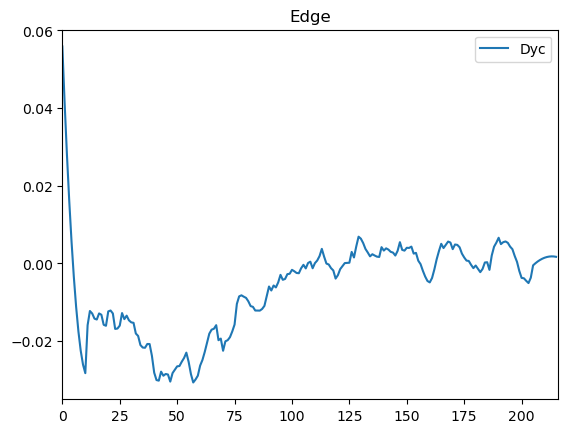

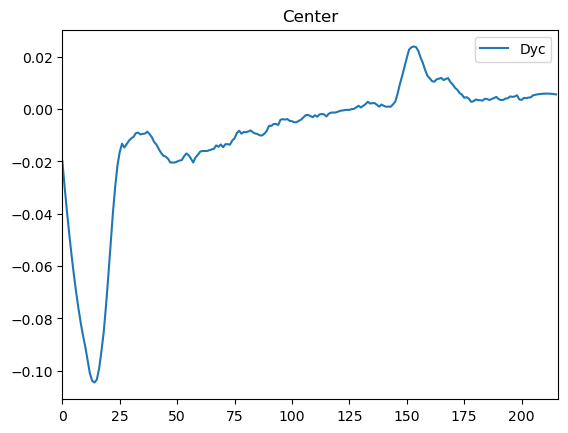

Pos 12
2023_12_06_TiTweez_pLPT20&pLPT41


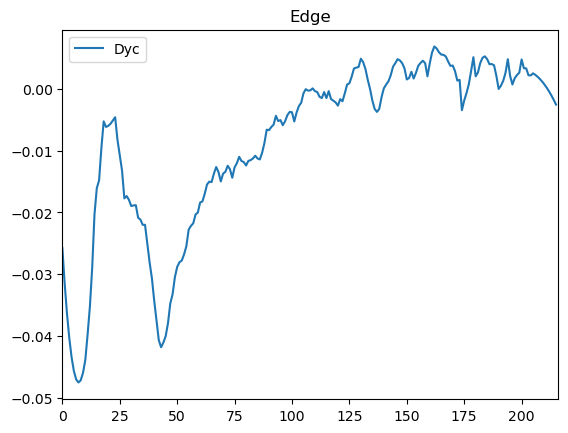

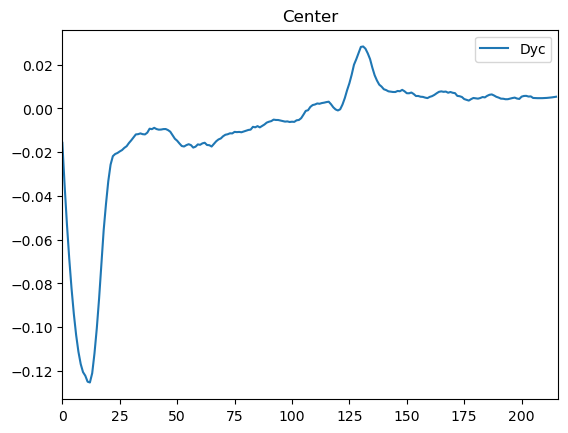

Pos 13
2023_12_06_TiTweez_pLPT20&pLPT41


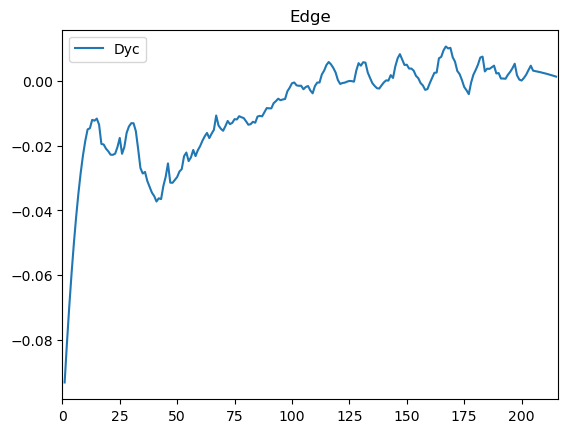

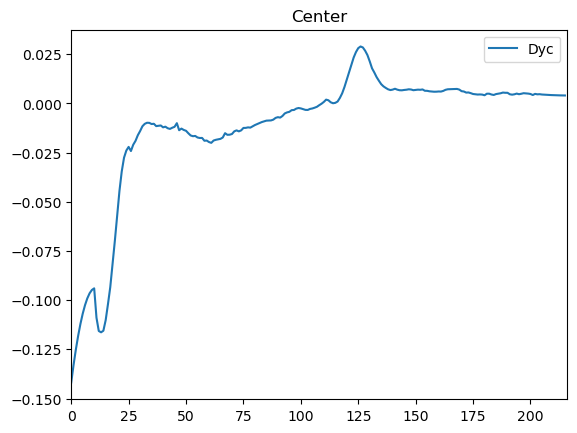

Pos 14
2023_12_06_TiTweez_pLPT20&pLPT41


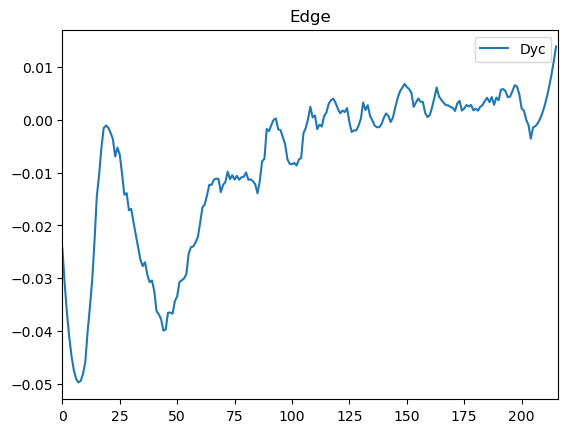

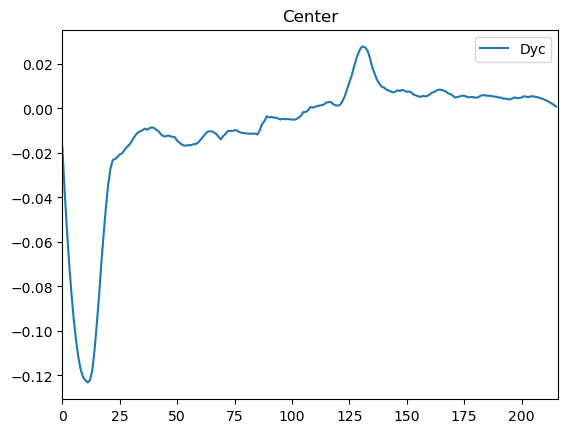

Pos 15
2023_12_06_TiTweez_pLPT20&pLPT41


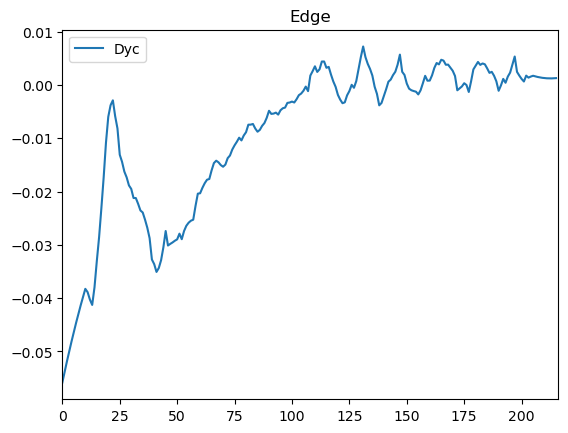

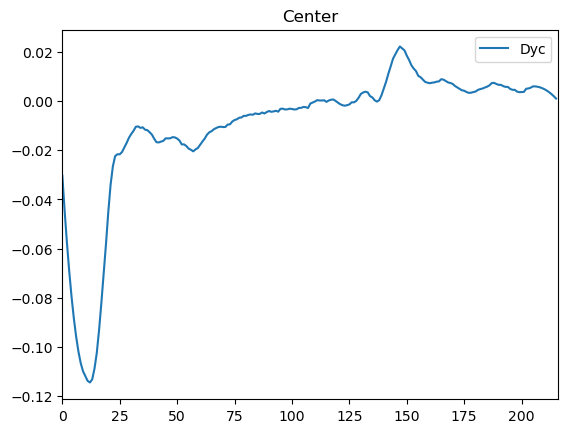

Pos 16
2023_12_06_TiTweez_pLPT20&pLPT41


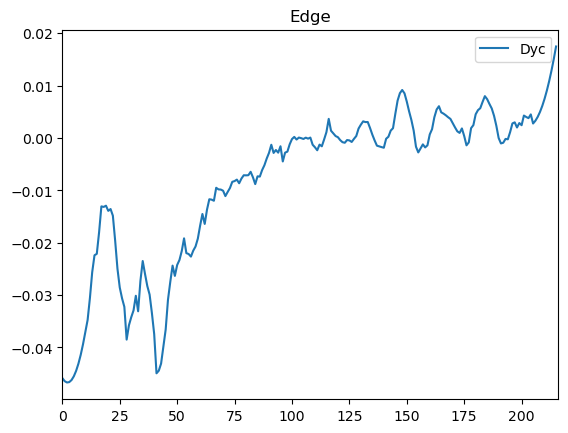

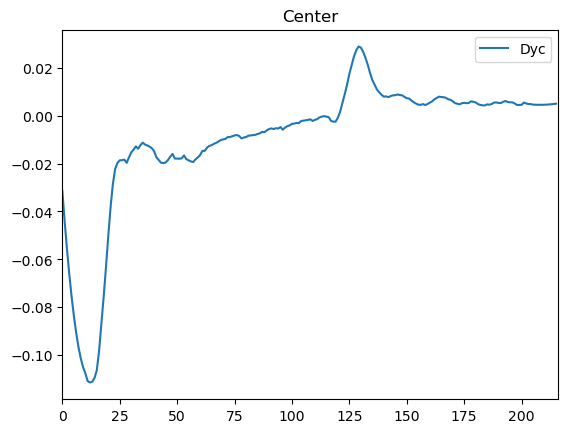

Pos 17
2023_12_06_TiTweez_pLPT20&pLPT41


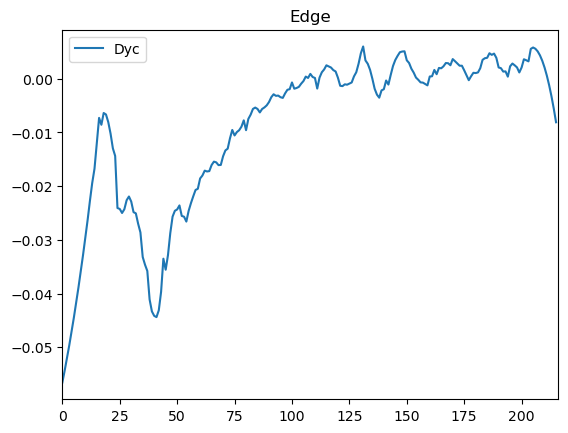

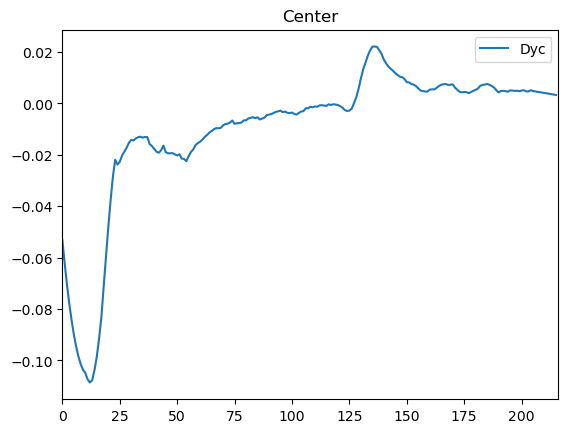

Pos 18
2023_12_06_TiTweez_pLPT20&pLPT41


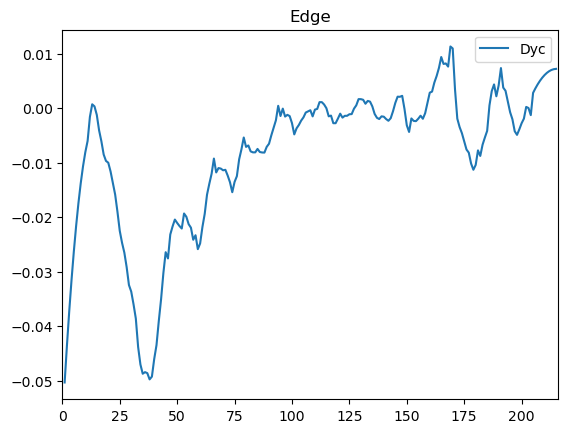

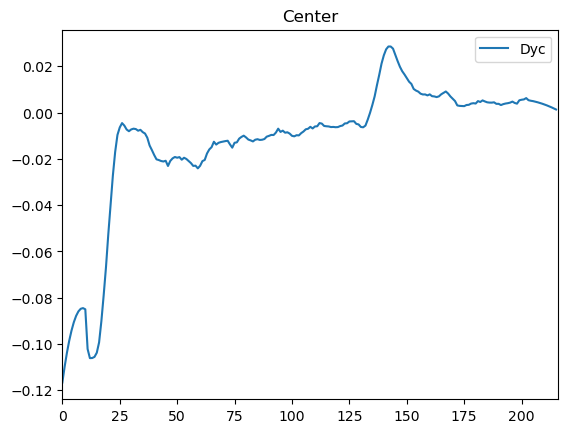

Pos 21
2023_12_06_TiTweez_pLPT20&pLPT41


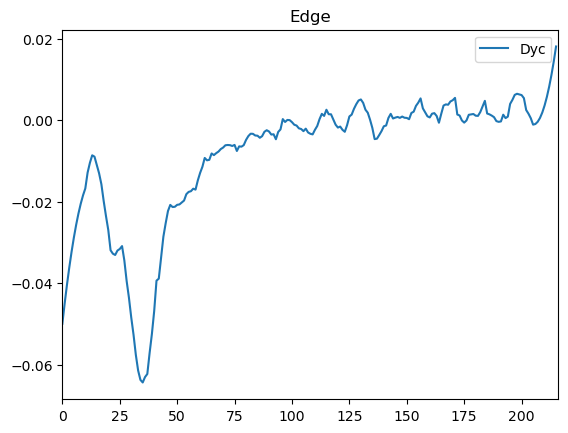

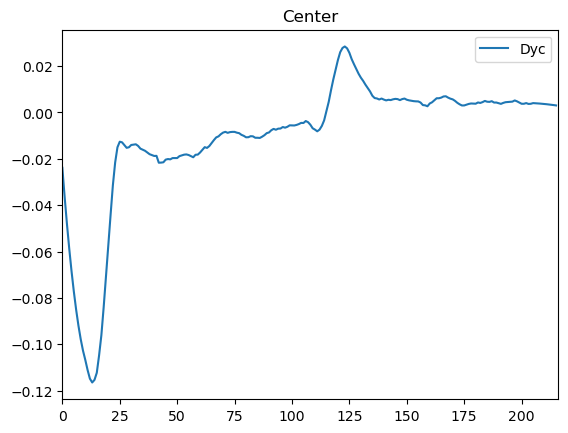

Pos 22
2023_12_06_TiTweez_pLPT20&pLPT41


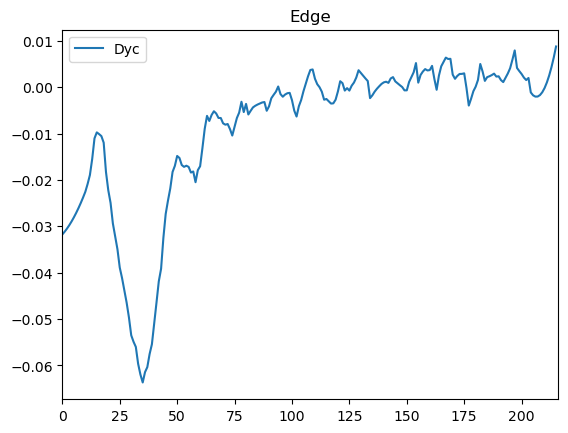

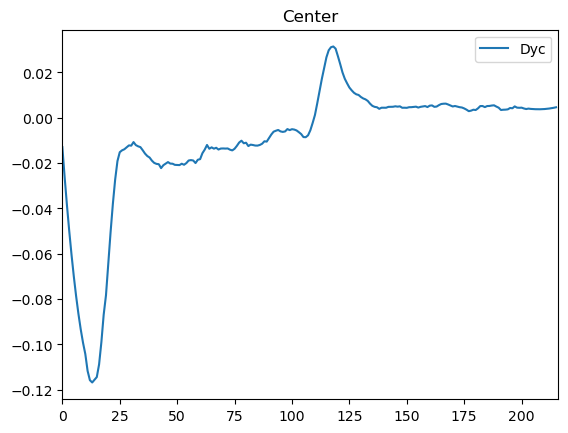

Pos 23
2023_12_06_TiTweez_pLPT20&pLPT41


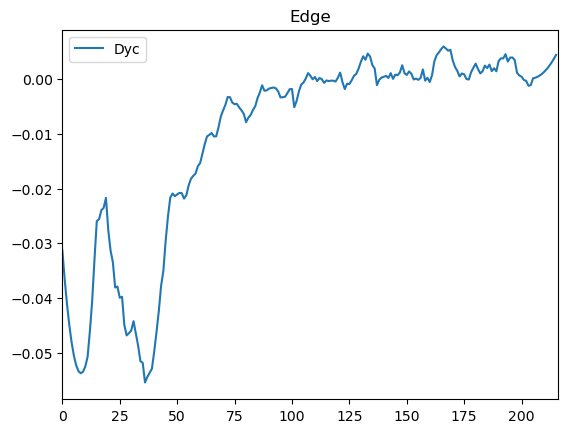

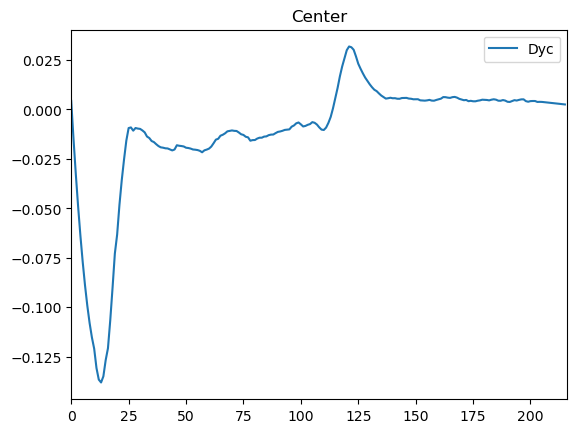

Pos 25
2023_12_06_TiTweez_pLPT20&pLPT41


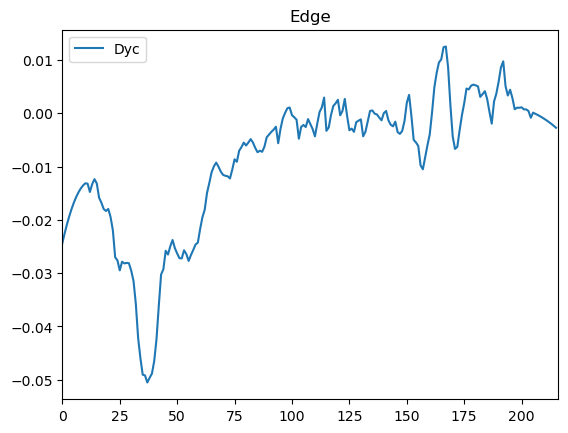

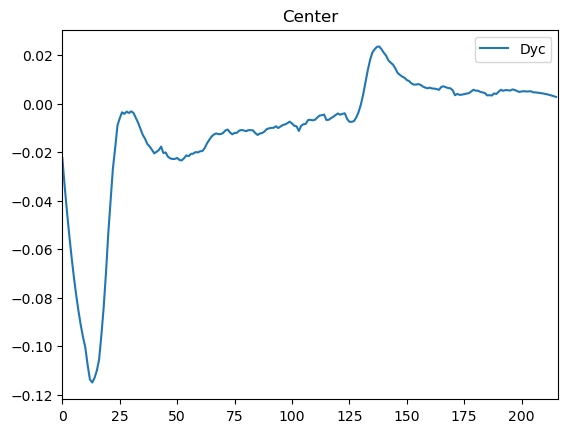

Pos 26
2023_12_06_TiTweez_pLPT20&pLPT41


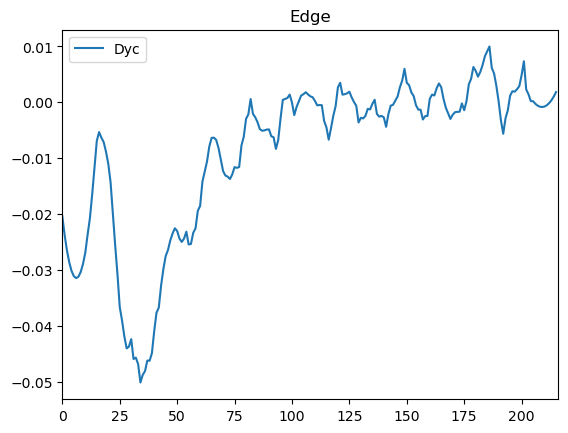

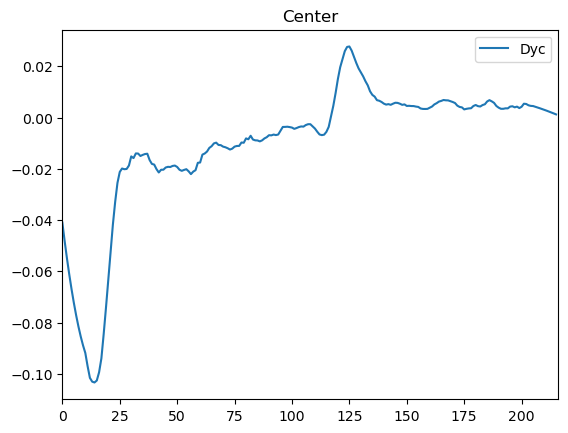

Pos 27
2023_12_06_TiTweez_pLPT20&pLPT41


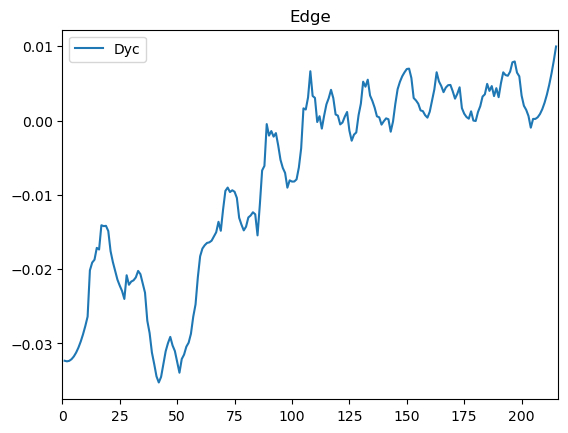

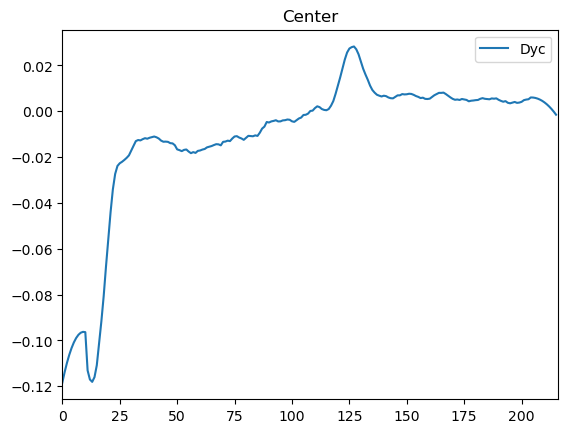

Pos 28
2023_12_06_TiTweez_pLPT20&pLPT41


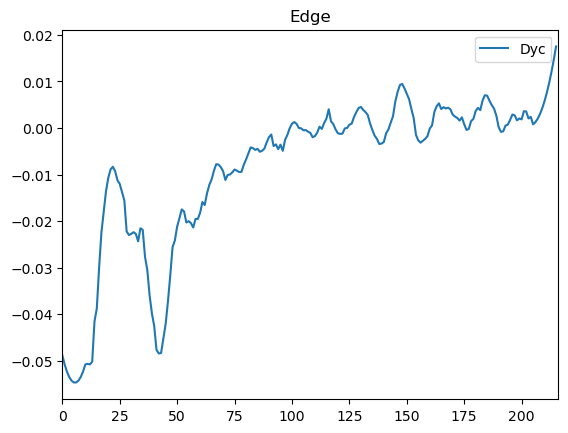

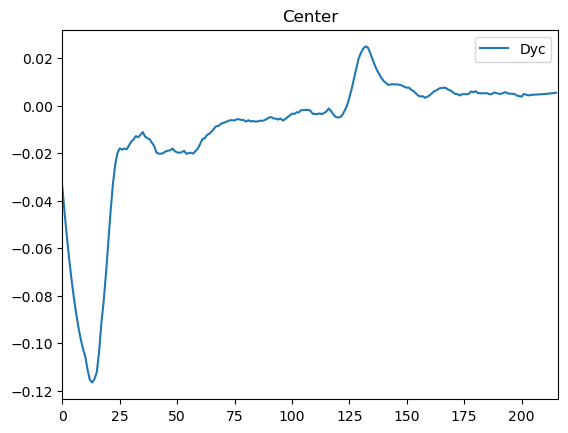

Pos 0
2023_12_08_Ti_pLPT107&pLPT41


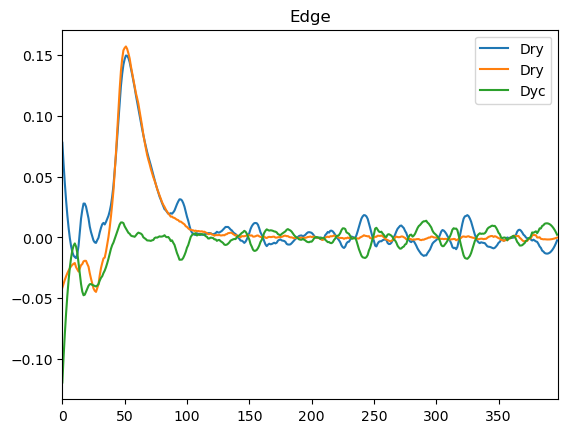

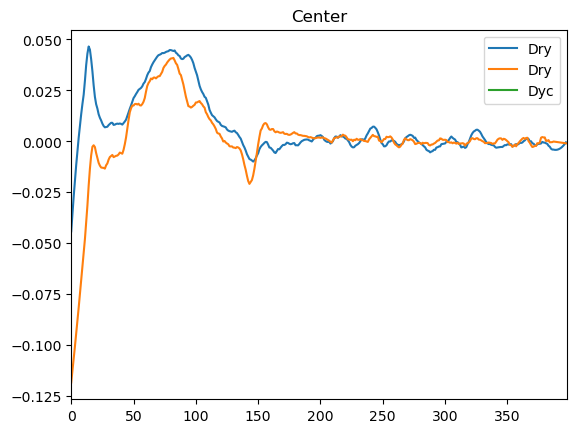

Pos 1
2023_12_08_Ti_pLPT107&pLPT41


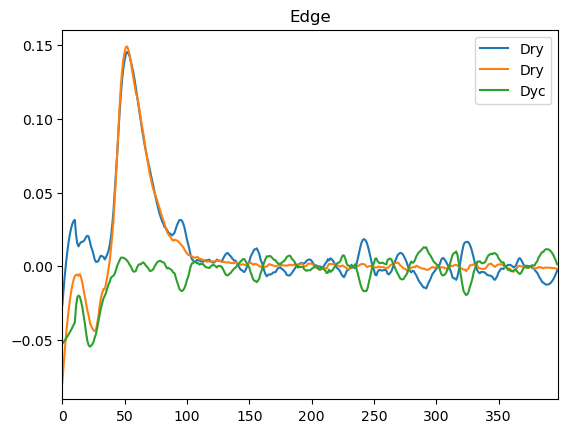

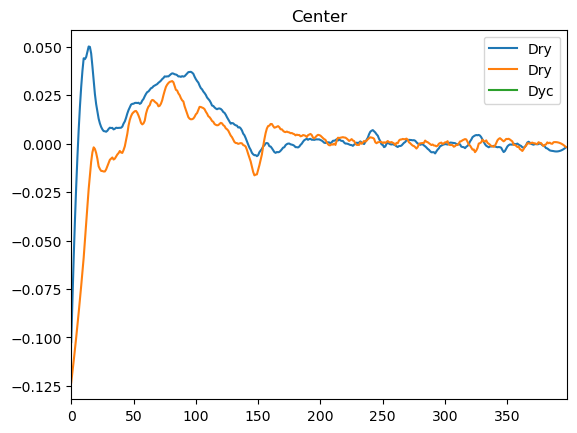

Pos 2
2023_12_08_Ti_pLPT107&pLPT41


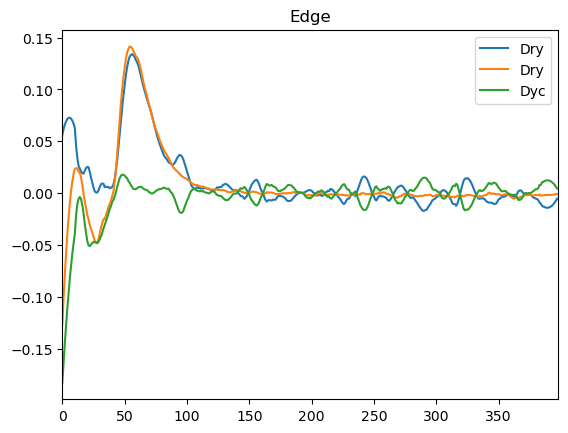

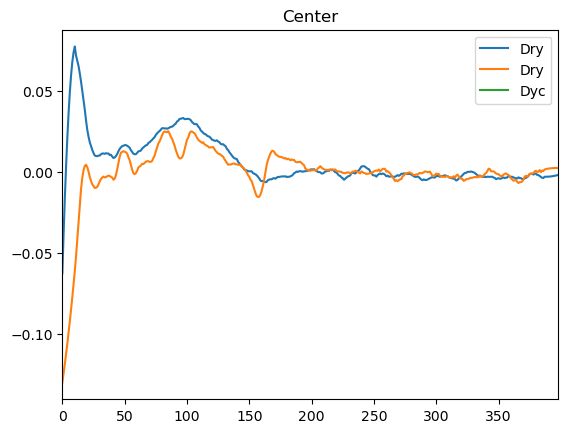

Pos 5
2023_12_08_Ti_pLPT107&pLPT41


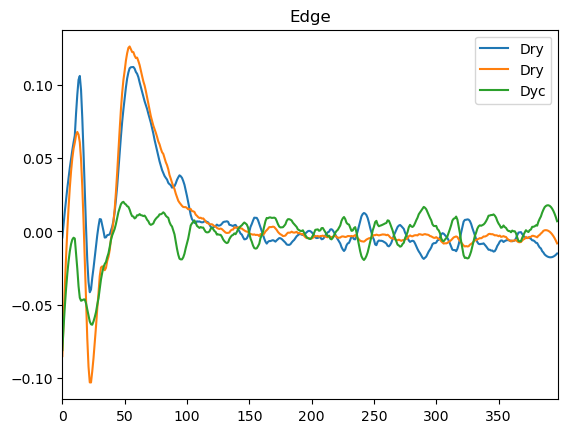

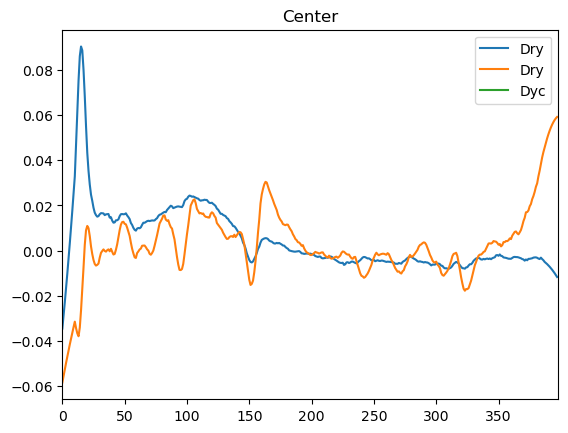

Pos 6
2023_12_08_Ti_pLPT107&pLPT41


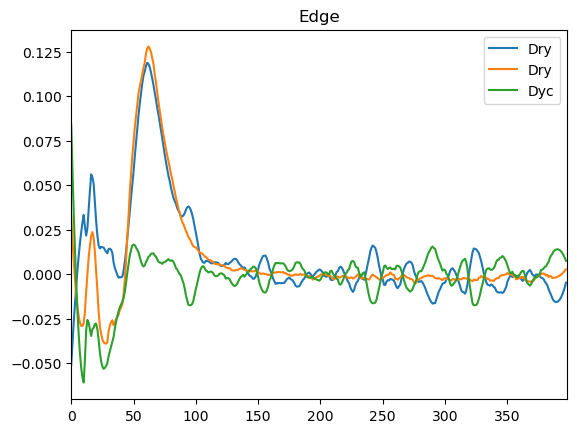

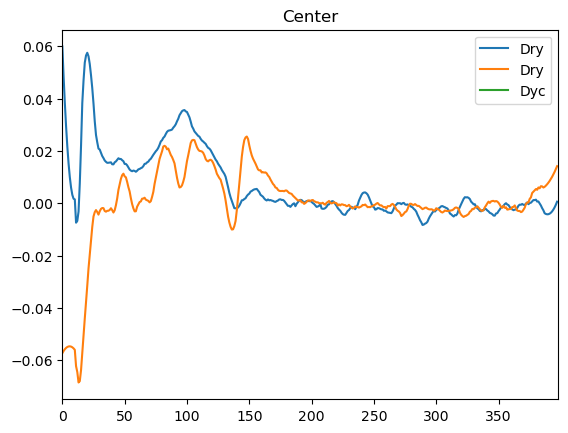

Pos 9
2023_12_08_Ti_pLPT107&pLPT41


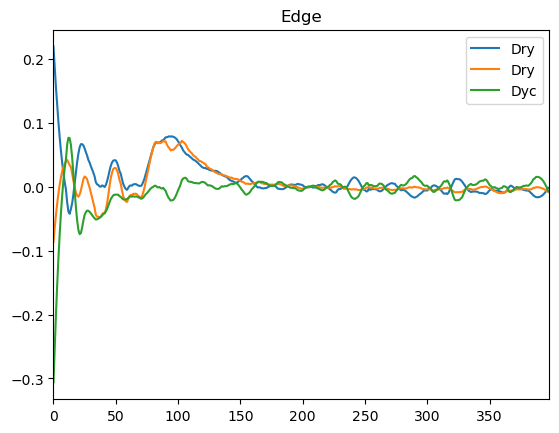

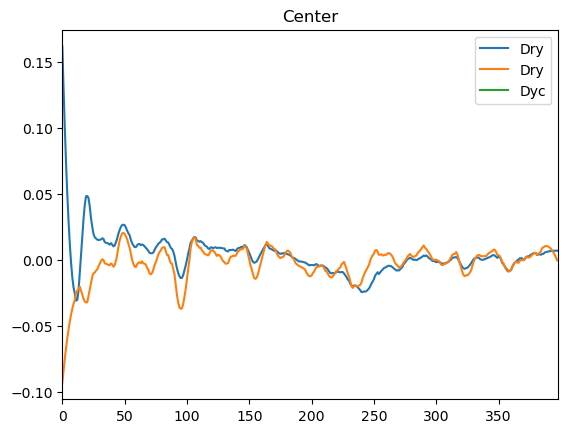

Pos 14
2023_12_08_Ti_pLPT107&pLPT41


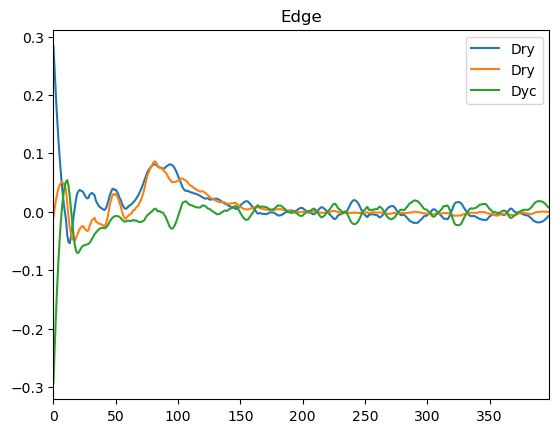

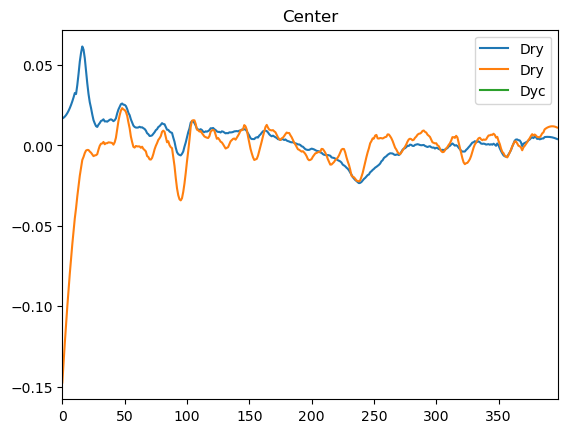

Pos 16
2023_12_08_Ti_pLPT107&pLPT41


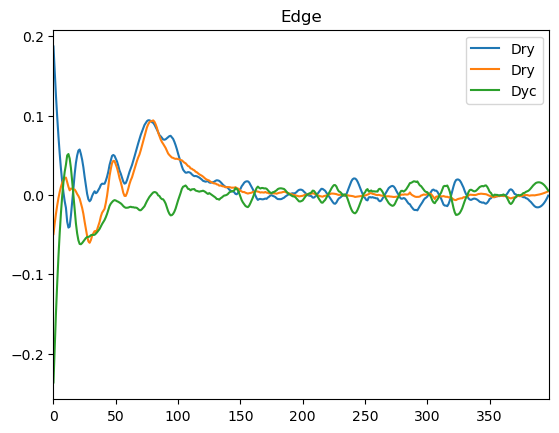

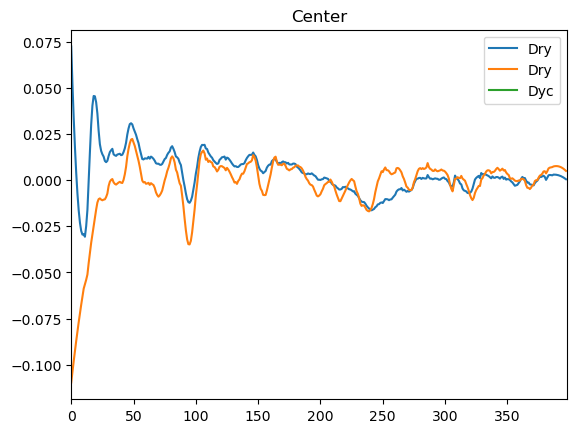

Pos 17
2023_12_08_Ti_pLPT107&pLPT41


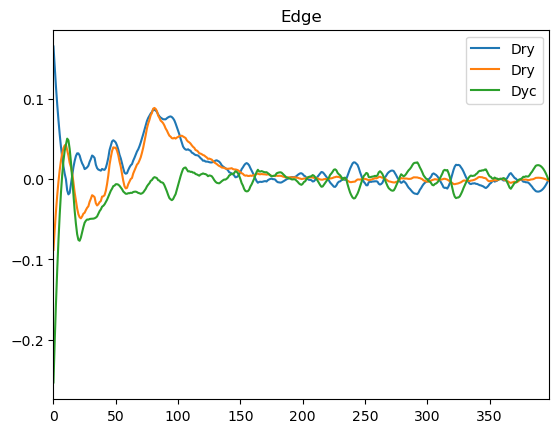

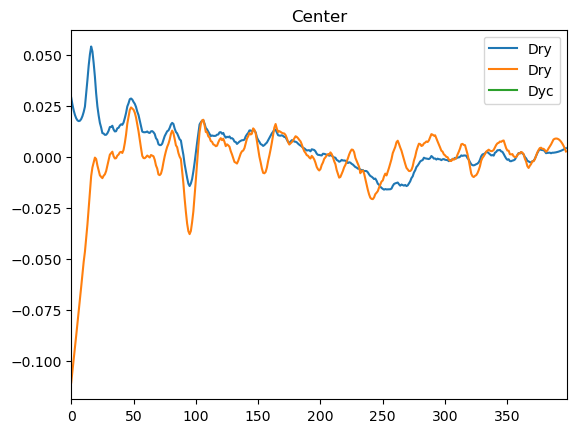

Pos 19
2023_12_08_Ti_pLPT107&pLPT41


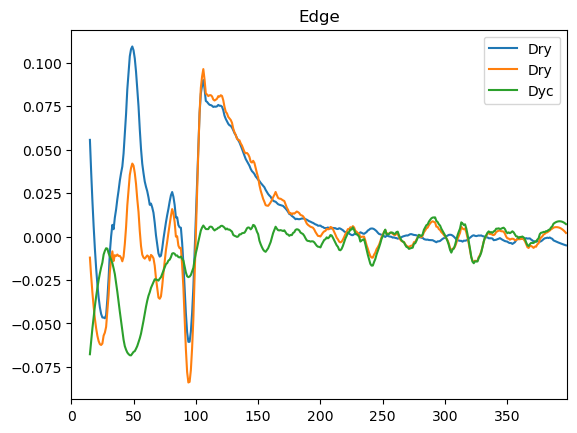

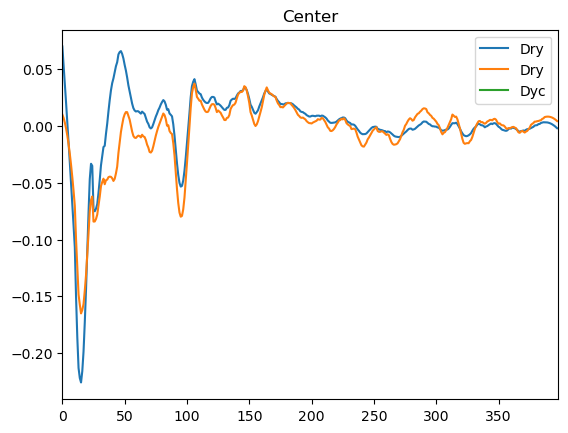

Pos 21
2023_12_08_Ti_pLPT107&pLPT41


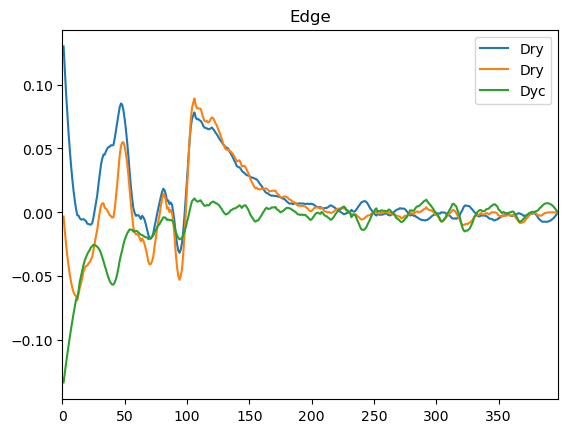

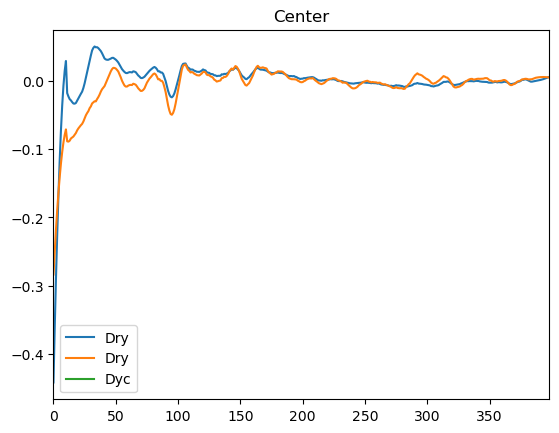

Pos 23
2023_12_08_Ti_pLPT107&pLPT41


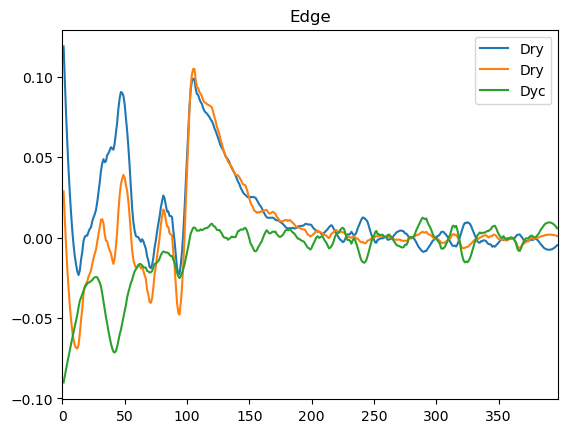

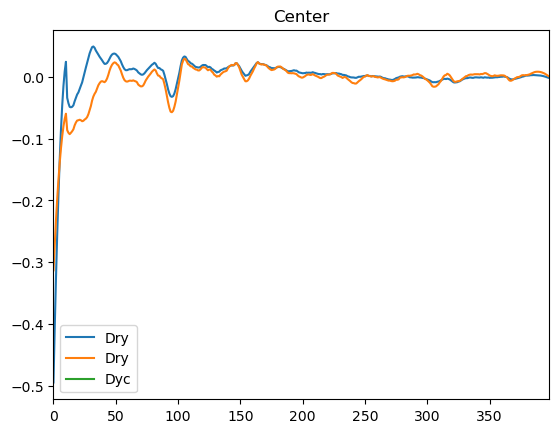

Pos 24
2023_12_08_Ti_pLPT107&pLPT41


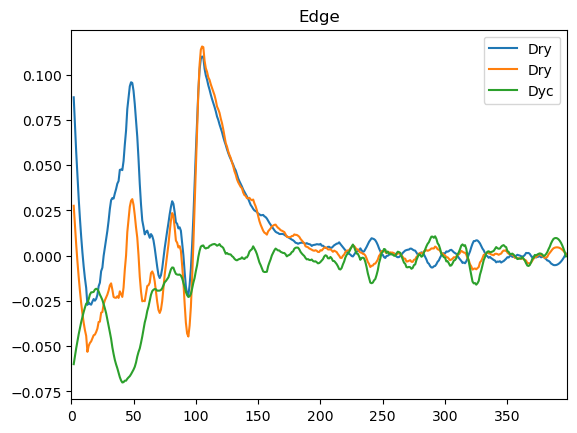

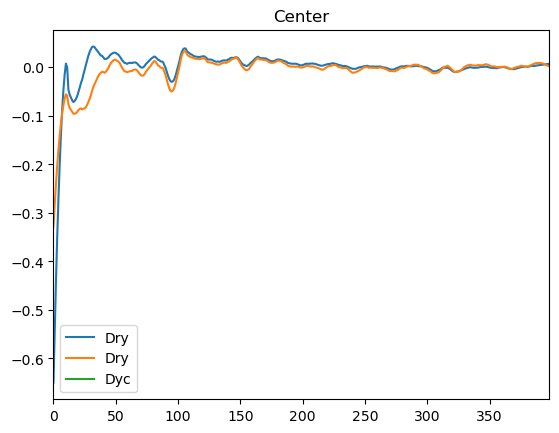

Pos 25
2023_12_08_Ti_pLPT107&pLPT41


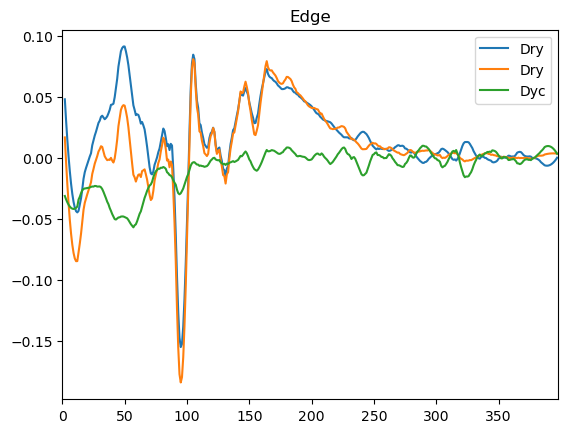

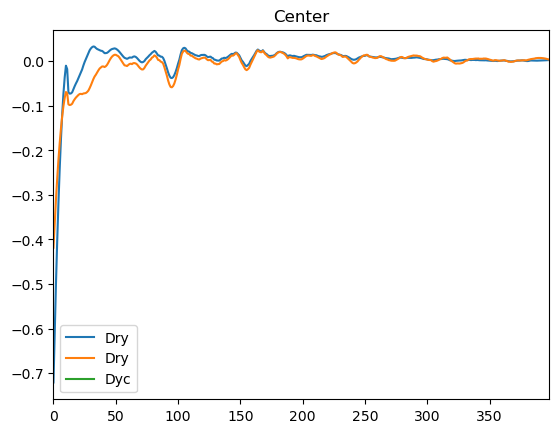

Pos 28
2023_12_08_Ti_pLPT107&pLPT41


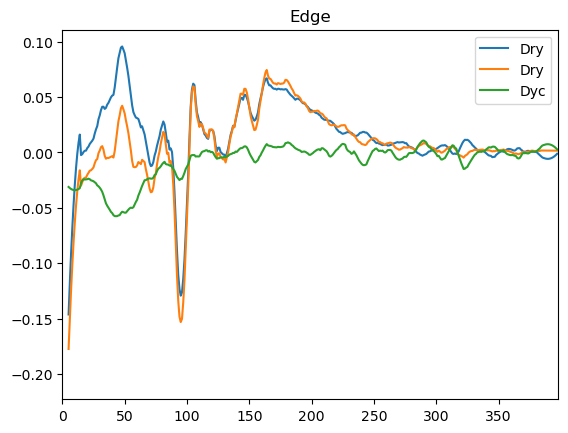

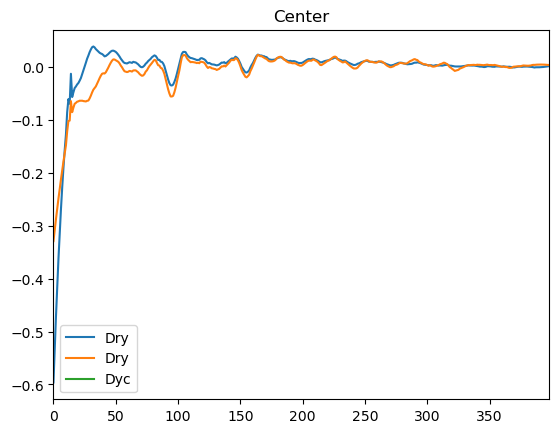

Pos 30
2023_12_08_Ti_pLPT107&pLPT41


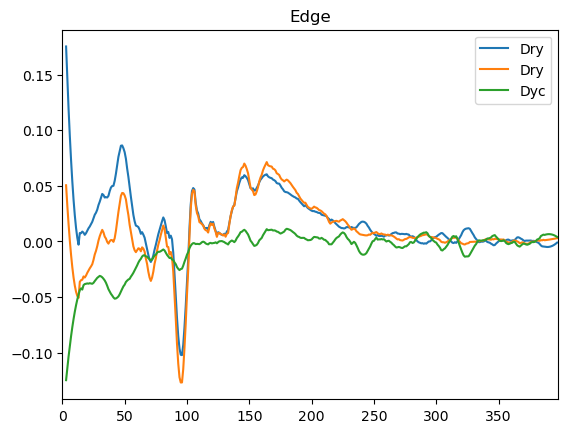

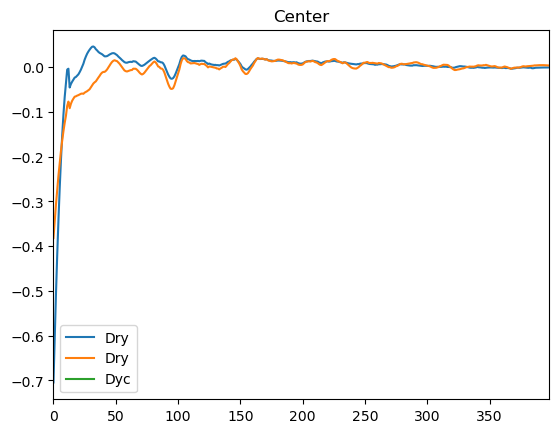

Pos 31
2023_12_08_Ti_pLPT107&pLPT41


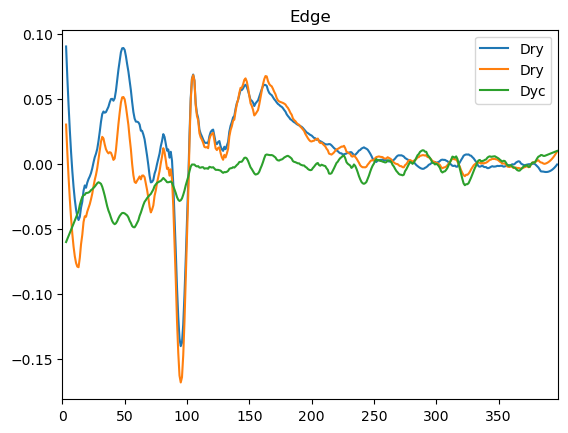

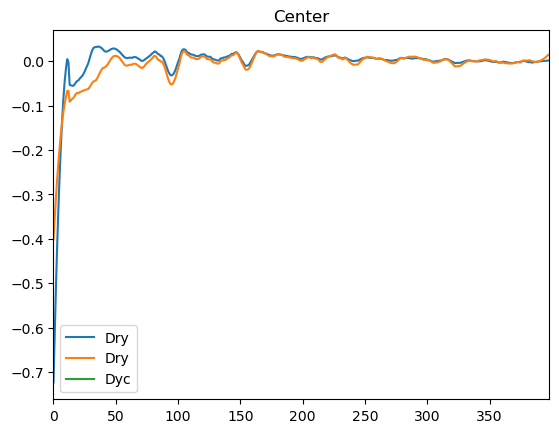

Pos 32
2023_12_08_Ti_pLPT107&pLPT41


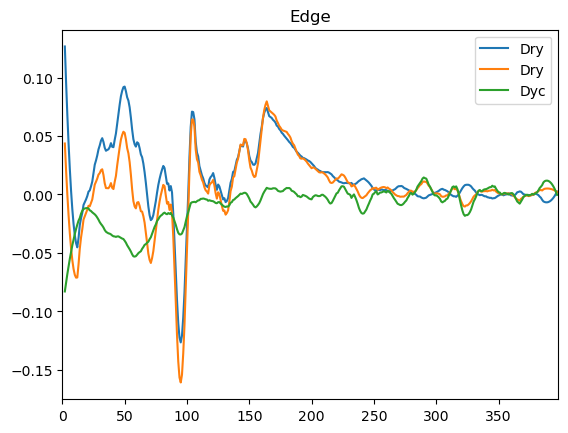

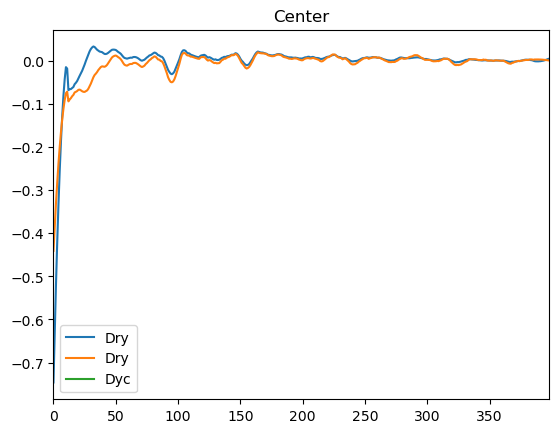

Pos 34
2023_12_08_Ti_pLPT107&pLPT41


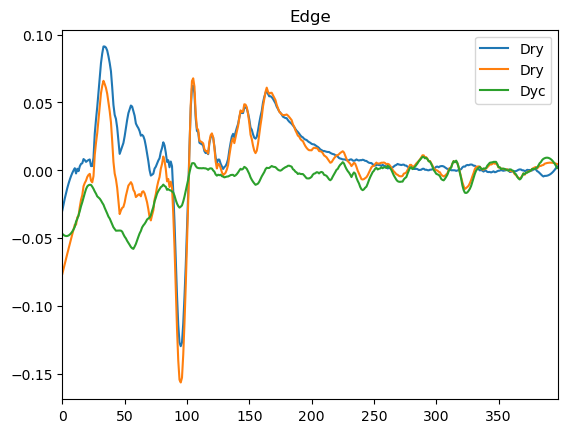

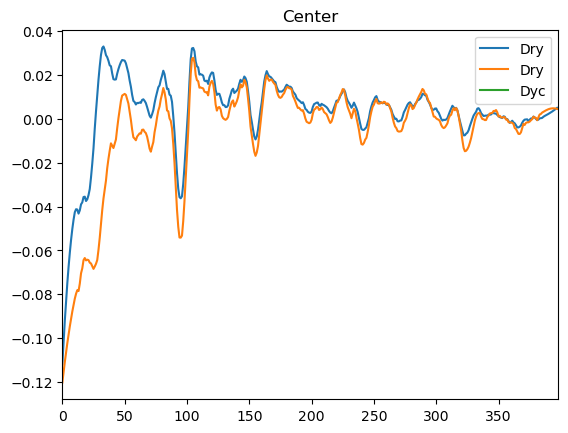

Pos 35
2023_12_08_Ti_pLPT107&pLPT41


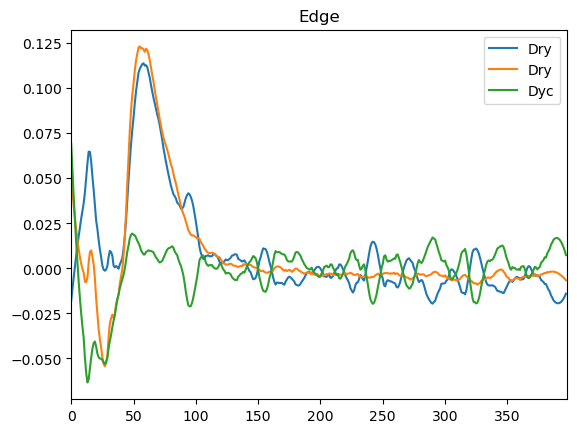

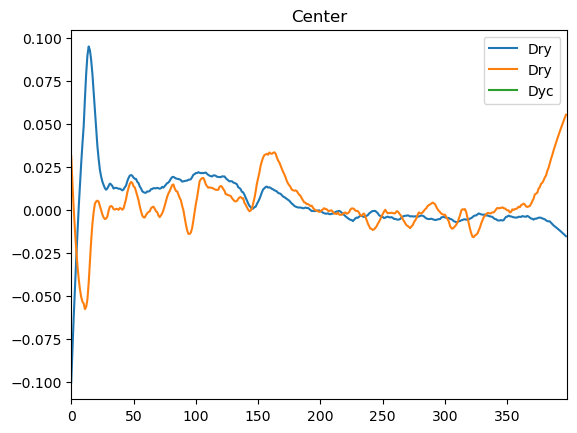

Pos 0
2023_12_08_TiTweez_pLPT20&pLPT41


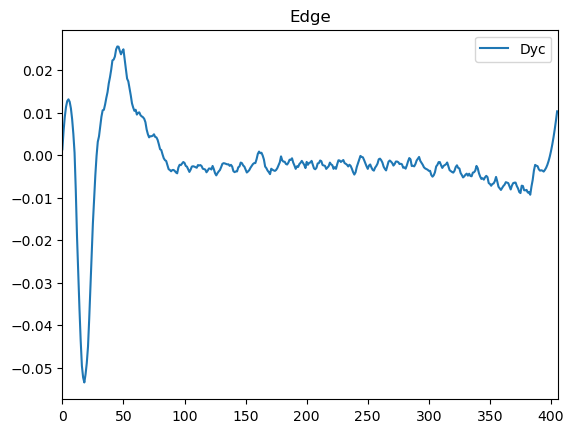

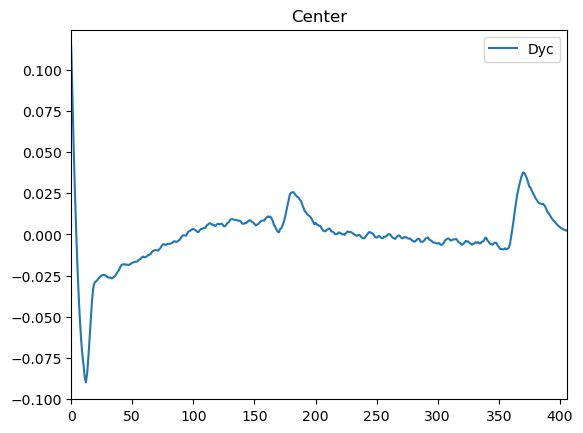

Pos 1
2023_12_08_TiTweez_pLPT20&pLPT41


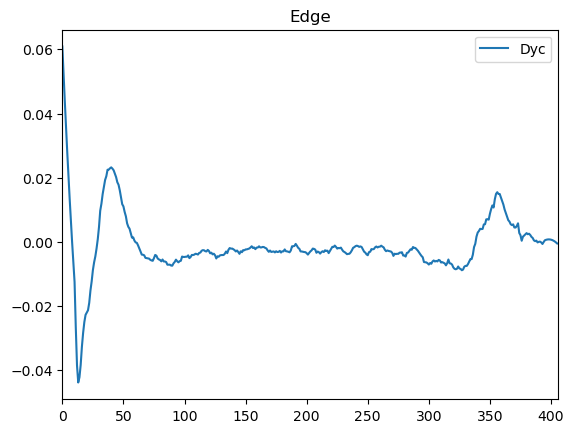

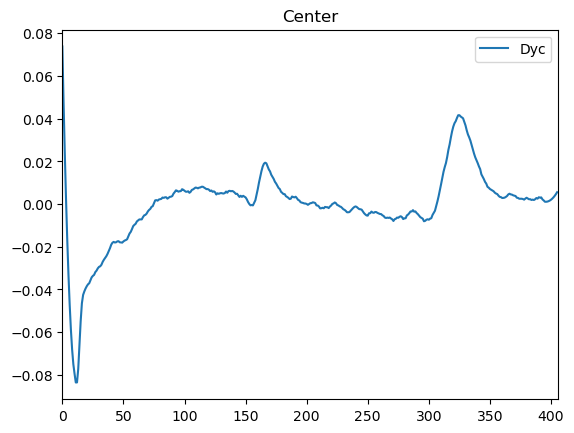

Pos 2
2023_12_08_TiTweez_pLPT20&pLPT41


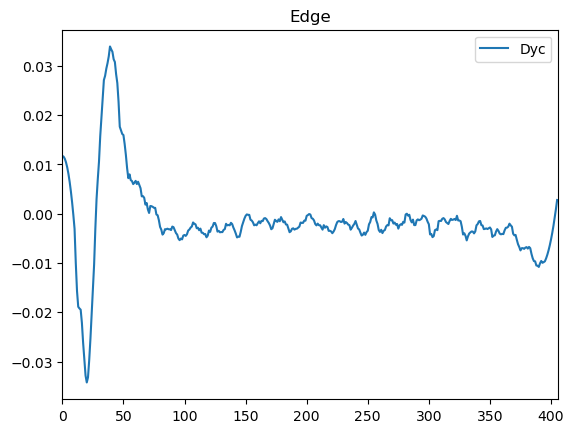

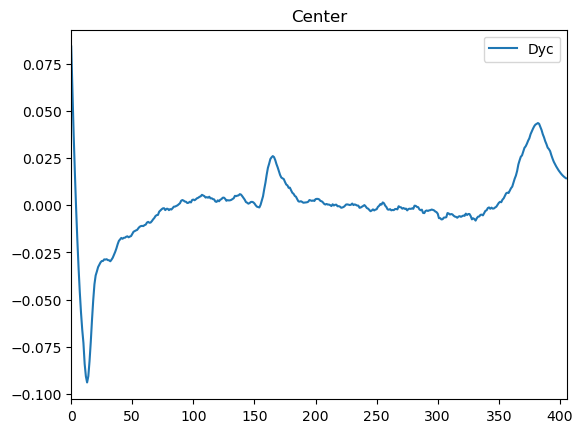

Pos 4
2023_12_08_TiTweez_pLPT20&pLPT41


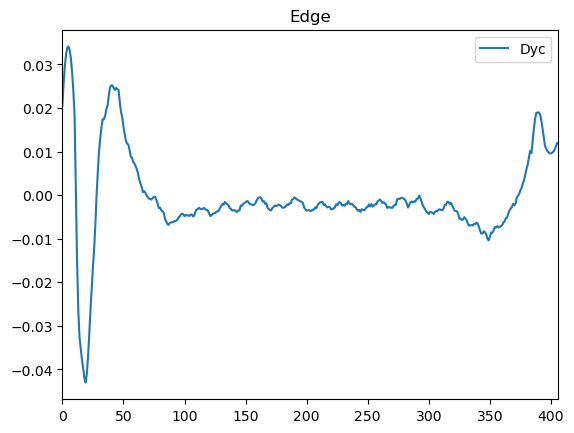

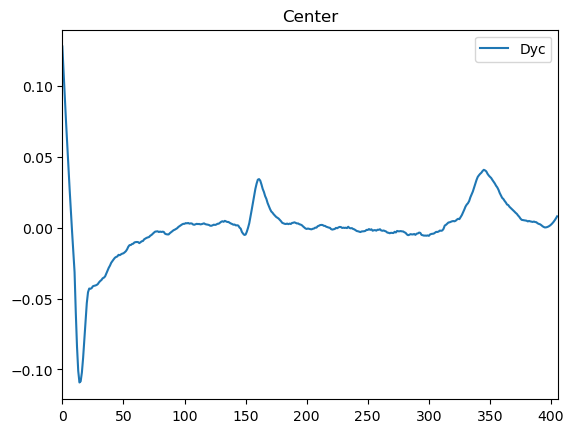

Pos 6
2023_12_08_TiTweez_pLPT20&pLPT41


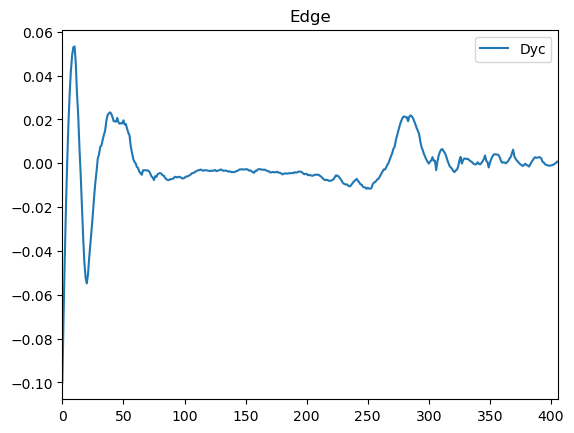

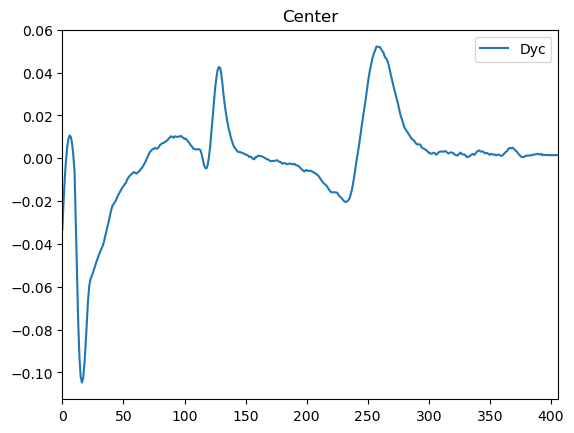

Pos 7
2023_12_08_TiTweez_pLPT20&pLPT41


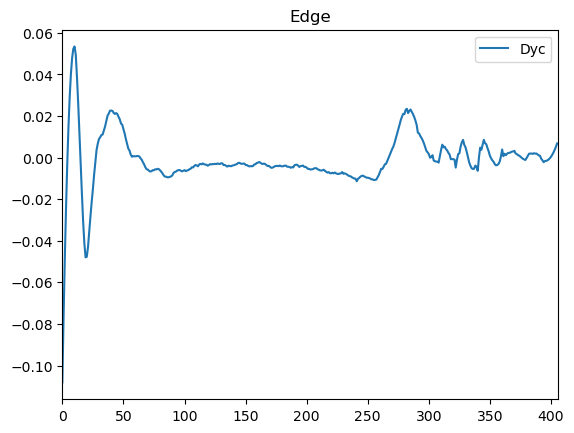

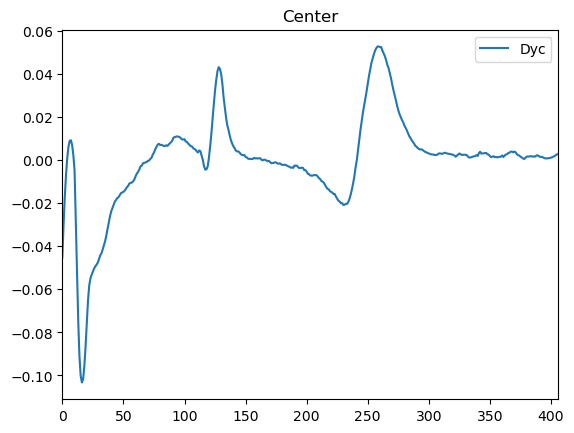

Pos 11
2023_12_08_TiTweez_pLPT20&pLPT41


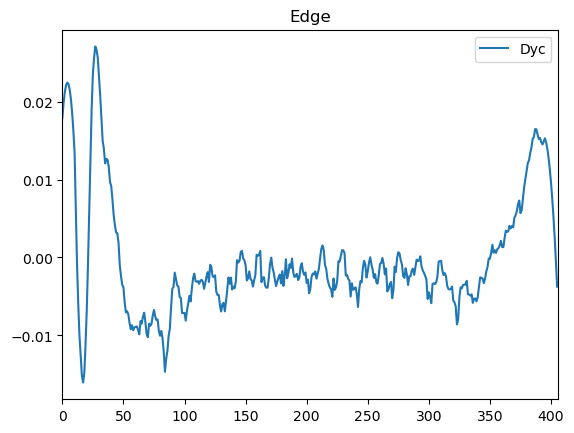

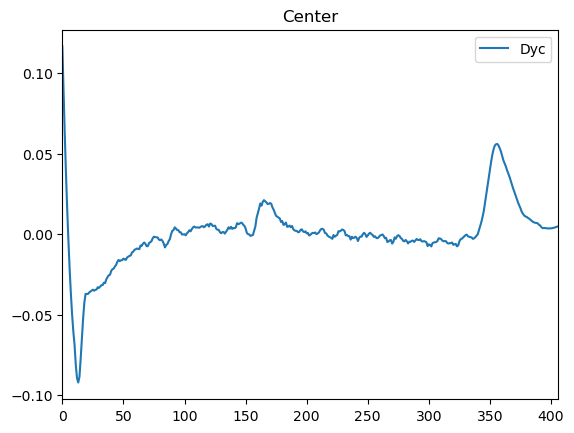

Pos 12
2023_12_08_TiTweez_pLPT20&pLPT41


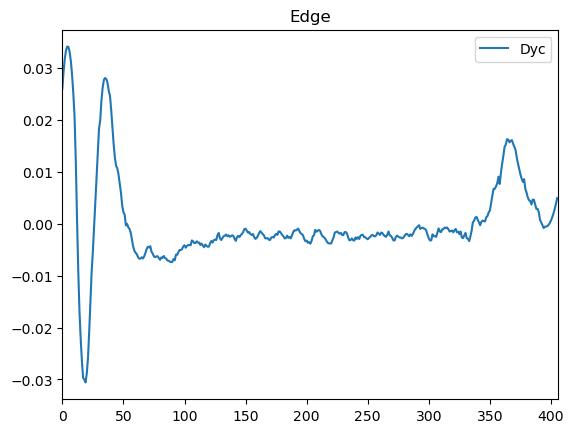

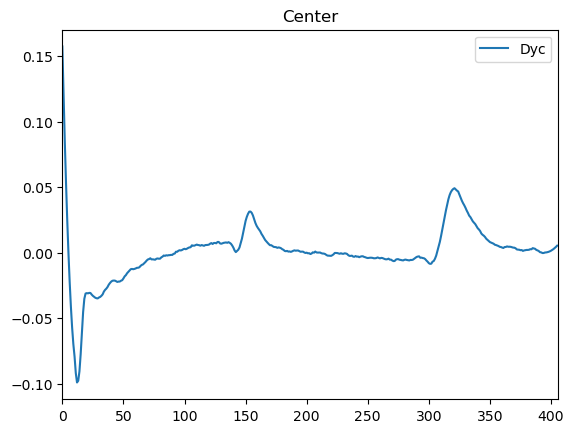

Pos 13
2023_12_08_TiTweez_pLPT20&pLPT41


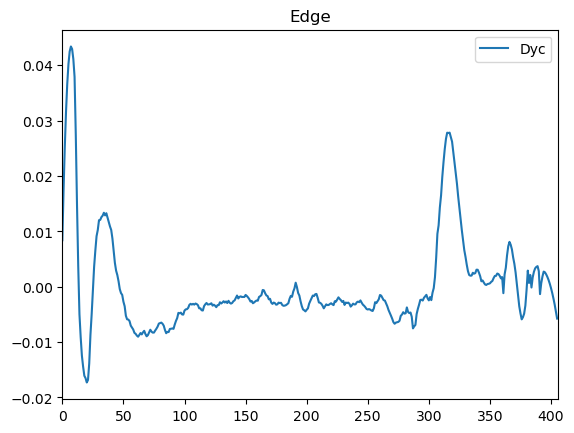

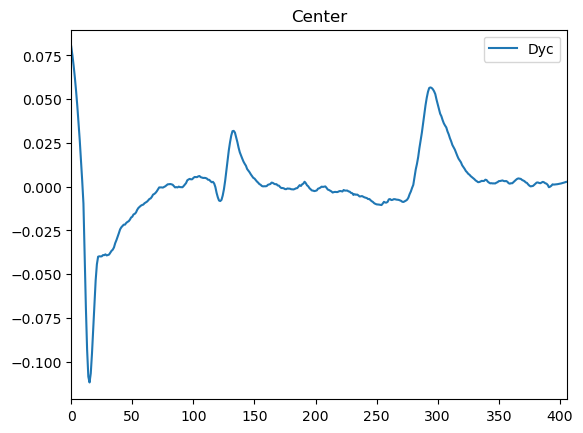

Pos 17
2023_12_08_TiTweez_pLPT20&pLPT41


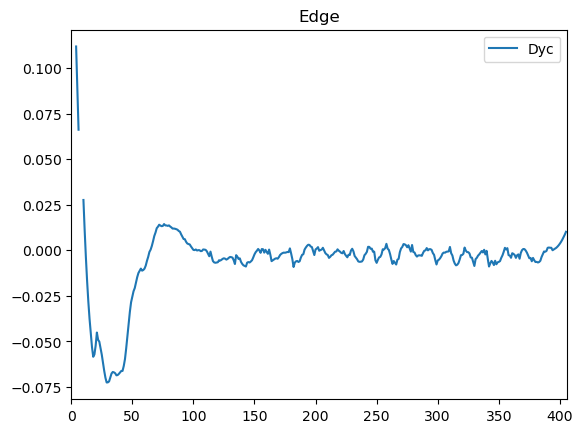

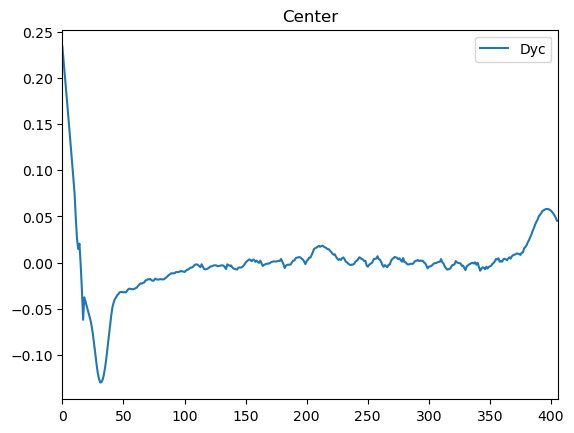

Pos 18
2023_12_08_TiTweez_pLPT20&pLPT41


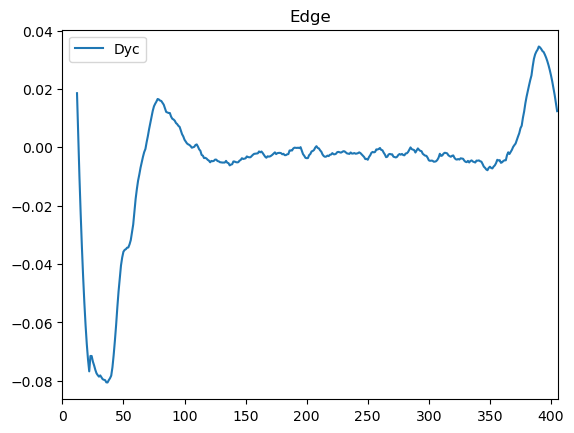

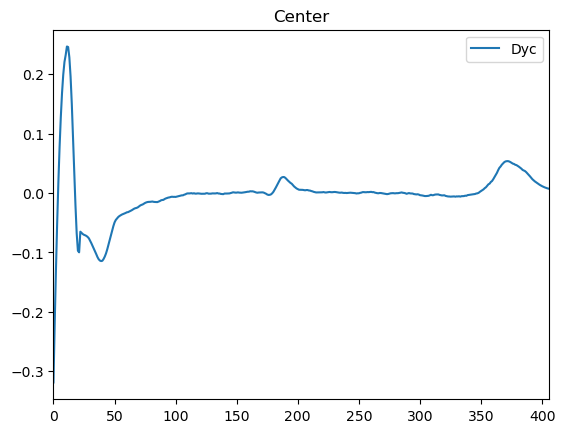

Pos 19
2023_12_08_TiTweez_pLPT20&pLPT41


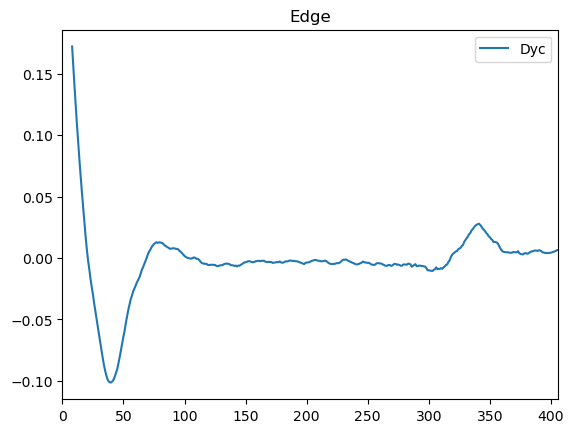

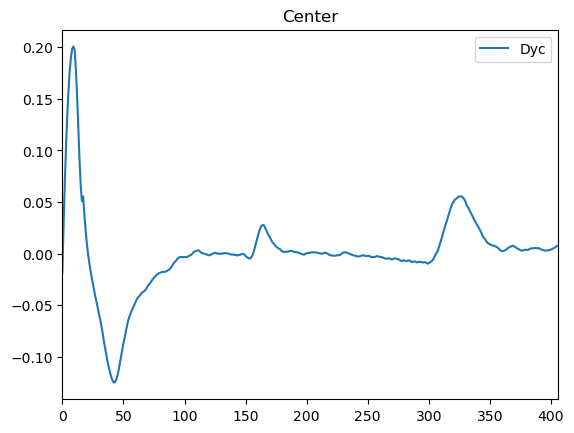

Pos 21
2023_12_08_TiTweez_pLPT20&pLPT41


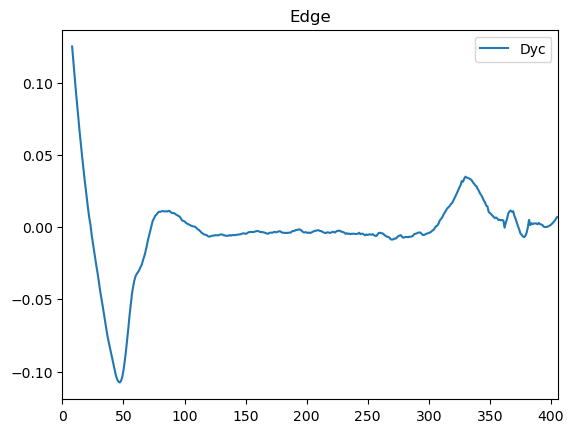

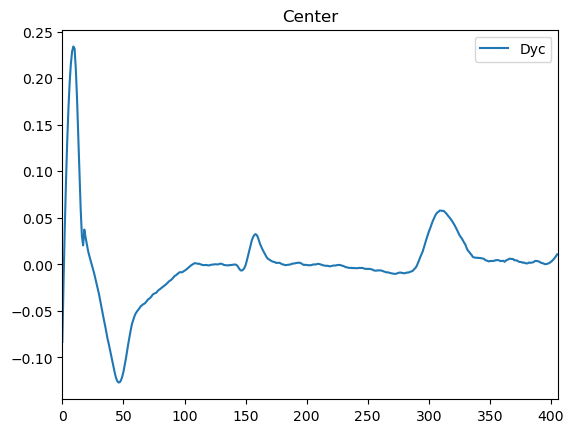

Pos 23
2023_12_08_TiTweez_pLPT20&pLPT41


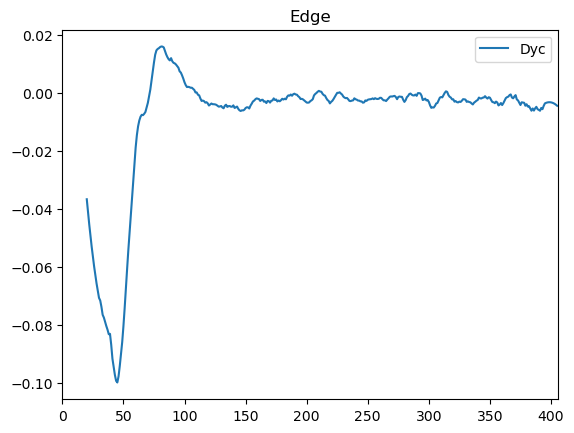

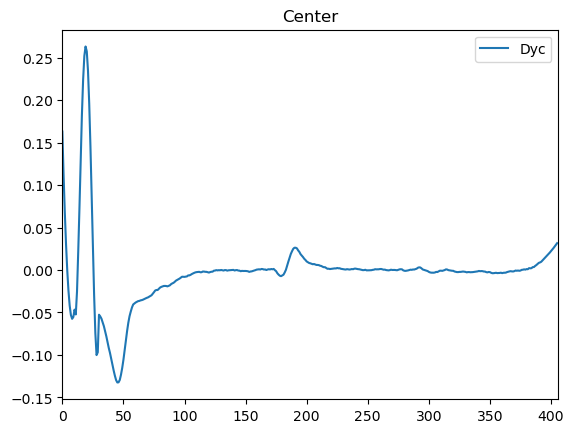

Pos 24
2023_12_08_TiTweez_pLPT20&pLPT41


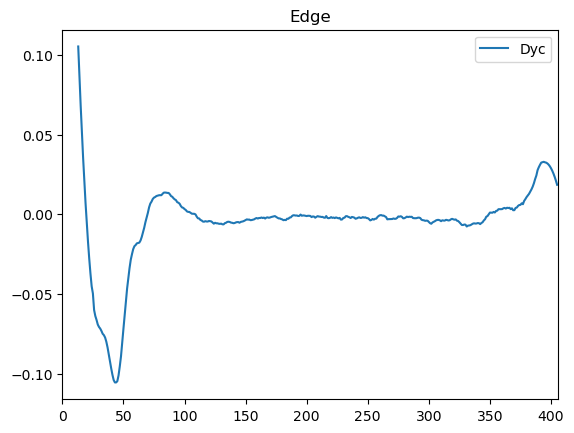

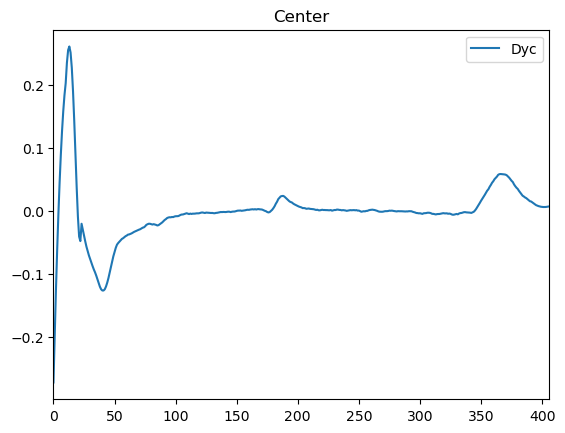

Pos 29
2023_12_08_TiTweez_pLPT20&pLPT41


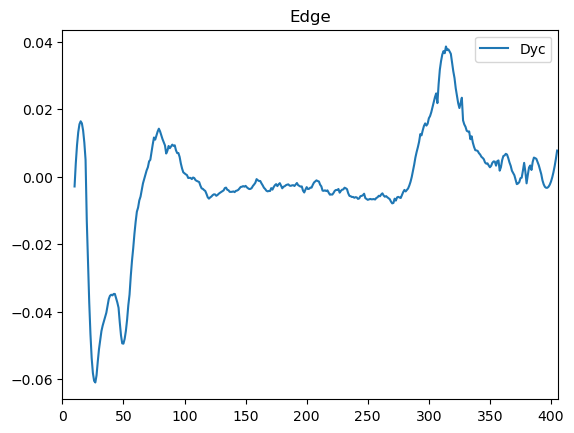

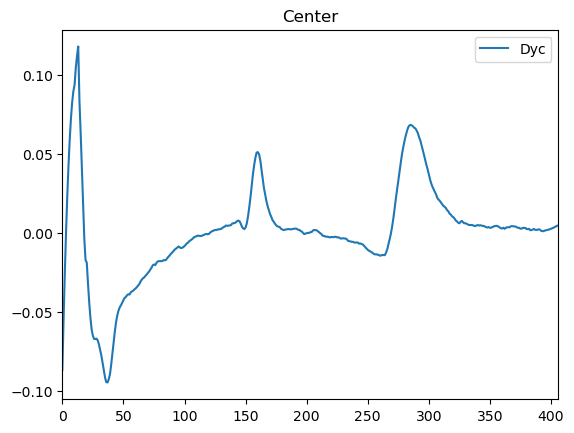

Pos 30
2023_12_08_TiTweez_pLPT20&pLPT41


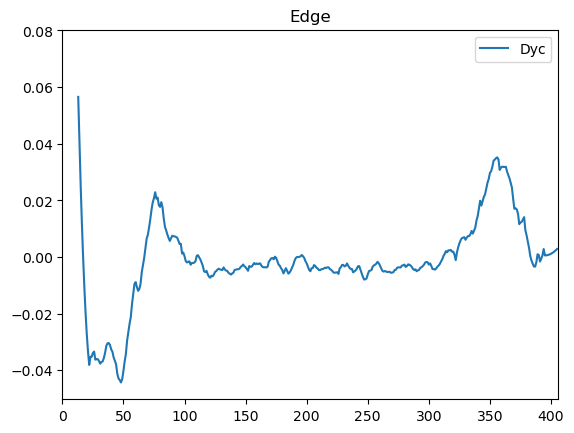

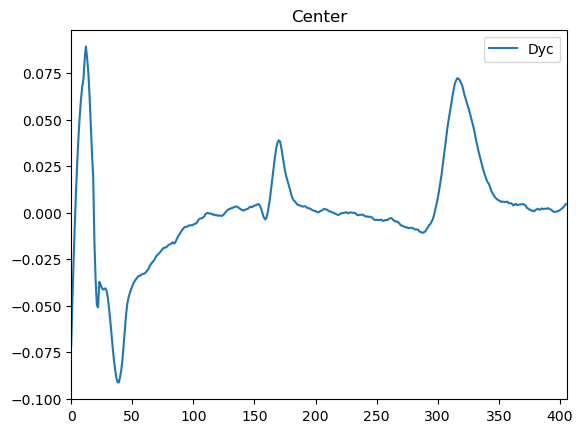

Pos 31
2023_12_08_TiTweez_pLPT20&pLPT41


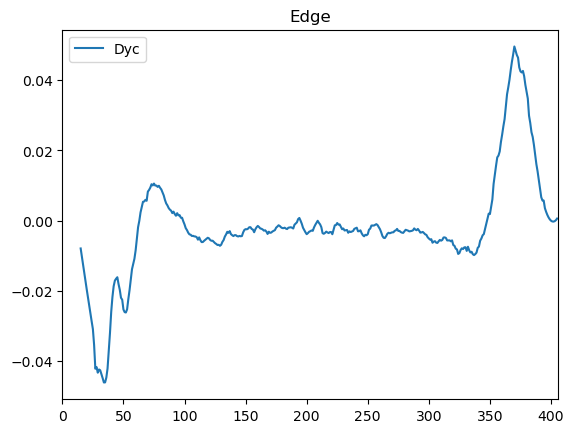

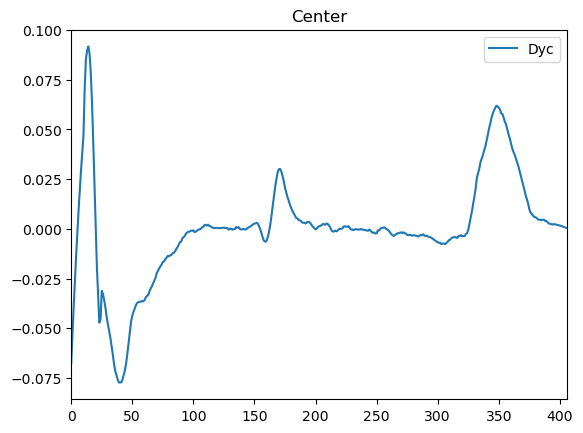

Pos 32
2023_12_08_TiTweez_pLPT20&pLPT41


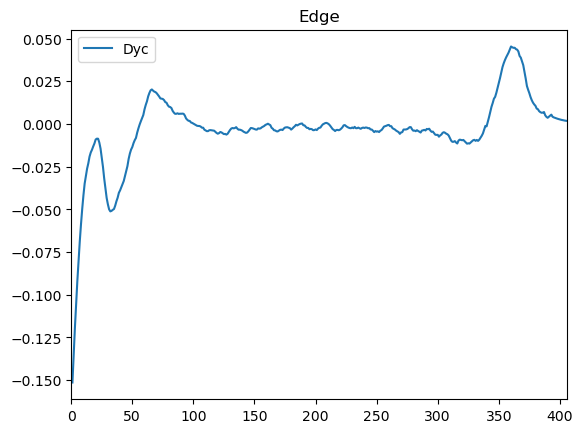

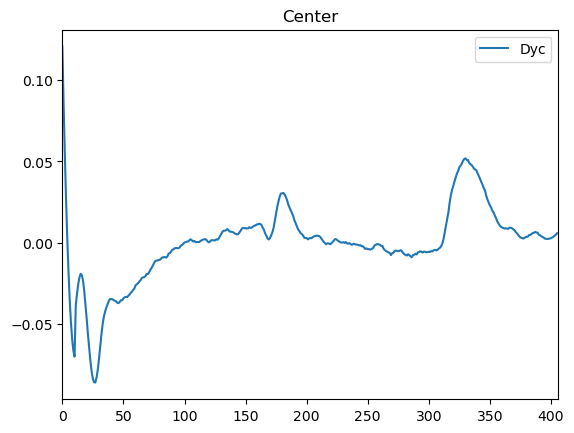

Pos 34
2023_12_08_TiTweez_pLPT20&pLPT41


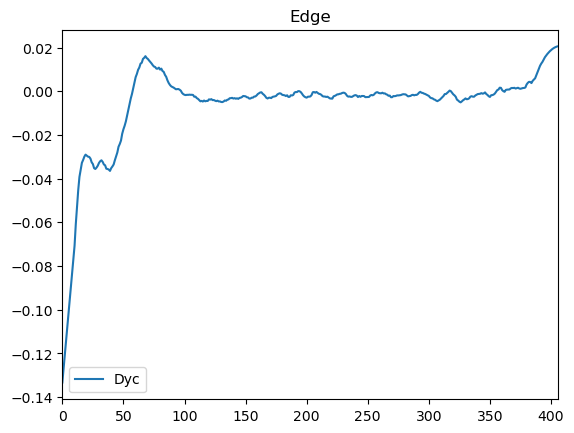

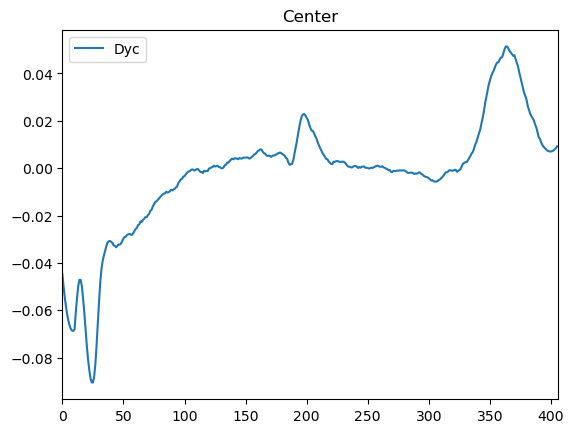

Pos 35
2023_12_08_TiTweez_pLPT20&pLPT41


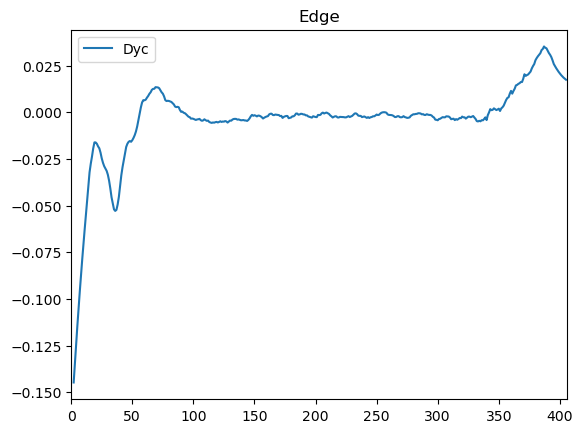

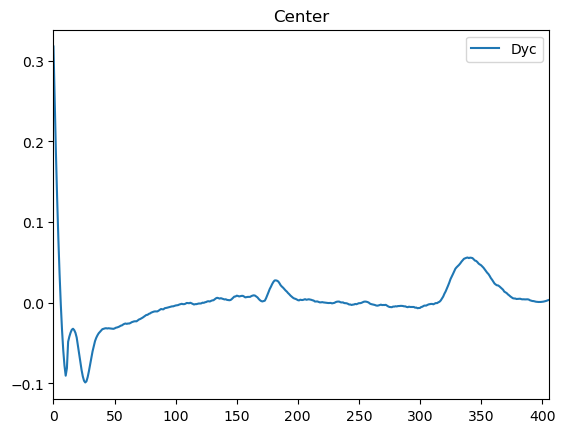

Pos 36
2023_12_08_TiTweez_pLPT20&pLPT41


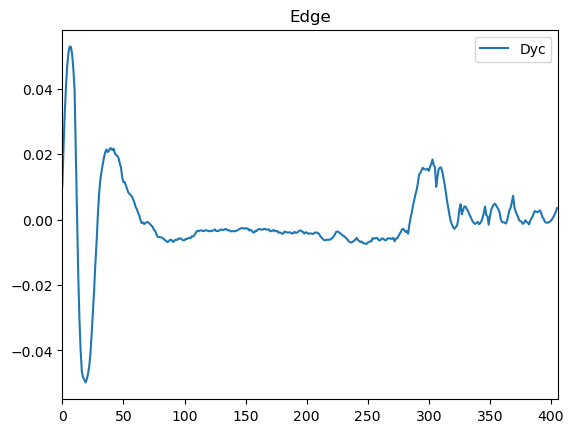

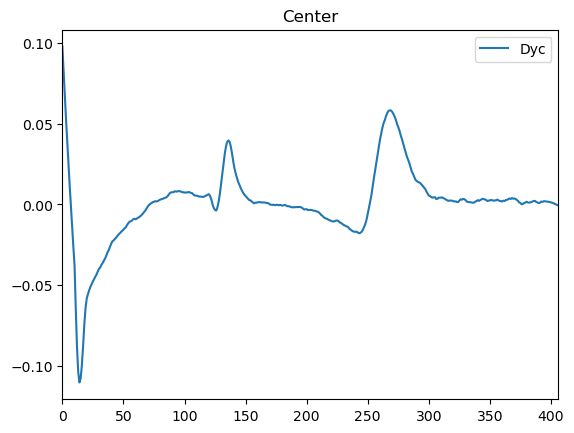

Pos 37
2023_12_08_TiTweez_pLPT20&pLPT41


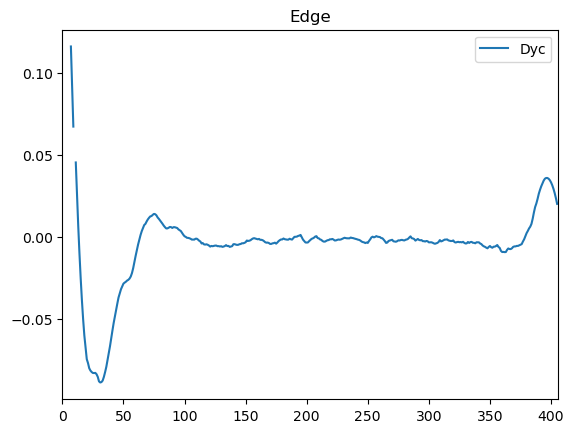

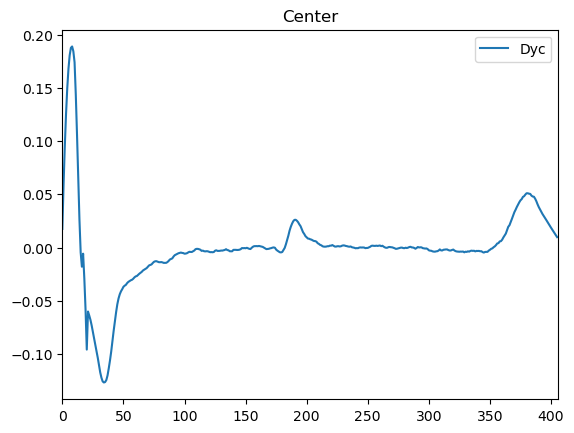

Pos 38
2023_12_08_TiTweez_pLPT20&pLPT41


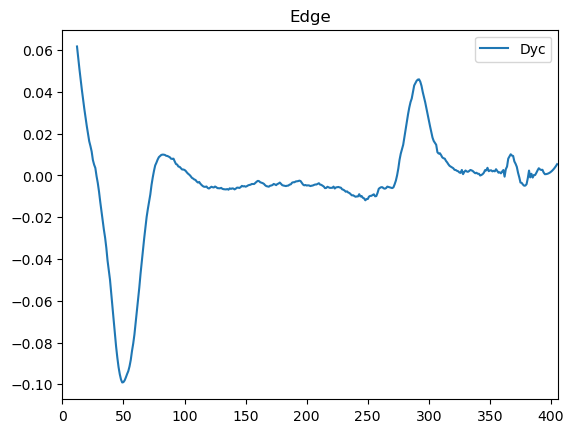

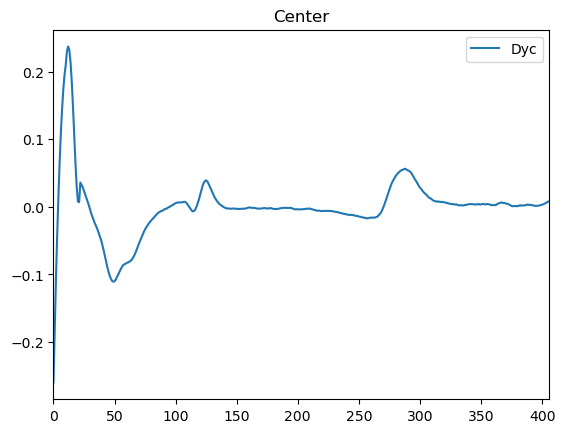

In [19]:
for i in exp_sum.index.values:
    exp_date = exp_sum.loc[i,'formatted_dates']
    vector = exp_sum.loc[i,'DNA']
    scope_name = exp_sum.loc[i,'Machine']
    df_pos = positions[(positions.Date == exp_sum.loc[i, 'Date']) & 
        (positions.DNA == vector) & 
        (positions.Machine == scope_name) & 
        (positions.Quality == 'Very good')]
    poss = df_pos.Position.unique()

    if vector == 'pLPT20&pLPT41' or vector == 'pLPT119&pLPT41':
        yfp_chn = 0
        cfp_chn = 1
        ph_chn = 2
        fluo_chns = 2
    else:
        rfp_chn = 0
        yfp_chn = 1
        cfp_chn = 2
        ph_chn = 3
        fluo_chns = 3
    for pos in poss:
        print(f"Pos {pos}")
        print(f"{exp_date}_{scopes[scope_name]}_{vector}")
        path_scope = os.path.join(path_ext, scope_name)
        path = os.path.join(path_scope, exp_date)
        path_results = os.path.join(path, folder_results, f"pos{pos}")
        cdlrho = np.load(os.path.join(path_results, 'cdlrho.npy'))
        edlrho = np.load(os.path.join(path_results, 'edlrho.npy'))
        nt, _ = cdlrho.shape

        if fluo_chns == 3:
            plt.plot(edlrho[:,0], label='Dry')
            plt.plot(edlrho[:,1], label='Dry')
            plt.plot(edlrho[:,2], label='Dyc')
            plt.title('Edge')
            plt.xlim([0,nt])
            plt.legend()
            plt.show()
            
            plt.plot(cdlrho[:,0], label='Dry')
            plt.plot(cdlrho[:,1], label='Dry')
            plt.plot(cdlrho[:,2], label='Dyc')
            plt.title('Center')
            plt.xlim([0,nt])
            plt.legend()
            plt.show()
        if fluo_chns == 2:
            plt.plot(edlrho[:,0], label='Dyc')
            plt.title('Edge')
            plt.xlim([0,nt])
            plt.legend()
            plt.show()
            
            plt.plot(cdlrho[:,0], label='Dyc')
            plt.title('Center')
            plt.xlim([0,nt])
            plt.legend()
            plt.show()

In [20]:
exp_sum

,Date,Machine,Strain,DNA,Chemical,Dilution,formatted_dates
0,2023-11-15,Ti scope,MC4100 & DHL708,pLPT20&pLPT41,-,10^(-5),2023_11_15
1,2023-11-15,Tweez scope,MC4100 & DHL708,pLPT20&pLPT41,-,10^(-6),2023_11_15
2,2023-11-17,Ti scope,DHL708,pLPT119&pLPT41,-,10^(-5),2023_11_17
3,2023-11-17,Tweez scope,MC4100 & DHL708,pLPT119&pLPT41,-,10^(-6),2023_11_17
4,2023-11-28,Ti scope,MC4100 & MG1655,pAAA,-,10^(-6),2023_11_28
5,2023-11-28,Tweez scope,MG1655,pAAA,-,10^(-5),2023_11_28
6,2023-11-30,Ti scope,MC4100,pAAA,-,10^(-6),2023_11_30
7,2023-11-30,Tweez scope,MC4100,pAAA,-,10^(-5),2023_11_30
8,2023-12-04,Ti scope,MC4100,pLPT107&pLPT41,IPTG,10^(-6),2023_12_04
9,2023-12-04,Tweez scope,MC4100,pLPT107&pLPT41,IPTG,10^(-5),2023_12_04


In [8]:
df = pd.read_excel('../Notebooks/data_processed.xlsx')

In [9]:
df.columns

Index(['Date', 'Machine', 'Position', 'Strain', 'DNA', 'Chemical', 'Pad',
       'Dilution', 't_incub', 't_im', 'Quality', 'exp length', 'Colonies',
       'Centers', 'Radius', 'radj', 'radius', 'area', 'gomp_params',
       'logistic_params', 't_m_gomp', 't_m_logistic', 'r0', 'vel_start',
       'vel_stop', 'vel_fit_start', 'vel_fit_stop', 'mu0', 'ws_params',
       'area_max', 'area_max_um', 'time_wave_start_guess',
       'time_wave_arrival_guess'],
      dtype='object')

In [26]:
exp_date = '2023_12_08'
vector = 'pLPT20&pLPT41'
scope_name = 'Tweez scope'
exp_sum = pd.read_excel('../Notebooks/Exps_summary.xlsx')
exp_sum['formatted_dates'] = exp_sum['Date'].dt.strftime('%Y_%m_%d')
positions = pd.read_excel('../Notebooks/Positions.xlsx')
i = exp_sum[(exp_sum.formatted_dates == exp_date) & (exp_sum.Machine == scope_name)].index[0]

In [27]:
i

12

In [28]:
#for i in exp_sum.index.values:
#exp_date = exp_sum.loc[i,'formatted_dates']
#vector = exp_sum.loc[i,'DNA']
#scope_name = exp_sum.loc[i,'Machine']
df_pos = positions[(positions.Date == exp_sum.loc[i, 'Date']) & 
    (positions.DNA == vector) & 
    (positions.Machine == scope_name) & 
    (positions.Quality == 'Very good')]
poss = df_pos.Position.unique()
poss

array([ 0,  1,  2,  4,  6,  7, 11, 12, 13, 17, 18, 19, 21, 23, 24, 29, 30,
       31, 32, 34, 35, 36, 37, 38])

In [29]:
if vector == 'pLPT20&pLPT41' or vector == 'pLPT119&pLPT41':
    yfp_chn = 0
    cfp_chn = 1
    ph_chn = 2
    fluo_chns = 2
else:
    rfp_chn = 0
    yfp_chn = 1
    cfp_chn = 2
    ph_chn = 3
    fluo_chns = 3

Pos 0
2023_12_08_TiTweez_pLPT20&pLPT41


<Figure size 400x300 with 0 Axes>

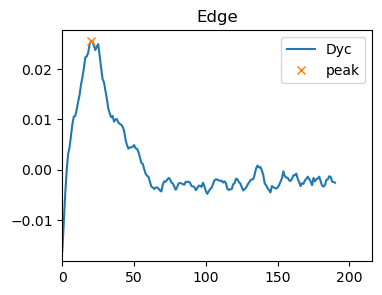

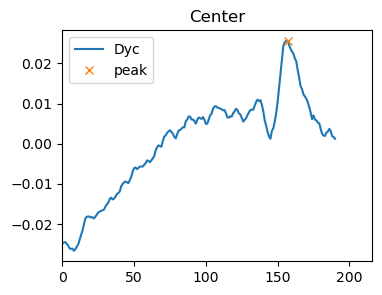

Time start: 45*10+incubtime
Time arrival: 182*10+incubtime
data_idx: 136
45 182
Pos 1
2023_12_08_TiTweez_pLPT20&pLPT41


<Figure size 400x300 with 0 Axes>

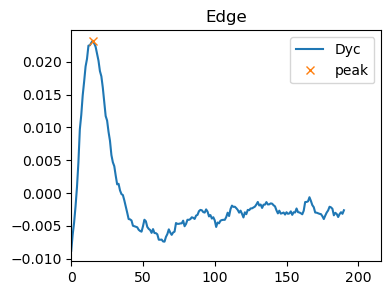

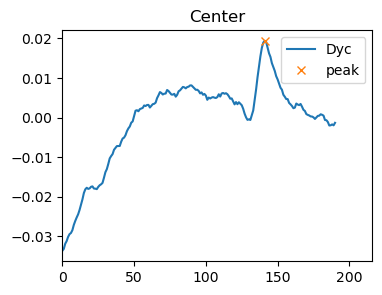

Time start: 40*10+incubtime
Time arrival: 166*10+incubtime
data_idx: 137
40 166
Pos 2
2023_12_08_TiTweez_pLPT20&pLPT41


<Figure size 400x300 with 0 Axes>

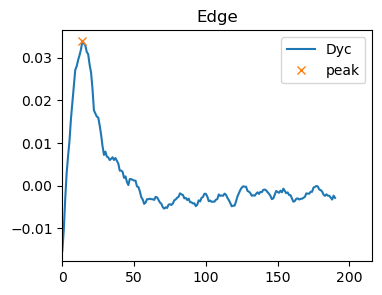

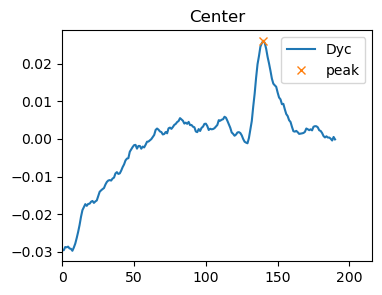

Time start: 39*10+incubtime
Time arrival: 165*10+incubtime
data_idx: 138
39 165
Pos 4
2023_12_08_TiTweez_pLPT20&pLPT41


<Figure size 400x300 with 0 Axes>

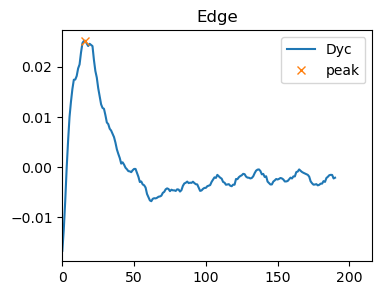

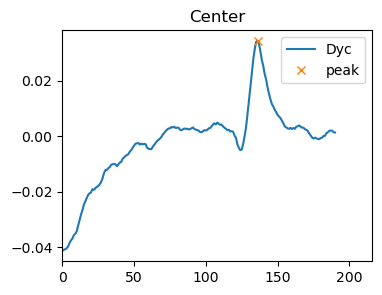

Time start: 41*10+incubtime
Time arrival: 161*10+incubtime
data_idx: 139
41 161
Pos 6
2023_12_08_TiTweez_pLPT20&pLPT41


<Figure size 400x300 with 0 Axes>

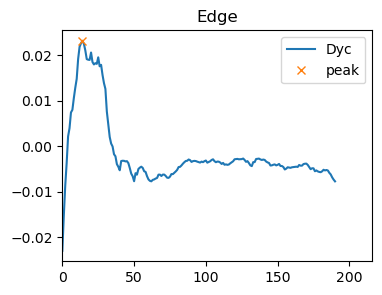

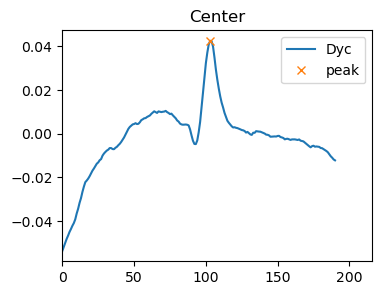

Time start: 39*10+incubtime
Time arrival: 128*10+incubtime
data_idx: 140
39 128
Pos 7
2023_12_08_TiTweez_pLPT20&pLPT41


<Figure size 400x300 with 0 Axes>

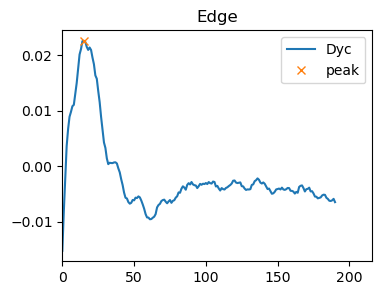

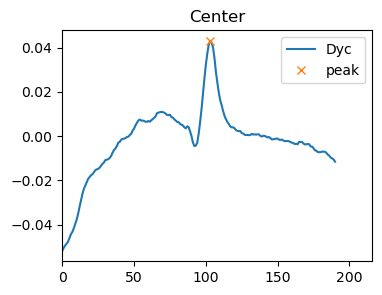

Time start: 40*10+incubtime
Time arrival: 128*10+incubtime
data_idx: 141
40 128
Pos 11
2023_12_08_TiTweez_pLPT20&pLPT41


<Figure size 400x300 with 0 Axes>

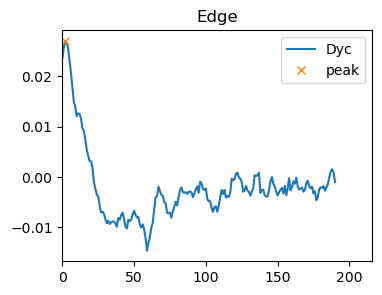

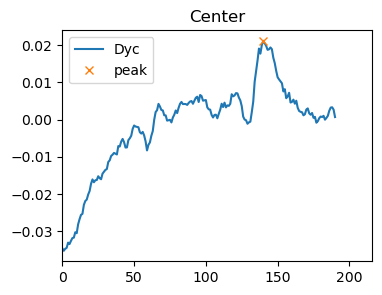

Time start: 27*10+incubtime
Time arrival: 165*10+incubtime
data_idx: 142
27 165
Pos 12
2023_12_08_TiTweez_pLPT20&pLPT41


<Figure size 400x300 with 0 Axes>

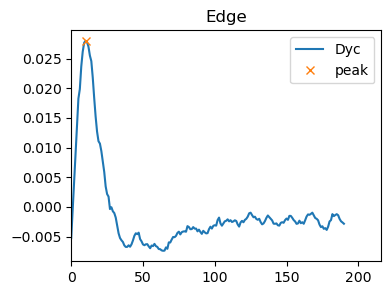

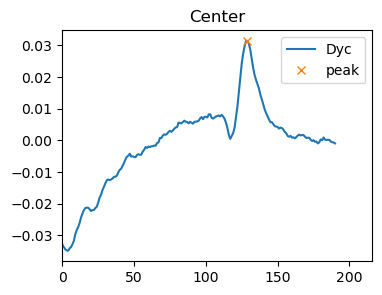

Time start: 35*10+incubtime
Time arrival: 154*10+incubtime
data_idx: 143
35 154
Pos 13
2023_12_08_TiTweez_pLPT20&pLPT41


<Figure size 400x300 with 0 Axes>

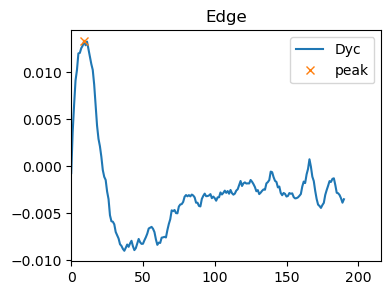

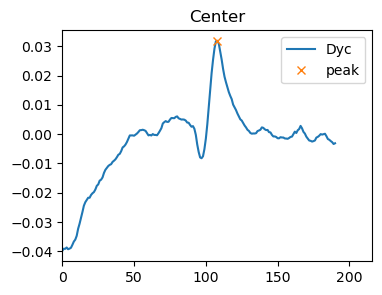

Time start: 34*10+incubtime
Time arrival: 133*10+incubtime
data_idx: 144
34 133
Pos 17
2023_12_08_TiTweez_pLPT20&pLPT41


<Figure size 400x300 with 0 Axes>

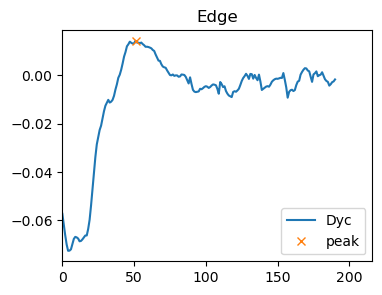

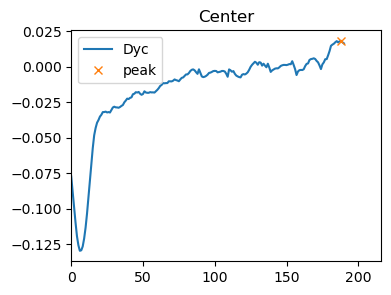

Time start: 76*10+incubtime
Time arrival: 213*10+incubtime
data_idx: 145
76 213
Pos 18
2023_12_08_TiTweez_pLPT20&pLPT41


<Figure size 400x300 with 0 Axes>

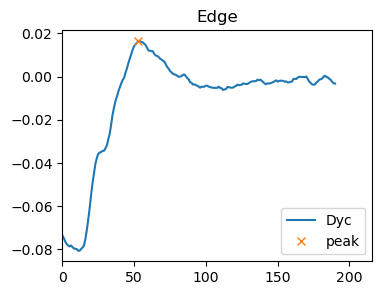

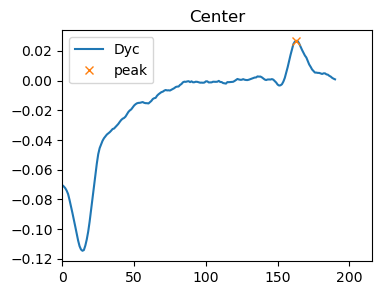

Time start: 78*10+incubtime
Time arrival: 188*10+incubtime
data_idx: 146
78 188
Pos 19
2023_12_08_TiTweez_pLPT20&pLPT41


<Figure size 400x300 with 0 Axes>

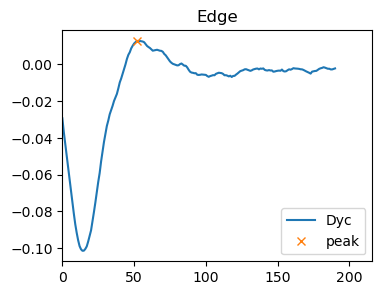

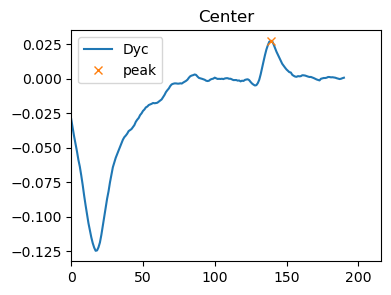

Time start: 77*10+incubtime
Time arrival: 164*10+incubtime
data_idx: 147
77 164
Pos 21
2023_12_08_TiTweez_pLPT20&pLPT41


<Figure size 400x300 with 0 Axes>

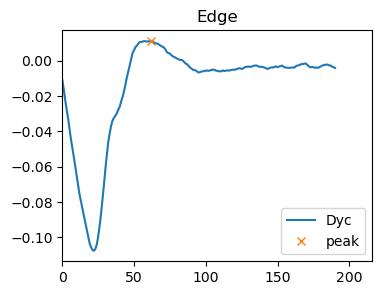

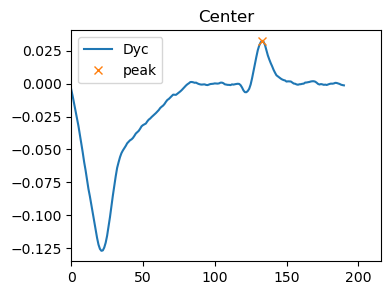

Time start: 87*10+incubtime
Time arrival: 158*10+incubtime
data_idx: 148
87 158
Pos 23
2023_12_08_TiTweez_pLPT20&pLPT41


<Figure size 400x300 with 0 Axes>

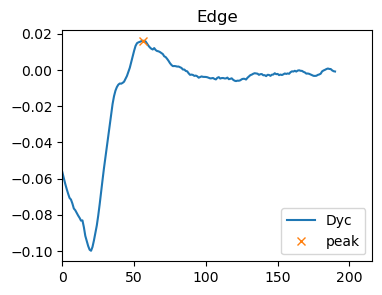

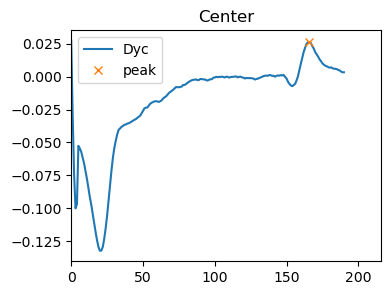

Time start: 81*10+incubtime
Time arrival: 191*10+incubtime
data_idx: 149
81 191
Pos 24
2023_12_08_TiTweez_pLPT20&pLPT41


<Figure size 400x300 with 0 Axes>

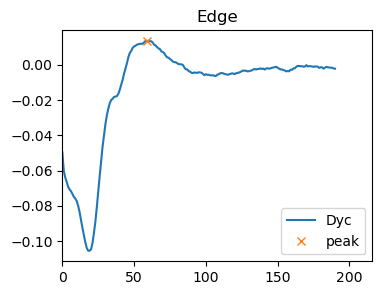

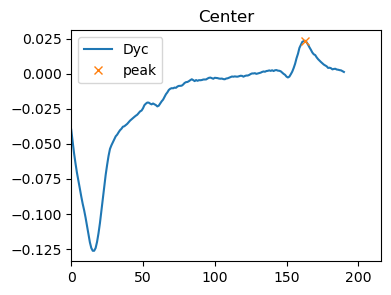

Time start: 84*10+incubtime
Time arrival: 188*10+incubtime
data_idx: 150
84 188
Pos 29
2023_12_08_TiTweez_pLPT20&pLPT41


<Figure size 400x300 with 0 Axes>

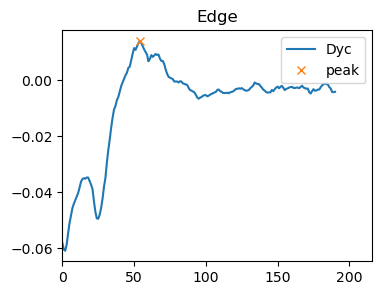

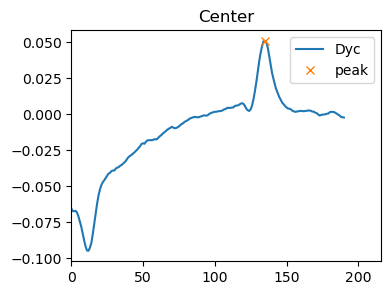

Time start: 79*10+incubtime
Time arrival: 160*10+incubtime
data_idx: 151
79 160
Pos 30
2023_12_08_TiTweez_pLPT20&pLPT41


<Figure size 400x300 with 0 Axes>

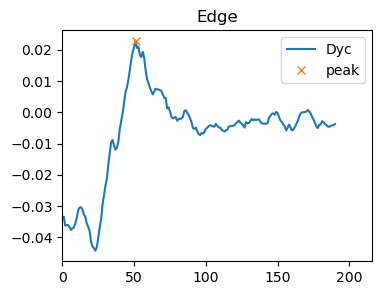

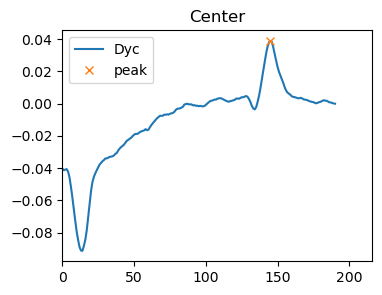

Time start: 76*10+incubtime
Time arrival: 170*10+incubtime
data_idx: 152
76 170
Pos 31
2023_12_08_TiTweez_pLPT20&pLPT41


<Figure size 400x300 with 0 Axes>

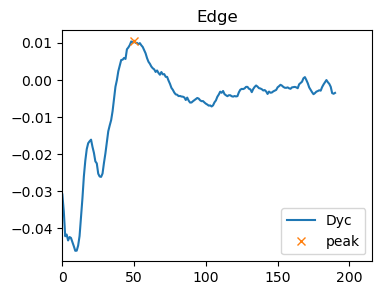

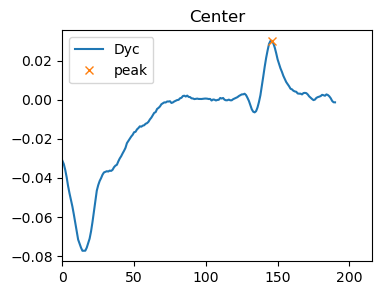

Time start: 75*10+incubtime
Time arrival: 171*10+incubtime
data_idx: 153
75 171
Pos 32
2023_12_08_TiTweez_pLPT20&pLPT41


<Figure size 400x300 with 0 Axes>

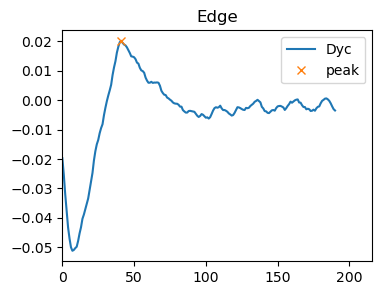

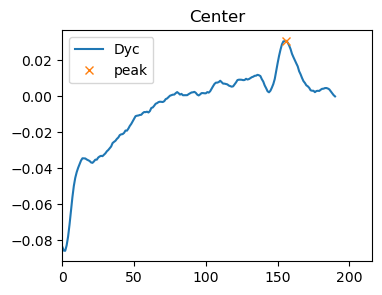

Time start: 66*10+incubtime
Time arrival: 181*10+incubtime
data_idx: 154
66 181
Pos 34
2023_12_08_TiTweez_pLPT20&pLPT41


<Figure size 400x300 with 0 Axes>

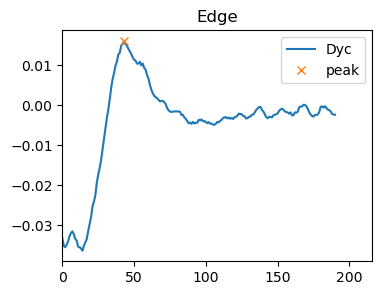

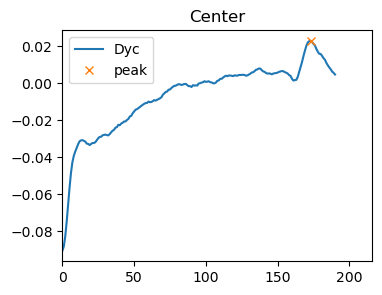

Time start: 68*10+incubtime
Time arrival: 198*10+incubtime
data_idx: 155
68 198
Pos 35
2023_12_08_TiTweez_pLPT20&pLPT41


<Figure size 400x300 with 0 Axes>

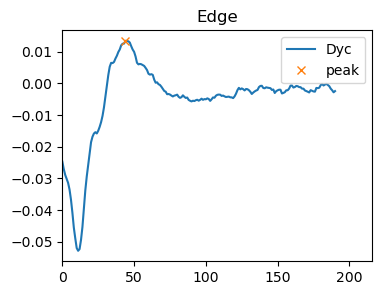

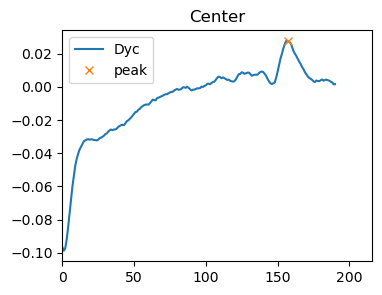

Time start: 69*10+incubtime
Time arrival: 182*10+incubtime
data_idx: 156
69 182
Pos 36
2023_12_08_TiTweez_pLPT20&pLPT41


<Figure size 400x300 with 0 Axes>

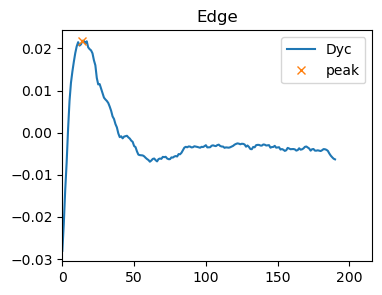

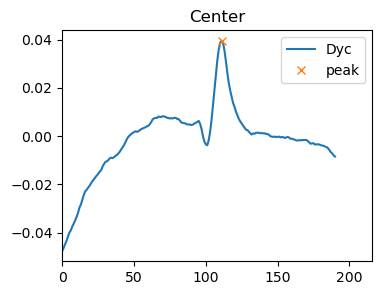

Time start: 39*10+incubtime
Time arrival: 136*10+incubtime
data_idx: 157
39 136
Pos 37
2023_12_08_TiTweez_pLPT20&pLPT41


<Figure size 400x300 with 0 Axes>

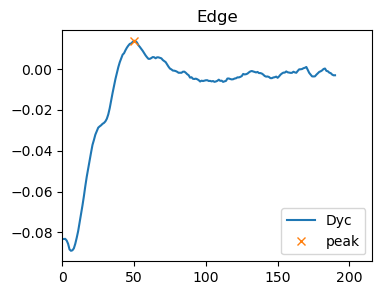

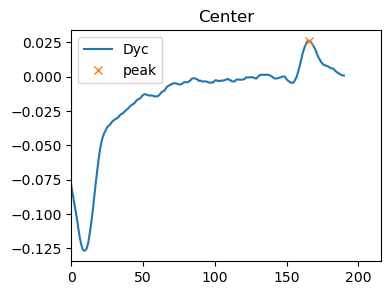

Time start: 75*10+incubtime
Time arrival: 191*10+incubtime
data_idx: 158
75 191
Pos 38
2023_12_08_TiTweez_pLPT20&pLPT41


<Figure size 400x300 with 0 Axes>

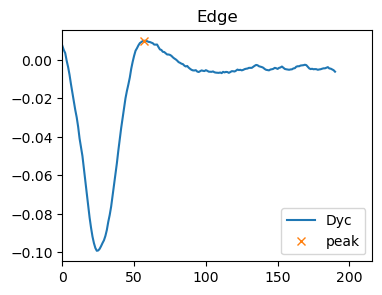

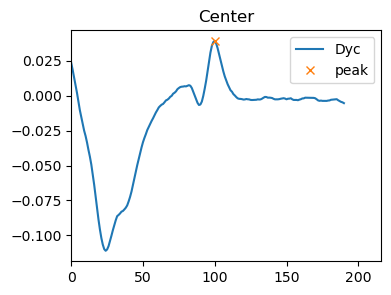

Time start: 82*10+incubtime
Time arrival: 125*10+incubtime
data_idx: 159
82 125


In [39]:
for pos in poss:
    t0e = 25
    t0c = 25
    print(f"Pos {pos}")
    print(f"{exp_date}_{scopes[scope_name]}_{vector}")
    path_scope = os.path.join(path_ext, scope_name)
    path = os.path.join(path_scope, exp_date)
    path_results = os.path.join(path, folder_results, f"pos{pos}")
    cdlrho = np.load(os.path.join(path_results, 'cdlrho.npy'))
    cdlrho = cdlrho[:216,:]
    edlrho = np.load(os.path.join(path_results, 'edlrho.npy'))
    edlrho = edlrho[:216,:]
    
    nt, _ = cdlrho.shape
    if fluo_chns == 3:
        plt.figure(figsize=(4,3))
        tedlrho = edlrho[t0e:,1]
        epeaks, _ = find_peaks(tedlrho)
        eidx = np.argsort(tedlrho[epeaks])[-1]
        #tedlrho = edlrho[25:,0]
        plt.figure(figsize=(4,3))
        plt.plot(edlrho[t0e:,1], label='Dry')   
        plt.plot(tedlrho, label='Drc')
        
        plt.plot(edlrho[t0e:,2], label='Dyc')
        plt.plot(epeaks[eidx], tedlrho[epeaks][eidx], 'x', label='peak')
        plt.title('Edge')
        plt.xlim([0,nt])
        plt.legend()
        plt.show()
        
        
        tcdlrho = cdlrho[t0c:,1]
        cpeaks, _ = find_peaks(tcdlrho)
        cidx = np.argsort(tcdlrho[cpeaks])[-1]
        #tedlrho = edlrho[25:,0]
        plt.figure(figsize=(4,3))
        plt.plot(cdlrho[t0c:,0], label='Dry')
        plt.plot(tcdlrho, label='Drc')
        
        plt.plot(cdlrho[t0c:,2], label='Dyc')
        plt.plot(cpeaks[cidx], tcdlrho[cpeaks][cidx], 'x', label='peak')
        plt.title('Center')
        plt.xlim([0,nt])
        plt.legend()
        plt.show()
        
        print(f"Time start: {epeaks[eidx]+t0e}*10+incubtime")
        print(f"Time arrival: {cpeaks[cidx]+t0c}*10+incubtime")
    if fluo_chns == 2:
        plt.figure(figsize=(4,3))
        tedlrho = edlrho[t0:,0]
        epeaks, _ = find_peaks(tedlrho)
        eidx = np.argsort(tedlrho[epeaks])[-1]
        #tedlrho = edlrho[25:,0]
        plt.figure(figsize=(4,3))
        plt.plot(tedlrho, label='Dyc')
        plt.plot(epeaks[eidx], tedlrho[epeaks][eidx], 'x', label='peak')
        plt.title('Edge')
        plt.xlim([0,nt])
        plt.legend()
        plt.show()
        
        
        tcdlrho = cdlrho[t0:,0]
        cpeaks, _ = find_peaks(tcdlrho)
        cidx = np.argsort(tcdlrho[cpeaks])[-1]
        #tedlrho = edlrho[25:,0]
        plt.figure(figsize=(4,3))
        plt.plot(tcdlrho, label='Dyc')
        plt.plot(cpeaks[cidx], tcdlrho[cpeaks][cidx], 'x', label='peak')
        plt.title('Center')
        plt.xlim([0,nt])
        plt.legend()
        plt.show()
        
        print(f"Time start: {epeaks[eidx]+t0e}*10+incubtime")
        print(f"Time arrival: {cpeaks[cidx]+t0c}*10+incubtime")
    #"""  
    data_idx = df[(df['Date'].dt.strftime('%Y_%m_%d') == exp_date) & 
        (df.Machine == scope_name) & 
        (df.Position == pos)].index[0]
    print(f"data_idx: {data_idx}")
    time_wave_start_guess = epeaks[eidx]+t0e
    time_wave_arrival_guess = cpeaks[cidx]+t0c
    print(time_wave_start_guess, time_wave_arrival_guess)
    df.at[data_idx,'time_wave_start_guess'] = time_wave_start_guess
    df.at[data_idx,'time_wave_arrival_guess'] = time_wave_arrival_guess
    #"""
    """
    dlkymo_rho = np.load(os.path.join(path_results, 'dlkymo_rho.npy'))
    edt = np.load(os.path.join(path_results, 'edt.npy'))
    nr = 64
    rw = 16
    rs = np.linspace(rw, edt.max(), nr)
    t0kymo = 0
    plot_dlrho(dlkymo_rho, edt, rs, pos, fluo_chns,t0kymo)
    """

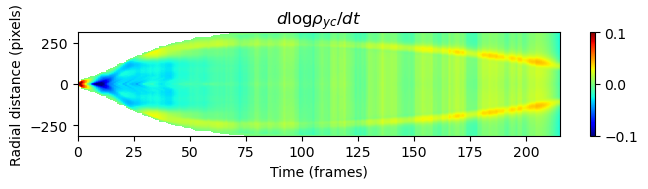

In [563]:
dlkymo_rho = np.load(os.path.join(path_results, 'dlkymo_rho.npy'))
edt = np.load(os.path.join(path_results, 'edt.npy'))
nr = 64
rw = 16
rs = np.linspace(rw, edt.max(), nr)
t0kymo = 0
plot_dlrho(dlkymo_rho, edt, rs, pos, fluo_chns,t0kymo)

In [37]:
dlkymo_rho.shape

(406, 64)

In [594]:
df[(df['Date'].dt.strftime('%Y_%m_%d') == exp_date) & 
    (df.Machine == scope_name) & 
    (df.Position == pos)].index[0]

117

In [595]:
data_idx = df[(df['Date'].dt.strftime('%Y_%m_%d') == exp_date) & 
    (df.Machine == scope_name) & 
    (df.Position == pos)].index[0]

In [596]:
time_wave_start_guess = epeaks[eidx]+t0
time_wave_arrival_guess = cpeaks[cidx]+t0
print(time_wave_start_guess, time_wave_arrival_guess)

52 96


In [597]:
df.at[data_idx,'time_wave_start_guess'] = time_wave_start_guess
df.at[data_idx,'time_wave_arrival_guess'] = 150#time_wave_arrival_guess

In [34]:
df.to_excel('data_processed.xlsx',index=False)

#### Finding peak at edge and center SOME pos

In [148]:
for i, pos in enumerate([20]):#(df_pos.Position.values):
    print(f"Pos {pos}")
    fname = f'{exp_date}_10x_1.0x_{dnas[vector]}_{scopes[scope_name]}_Pos{pos}.ome.tif'
    print(fname)
    path_im = os.path.join(path, fname)
    path_results = os.path.join(path, folder_results, f"pos{pos}")
    im_all = imread(path_im)
    im_fluo = im_all[:,:,:,:ph_chn]
    nt,nx,ny,nc = im_fluo.shape    
    path_results = os.path.join(path, folder_results, f"pos{pos}")
    edt = np.load(os.path.join(path_results,'edt.npy'))
    edt = edt[:,:,:]

    bg = np.zeros((nc,))
    for c in range(nc):
        bg[c] = im_fluo[0,:100,:100,c].mean()
    """
    ## center
    cmean = np.zeros((nt,nc))
    crho = np.zeros((nt,nc))
    clrho = np.zeros((nt,nc))
    cdlrho = np.zeros_like(clrho) + np.nan
    rw = 16
"""
    ## edge
    emean = np.zeros((nt,nc))
    erho = np.zeros((nt,nc))
    elrho = np.zeros((nt,nc))
    edlrho = np.zeros_like(elrho) + np.nan
    
    for t in range(nt):    
        tedt = edt[t,:,:]
        Rmax = tedt.max()
        """
        ## center
        cidx = tedt > Rmax - rw        
        if np.sum(cidx)>0:
            if fluo_chns == 3:
                cntim0 = im_fluo[t,:,:,rfp_chn].astype(float) - bg[rfp_chn]
                cntim1 = im_fluo[t,:,:,yfp_chn].astype(float) - bg[yfp_chn]
                cntim2 = im_fluo[t,:,:,cfp_chn].astype(float) - bg[cfp_chn]
                x,y,z = cntim0[cidx], cntim1[cidx], cntim2[cidx]
                cmean[t,rfp_chn] = x.mean()
                cmean[t,yfp_chn] = y.mean()
                cmean[t,cfp_chn] = z.mean()            
            elif fluo_chns == 2:                
                cntim0 = im_fluo[t,:,:,yfp_chn].astype(float) - bg[yfp_chn]
                cntim1 = im_fluo[t,:,:,cfp_chn].astype(float) - bg[cfp_chn]               
                x,y = cntim0[cidx], cntim1[cidx]
                cmean[t,yfp_chn] = x.mean()
                cmean[t,cfp_chn] = y.mean()
        """
        # edge
        eidx = (tedt < 2*30) & (tedt > 30)
        if np.sum(eidx)>0:
            if fluo_chns == 3:
                entim0 = im_fluo[t,:,:,rfp_chn].astype(float) - bg[rfp_chn]
                entim1 = im_fluo[t,:,:,yfp_chn].astype(float) - bg[yfp_chn]
                entim2 = im_fluo[t,:,:,cfp_chn].astype(float) - bg[cfp_chn]
                x,y,z = entim0[eidx], entim1[eidx], entim2[eidx]
                emean[t,rfp_chn] = x.mean()
                emean[t,yfp_chn] = y.mean()
                emean[t,cfp_chn] = z.mean()            
            elif fluo_chns == 2:                
                entim0 = im_fluo[t,:,:,yfp_chn].astype(float) - bg[yfp_chn]
                entim1 = im_fluo[t,:,:,cfp_chn].astype(float) - bg[cfp_chn]               
                x,y = entim0[eidx], entim1[eidx]
                emean[t,yfp_chn] = x.mean()
                emean[t,cfp_chn] = y.mean()
    """
    # center
    if fluo_chns == 3:
        crho[:,0] = cmean[:,0] / cmean[:,1] # ry
        crho[:,1] = cmean[:,0] / cmean[:,2] # rc
        crho[:,2] = cmean[:,1] / cmean[:,2] # yc
        clrho = np.log(crho)
     
    elif fluo_chns == 2:
        crho[:,0] = cmean[:,0] / cmean[:,1] # yc
        crho[:,1] = cmean[:,1] / cmean[:,0] # cy
        clrho = np.log(crho)
    for c in range(2):
        idx = ~np.isnan(clrho[:,c])
        cdlrho[idx,c] = savgol_filter(clrho[idx,c], 21, 3, deriv=1, axis=0)
    """
    # edge
    if fluo_chns == 3:
        erho[:,0] = emean[:,0] / emean[:,1] # ry
        erho[:,1] = emean[:,0] / emean[:,2] # rc
        erho[:,2] = emean[:,1] / emean[:,2] # yc
        elrho = np.log(erho)
    elif fluo_chns == 2:
        erho[:,0] = emean[:,0] / emean[:,1] # yc
        erho[:,1] = emean[:,1] / emean[:,0] # cy
        elrho = np.log(erho)
    for c in range(nc):
        idx = ~np.isnan(elrho[:,c])
        edlrho[idx,c] = savgol_filter(elrho[idx,c], 21, 3, deriv=1, axis=0)


Pos 20
2023_11_15_10x_1.0x_pLPT20&41_Ti_Pos20.ome.tif


In [ ]:
#np.save(os.path.join(path_results, 'cmean.npy'), cmean)
#np.save(os.path.join(path_results, 'crho.npy'), crho)
#np.save(os.path.join(path_results, 'clrho.npy'), clrho)
#np.save(os.path.join(path_results, 'cdlrho.npy'), cdlrho)
#np.save(os.path.join(path_results, 'emean.npy'), emean)
#np.save(os.path.join(path_results, 'erho.npy'), erho)              
#np.save(os.path.join(path_results, 'elrho.npy'), elrho)
#np.save(os.path.join(path_results, 'edlrho.npy'), edlrho)

<Figure size 400x300 with 0 Axes>

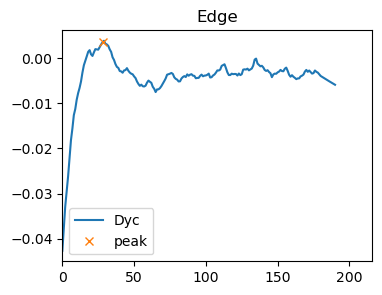

Time start: 53*10+incubtime


In [150]:
plt.figure(figsize=(4,3))
tedlrho = edlrho[t0:,0]
epeaks, _ = find_peaks(savgol_filter(tedlrho,21,3))
eidx = np.argsort(tedlrho[epeaks])[-1]
#tedlrho = edlrho[25:,0]
plt.figure(figsize=(4,3))
plt.plot(tedlrho, label='Dyc')
plt.plot(epeaks[eidx], tedlrho[epeaks][eidx], 'x', label='peak')
plt.title('Edge')
plt.xlim([0,nt])
plt.legend()
plt.show()
print(f"Time start: {epeaks[eidx]+t0}*10+incubtime")
#print(f"Time arrival: {cpeaks[cidx]+t0}*10+incubtime")

1

#### Finding peak at edge and center ALL

In [ ]:
for i, pos in enumerate(df_pos.Position.values):
    print(f"Pos {pos}")
    fname = f'{exp_date}_10x_1.0x_{dnas[vector]}_{scopes[scope_name]}_Pos{pos}.ome.tif'
    print(fname)
    path_im = os.path.join(path, fname)
    path_results = os.path.join(path, folder_results, f"pos{pos}")
    im_all = imread(path_im)
    im_fluo = im_all[:,:,:,:ph_chn]
    nt,nx,ny,nc = im_fluo.shape    
    path_results = os.path.join(path, folder_results, f"pos{pos}")
    edt = np.load(os.path.join(path_results,'edt.npy'))
    edt = edt[:,:,:]

    bg = np.zeros((nc,))
    for c in range(nc):
        bg[c] = im_fluo[0,:100,:100,c].mean()
    
    ## center
    cmean = np.zeros((nt,nc))
    crho = np.zeros((nt,nc))
    clrho = np.zeros((nt,nc))
    cdlrho = np.zeros_like(clrho) + np.nan
    rw = 16
    #Rmax = edt.max()

    ## edge
    emean = np.zeros((nt,nc))
    erho = np.zeros((nt,nc))
    elrho = np.zeros((nt,nc))
    edlrho = np.zeros_like(elrho) + np.nan
    
    for t in range(nt):    
        tedt = edt[t,:,:]
        Rmax = tedt.max()
        ## center
        cidx = tedt > Rmax - rw        
        if np.sum(cidx)>0:
            if fluo_chns == 3:
                cntim0 = im_fluo[t,:,:,rfp_chn].astype(float) - bg[rfp_chn]
                cntim1 = im_fluo[t,:,:,yfp_chn].astype(float) - bg[yfp_chn]
                cntim2 = im_fluo[t,:,:,cfp_chn].astype(float) - bg[cfp_chn]
                x,y,z = cntim0[cidx], cntim1[cidx], cntim2[cidx]
                cmean[t,rfp_chn] = x.mean()
                cmean[t,yfp_chn] = y.mean()
                cmean[t,cfp_chn] = z.mean()            
            elif fluo_chns == 2:                
                cntim0 = im_fluo[t,:,:,yfp_chn].astype(float) - bg[yfp_chn]
                cntim1 = im_fluo[t,:,:,cfp_chn].astype(float) - bg[cfp_chn]               
                x,y = cntim0[cidx], cntim1[cidx]
                cmean[t,yfp_chn] = x.mean()
                cmean[t,cfp_chn] = y.mean()
        # edge
        eidx = (tedt < 2*rw) & (tedt > rw)
        if np.sum(eidx)>0:
            if fluo_chns == 3:
                entim0 = im_fluo[t,:,:,rfp_chn].astype(float) - bg[rfp_chn]
                entim1 = im_fluo[t,:,:,yfp_chn].astype(float) - bg[yfp_chn]
                entim2 = im_fluo[t,:,:,cfp_chn].astype(float) - bg[cfp_chn]
                x,y,z = entim0[eidx], entim1[eidx], entim2[eidx]
                emean[t,rfp_chn] = x.mean()
                emean[t,yfp_chn] = y.mean()
                emean[t,cfp_chn] = z.mean()            
            elif fluo_chns == 2:                
                entim0 = im_fluo[t,:,:,yfp_chn].astype(float) - bg[yfp_chn]
                entim1 = im_fluo[t,:,:,cfp_chn].astype(float) - bg[cfp_chn]               
                x,y = entim0[eidx], entim1[eidx]
                emean[t,yfp_chn] = x.mean()
                emean[t,cfp_chn] = y.mean()
    # center
    if fluo_chns == 3:
        crho[:,0] = cmean[:,0] / cmean[:,1] # ry
        crho[:,1] = cmean[:,0] / cmean[:,2] # rc
        crho[:,2] = cmean[:,1] / cmean[:,2] # yc
        clrho = np.log(crho)
     
    elif fluo_chns == 2:
        crho[:,0] = cmean[:,0] / cmean[:,1] # yc
        crho[:,1] = cmean[:,1] / cmean[:,0] # cy
        clrho = np.log(crho)
    for c in range(2):
        idx = ~np.isnan(clrho[:,c])
        cdlrho[idx,c] = savgol_filter(clrho[idx,c], 21, 3, deriv=1, axis=0)
    # edge
    if fluo_chns == 3:
        erho[:,0] = emean[:,0] / emean[:,1] # ry
        erho[:,1] = emean[:,0] / emean[:,2] # rc
        erho[:,2] = emean[:,1] / emean[:,2] # yc
        elrho = np.log(erho)
    elif fluo_chns == 2:
        erho[:,0] = emean[:,0] / emean[:,1] # yc
        erho[:,1] = emean[:,1] / emean[:,0] # cy
        elrho = np.log(erho)
    for c in range(nc):
        idx = ~np.isnan(elrho[:,c])
        edlrho[idx,c] = savgol_filter(elrho[idx,c], 21, 3, deriv=1, axis=0)
    np.save(os.path.join(path_results, 'cmean.npy'), cmean)
    np.save(os.path.join(path_results, 'crho.npy'), crho)
    np.save(os.path.join(path_results, 'clrho.npy'), clrho)
    np.save(os.path.join(path_results, 'cdlrho.npy'), cdlrho)
    np.save(os.path.join(path_results, 'emean.npy'), emean)
    np.save(os.path.join(path_results, 'erho.npy'), erho)              
    np.save(os.path.join(path_results, 'elrho.npy'), elrho)
    np.save(os.path.join(path_results, 'edlrho.npy'), edlrho)

In [ ]:
wdlkymo_rho = np.load(os.path.join(path_results,'wdlkymo_rho.npy'))
#data = np.hstack([wdlkymo_rho[:,::-1,0],wdlkymo_rho[:,:,0]]).transpose()
#data = wdlkymo_rho[:,::-1,0].transpose()
data = savgol_filter(wdlkymo_rho[:,::-1,0].transpose(),31,3)
nt, nr, nc = wdlkymo_rho.shape
rads = np.zeros(nt)
for t in range(nt):
    print(t)
    peaks, _ = find_peaks(data[:,t])
    try:
        idx = np.argsort(data[peaks,t])[-1]
        rads[t] = peaks[idx]
        plt.plot(peaks[idx],data[peaks,t][idx],'.')
        plt.plot(data[:,t])
        plt.show()
    except:
        rads[t] = np.nan

In [97]:
df = pd.DataFrame(columns=['Position', 'Rads', 'Travel start', 'Travel end'])
rads_pad = {}
travel_pad = {}
#for i, pos in enumerate(df_pos.Position.values):
t0 = 40
tf = 170
for pos in [0]:#df_pos.Position.values:
    print(f"Pos{pos}")
    fname = f'{exp_date}_10x_1.0x_{vector}_{scopes[scope_name]}_Pos{pos}.ome.tif'
    path_results = os.path.join(path, folder_results, f"pos{pos}")
    #edt = np.load(os.path.join(path_results,'edt.npy'))
    #edt = edt[:,:,:]
    wdlkymo_rho = np.load(os.path.join(path_results,'wdlkymo_rho.npy'))
    nt, nr, _ = wdlkymo_rho.shape
    data = wdlkymo_rho[:,::-1,0].transpose()

    rads = np.zeros(tf-t0)
    vals = np.zeros(tf-t0)
    for i, t in enumerate(range(t0,tf)):
        #print(f"Time: {t}")
        peaks, _ = find_peaks(data[:,t])
        idx = np.argsort(data[peaks,t])[-1]
        #plt.plot(data[:,t])
        #plt.plot(peaks[idx],data[peaks[idx],t], 'x')
        #plt.show()
        rads[i] = peaks[idx]
        vals[i] = data[peaks[idx],t]

Pos0
